In [82]:
import subprocess
import os
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error
import scipy.optimize as so
import numpy as np
from datetime import datetime
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error
from math import sqrt
import subprocess
from scipy.optimize import curve_fit
sns.set()
sns.set_context('paper', font_scale=1.2)
from scipy.optimize import nnls#######################################################################################################################################################################################################
#######################################################################################################################################################################################################
# Path: Newsimulation.ipynb
#######################################################################################################################################################################################################
#######################################################################################################################################################################################################

# Parse EnergyPlus datetime string
energyplus_install_dir=r"D:\PhD_Academics\Buildings\Tharaka\Tharaka\EnergyPlusV9-6-0"
output_relative_directory =  r"D:\PhD_Academics\Buildings\Tharaka\Tharaka\meeting\james\week4_solar_and_new_cost_function\DOF_change"
idf_relative_filepath = r"D:\PhD_Academics\Buildings\Tharaka\Tharaka\meeting\james\week4_solar_and_new_cost_function\backup_august_8_23_original_workingfortraining\2statemodel\SmallOffice.idf"



#### SkyTEMPERATURE CHANGE
#idf_relative_filepath = r"D:\PhD_Academics\Buildings\Tharaka\Tharaka\meeting\james\week4_solar_and_new_cost_function\backup_august_8_23_original_workingfortraining\skytemperaturechange\SmallOffice.idf"




#epw_relative_filepath = r"D:\PhD_Academics\Buildings\Tharaka\Tharaka\meeting\james\week4_solar_and_new_cost_function\USA_GA_Atlanta-Fulton.County.AP-Brown.Field.722195_US.Normals.1991-2020.epw"
#epw_relative_filepath = r"D:\PhD_Academics\Buildings\Tharaka\Tharaka\meeting\james\week4_solar_and_new_cost_function\USA_WA_Bellingham.Intl.AP.727976_US.Normals.1981-2010.epw"
#epw_relative_filepath = r"D:\PhD_Academics\Buildings\Tharaka\Tharaka\USA_FL_Tallahassee.Intl.AP.722140_TMY3.epw"

epw_relative_filepath = r"D:\PhD_Academics\Buildings\Tharaka\Tharaka\meeting\james\Final\validation\USA_FL_Tallahassee.Intl.AP.722140_US.Normals.1991-2020.epw"
#epw_relative_filepath =  r"D:\PhD_Academics\Buildings\Tharaka\Tharaka\meeting\james\week4_solar_and_new_cost_function\validation\USA_NY_Albany.Intl.AP.725180_US.Normals.1991-2020.epw"
#USA_CO_Denver.Intl.AP.725650_US.Normals.1991-2020.epw

#mychange - idf_relative_filepath = r"D:\PhD_Academics\Buildings\Tharaka\Tharaka\AirflowNetwork_MultiZone_SmallOffice_VAV111.idf"
#USA_CA_San.Francisco.Intl.AP.724940_TMY3
#USA_CO_Golden-NREL.724666_TMY3
def run_command(cmd_string, capture_output=False):
    # sourcery skip: raise-specific-error
    result = subprocess.run(cmd_string, capture_output=capture_output)
    if result.returncode != 0:
        raise Exception(f'Command failed with return code: {result.returncode}')
    print('---RETURNCODE---\n', result.returncode, '(SUCCESS)')
    return result



# building command string
cl_st=(f'"{energyplus_install_dir}\\energyplus" '
       + '--readvars '
       + f'--output-directory "{output_relative_directory}" '
       + f'--weather "{epw_relative_filepath}" '
       + f'"{idf_relative_filepath}"'
      )


# running the simulation
run_command(cl_st)

---RETURNCODE---
 0 (SUCCESS)


CompletedProcess(args='"D:\\PhD_Academics\\Buildings\\Tharaka\\Tharaka\\EnergyPlusV9-6-0\\energyplus" --readvars --output-directory "D:\\PhD_Academics\\Buildings\\Tharaka\\Tharaka\\meeting\\james\\week4_solar_and_new_cost_function\\DOF_change" --weather "D:\\PhD_Academics\\Buildings\\Tharaka\\Tharaka\\meeting\\james\\Final\\validation\\USA_FL_Tallahassee.Intl.AP.722140_US.Normals.1991-2020.epw" "D:\\PhD_Academics\\Buildings\\Tharaka\\Tharaka\\meeting\\james\\week4_solar_and_new_cost_function\\backup_august_8_23_original_workingfortraining\\2statemodel\\SmallOffice.idf"', returncode=0)

In [83]:
# function to parse EnergyPlus datetime string
def parse_energyplus_datetime_string(st, year=2021):
    st = st.strip()
    month, day = map(int, [st[:2], st[3:5]])
    hour = int(st[7:9]) if st[7:9] != '24' else 0
    minute = int(st[10:12])
    dt = pd.Timestamp(year, month, day, hour, minute)
    return dt if st[7:9] != '24' else dt + pd.Timedelta('1 day')

In [84]:
df=pd.read_csv(r"D:\PhD_Academics\Buildings\Tharaka\Tharaka\meeting\james\week4_solar_and_new_cost_function\DOF_change\eplusout.csv",
               parse_dates=[0],
               index_col=[0],
               date_parser=parse_energyplus_datetime_string
              )

df_sim = pd.read_csv(r"D:\PhD_Academics\Buildings\Tharaka\Tharaka\meeting\james\week4_solar_and_new_cost_function\DOF_change\eplusout.csv")

C:\Users\USER\AppData\Local\Temp\ipykernel_21096\3946068532.py:1: FutureWarning: The argument 'date_parser' is deprecated and will be removed in a future version. Please use 'date_format' instead, or read your data in as 'object' dtype and then call 'to_datetime'.
  df=pd.read_csv(r"D:\PhD_Academics\Buildings\Tharaka\Tharaka\meeting\james\week4_solar_and_new_cost_function\DOF_change\eplusout.csv",


In [85]:
# all surface-temp columns
surf_cols = [c for c in df.columns if "Surface Inside Face Temperature" in c]

# surface names (unique)
surface_names = sorted({c.split(":")[0] for c in surf_cols})

print("Count =", len(surface_names))
print(surface_names[:50])


Count = 4
['ZN001', 'ZN002', 'ZN003', 'ZN004']


In [86]:
surf_cols = [c for c in df.columns if "Surface Inside Face Temperature" in c]
for c in surf_cols:
    print(c)

ZN001:WALL001:Surface Inside Face Temperature [C](TimeStep)
ZN001:WALL002:Surface Inside Face Temperature [C](TimeStep)
ZN001:WALL003:Surface Inside Face Temperature [C](TimeStep)
ZN001:WALL004:Surface Inside Face Temperature [C](TimeStep)
ZN001:FLR001:Surface Inside Face Temperature [C](TimeStep)
ZN001:CEIL001:Surface Inside Face Temperature [C](TimeStep)
ZN001:WALL004:DOOR002:Surface Inside Face Temperature [C](TimeStep)
ZN001:WALL001:DOOR003:Surface Inside Face Temperature [C](TimeStep)
ZN001:WALL003:DOOR001:Surface Inside Face Temperature [C](TimeStep)
ZN001:WALL001:WIN001:Surface Inside Face Temperature [C](TimeStep)
ZN002:WALL001:Surface Inside Face Temperature [C](TimeStep)
ZN002:WALL002:Surface Inside Face Temperature [C](TimeStep)
ZN002:WALL003:Surface Inside Face Temperature [C](TimeStep)
ZN002:WALL004:Surface Inside Face Temperature [C](TimeStep)
ZN002:WALL005:Surface Inside Face Temperature [C](TimeStep)
ZN002:FLR001:Surface Inside Face Temperature [C](TimeStep)
ZN002:CEIL0

In [87]:
zone_air_cols = [c for c in df.columns if "Zone Air Temperature" in c]
print("Found", len(zone_air_cols), "zone air temp columns:")
for c in zone_air_cols:
    print(c)


Found 4 zone air temp columns:
WEST ZONE:Zone Air Temperature [C](TimeStep)
EAST ZONE:Zone Air Temperature [C](TimeStep)
NORTH ZONE:Zone Air Temperature [C](TimeStep)
ATTIC ZONE:Zone Air Temperature [C](TimeStep)


In [88]:
from collections import defaultdict

# --- 1) Build mapping: ZN00X -> real zone name using Zone Air Temperature columns ---
# We assume order of ZN keys matches the order in the file for thermal zones,
# but safer is to map manually once you know it.
# Since your surface keys are ZN001..ZN004, we will map them by inspection.

# YOU set this based on your model (edit if needed):
zn_to_zone = {
    "ZN001": "NORTH ZONE",
    "ZN002": "WEST ZONE",
    "ZN003": "EAST ZONE",
    "ZN004": "ATTIC ZONE",
}

# --- 2) Collect surfaces from the surface temp columns ---
surf_cols = [c for c in df.columns if "Surface Inside Face Temperature" in c]

opaque = defaultdict(set)     # zone -> {WALL001, FLR001, ...}
subsur = defaultdict(set)     # zone -> {WALL001:WIN001, WALL004:DOOR002, ...}

for col in surf_cols:
    key = col.split(":Surface Inside Face Temperature")[0]  # e.g., "ZN001:WALL001:WIN001"
    parts = key.split(":")
    zn = parts[0]  # ZN001
    
    if len(parts) == 2:
        # Opaque surface (WALL/FLR/CEIL/ROOF)
        opaque[zn].add(parts[1])
    elif len(parts) >= 3:
        # Subsurface (window/door) referenced under a base surface
        subsur[zn].add(":".join(parts[1:]))  # e.g., "WALL001:WIN001"

# --- 3) Pretty print ---
for zn in sorted(set(list(opaque.keys()) + list(subsur.keys()))):
    zone_name = zn_to_zone.get(zn, "(unknown zone)")
    print("\n" + "="*70)
    print(f"{zone_name}  <->  {zn}")
    
    op = sorted(opaque.get(zn, []))
    ss = sorted(subsur.get(zn, []))
    
    print(f"Opaque surfaces ({len(op)}):")
    for s in op:
        print("  ", s)
        
    print(f"Subsurfaces (windows/doors) ({len(ss)}):")
    for s in ss:
        print("  ", s)



NORTH ZONE  <->  ZN001
Opaque surfaces (6):
   CEIL001
   FLR001
   WALL001
   WALL002
   WALL003
   WALL004
Subsurfaces (windows/doors) (4):
   WALL001:DOOR003
   WALL001:WIN001
   WALL003:DOOR001
   WALL004:DOOR002

WEST ZONE  <->  ZN002
Opaque surfaces (7):
   CEIL001
   FLR001
   WALL001
   WALL002
   WALL003
   WALL004
   WALL005
Subsurfaces (windows/doors) (1):
   WALL004:DOOR002

EAST ZONE  <->  ZN003
Opaque surfaces (7):
   CEIL001
   FLR001
   WALL001
   WALL002
   WALL003
   WALL004
   WALL005
Subsurfaces (windows/doors) (3):
   WALL002:DOOR004
   WALL002:WIN001
   WALL004:DOOR001

ATTIC ZONE  <->  ZN004
Opaque surfaces (14):
   FLR001
   FLR002
   FLR003
   ROOF001
   ROOF002
   ROOF003
   WALL001
   WALL002
   WALL003
   WALL004
   WALL005
   WALL006
   WALL007
   WALL008
Subsurfaces (windows/doors) (0):


In [61]:
'''
rename_dict = {
    "NORTH ZONE:Zone Air Temperature [C](TimeStep)": "North_Zone_Air_Temperature", 
    "WEST ZONE:Zone Air Temperature [C](TimeStep)": "West_Zone_Air_Temperature", 
    "EAST ZONE:Zone Air Temperature [C](TimeStep)": "East_Zone_Air_Temperature", 
    "Environment:Site Outdoor Air Drybulb Temperature [C](TimeStep)": "Ambient_Temperature", 
    "MAIN HEATING COIL 1:Heating Coil Heating Rate [W](TimeStep)": "Heating_Power", 
    "ZONE3TERMREHEAT:Zone Air Terminal Sensible Heating Rate [W](TimeStep)": "Heating_Power_Z1",
    "ZONE1TERMREHEAT:Zone Air Terminal Sensible Heating Rate [W](TimeStep)": "Heating_Power_Z2",
    "ZONE2TERMREHEAT:Zone Air Terminal Sensible Heating Rate [W](TimeStep)": "Heating_Power_Z3",
    "NORTH ZONE:Zone Windows Total Transmitted Solar Radiation Rate [W](TimeStep)": "North_Zone_Solar_Rate",
    "NORTH ZONE:Zone Windows Total Transmitted Solar Radiation Energy [J](TimeStep)": "North_Zone_Solar_Energy",
    "WEST ZONE:Zone Windows Total Transmitted Solar Radiation Rate [W](TimeStep)": "West_Zone_Solar_Rate",
    "WEST ZONE:Zone Windows Total Transmitted Solar Radiation Energy [J](TimeStep)": "West_Zone_Solar_Energy",
    "EAST ZONE:Zone Windows Total Transmitted Solar Radiation Rate [W](TimeStep)": "East_Zone_Solar_Rate",
    "EAST ZONE:Zone Windows Total Transmitted Solar Radiation Energy [J](TimeStep)": "East_Zone_Solar_Energy",
    "Date/Time": "Time"
}
df.rename(columns=rename_dict, inplace=True)
time_steps = np.arange(len(df))
df['time_steps'] = time_steps

In [89]:
rename_dict = {
    "NORTH ZONE:Zone Air Temperature [C](TimeStep)": "North_Zone_Air_Temperature", 
    "WEST ZONE:Zone Air Temperature [C](TimeStep)": "West_Zone_Air_Temperature", 
    "EAST ZONE:Zone Air Temperature [C](TimeStep)": "East_Zone_Air_Temperature", 

    "Environment:Site Outdoor Air Drybulb Temperature [C](TimeStep)": "Ambient_Temperature", 

    "MAIN HEATING COIL 1:Heating Coil Heating Rate [W](TimeStep)": "Heating_Power", 

    # Correct IDF-numbering heating mapping
    "ZONE1TERMREHEAT:Zone Air Terminal Sensible Heating Rate [W](TimeStep)": "Heating_Power_Z1",  # Z1 = WEST
    "ZONE2TERMREHEAT:Zone Air Terminal Sensible Heating Rate [W](TimeStep)": "Heating_Power_Z2",  # Z2 = EAST
    "ZONE3TERMREHEAT:Zone Air Terminal Sensible Heating Rate [W](TimeStep)": "Heating_Power_Z3",  # Z3 = NORTH

    "NORTH ZONE:Zone Windows Total Transmitted Solar Radiation Rate [W](TimeStep)": "North_Zone_Solar_Rate",
    "NORTH ZONE:Zone Windows Total Transmitted Solar Radiation Energy [J](TimeStep)": "North_Zone_Solar_Energy",

    "WEST ZONE:Zone Windows Total Transmitted Solar Radiation Rate [W](TimeStep)": "West_Zone_Solar_Rate",
    "WEST ZONE:Zone Windows Total Transmitted Solar Radiation Energy [J](TimeStep)": "West_Zone_Solar_Energy",

    "EAST ZONE:Zone Windows Total Transmitted Solar Radiation Rate [W](TimeStep)": "East_Zone_Solar_Rate",
    "EAST ZONE:Zone Windows Total Transmitted Solar Radiation Energy [J](TimeStep)": "East_Zone_Solar_Energy",

    "Date/Time": "Time"
}

df.rename(columns=rename_dict, inplace=True)
df["time_steps"] = np.arange(len(df))

In [90]:
minutes_to_plot = 2592000  # Define the number of minutes to plot

# Ensure that we have enough data to plot 200 minutes
if len(df) > minutes_to_plot:
    plot_data = df.iloc[:minutes_to_plot]
else:
    plot_data = df  # Not enough data, use what we have

# create and modify Heating Input column
df['Heating Input'] = df['Heating_Power'].apply(lambda x: 1 if x > 0 else 0).astype(int)
df['Heating_Input_Z1'] = df['Heating_Power_Z1'].apply(lambda x: 1 if x > 0 else 0).astype(int)
df['Heating_Input_Z2'] = df['Heating_Power_Z2'].apply(lambda x: 1 if x > 0 else 0).astype(int)
df['Heating_Input_Z3'] = df['Heating_Power_Z3'].apply(lambda x: 1 if x > 0 else 0).astype(int)

# Format the current date and time
timestamp = datetime.now().strftime('%Y-%m-%d_%H-%M-%S')


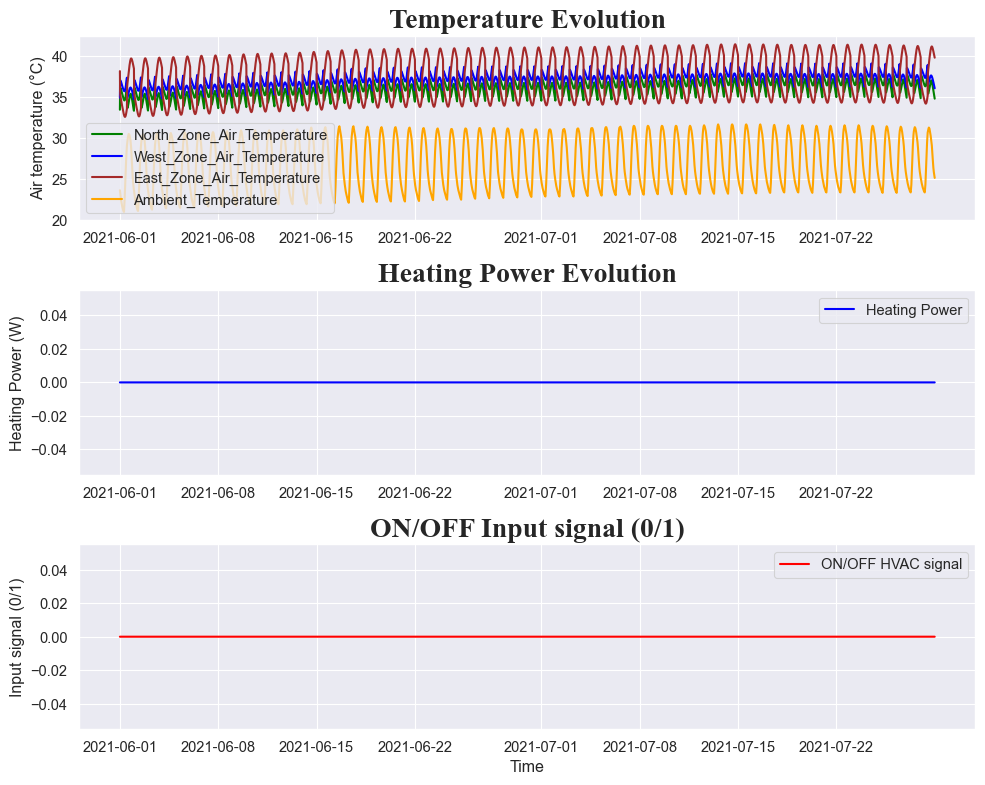

In [91]:
# Specify the path and filename and save the DataFrame to a new CSV file
file_path =  r"D:\PhD_Academics\Buildings\Tharaka\Tharaka\meeting\james\week4_solar_and_new_cost_function\DOF_change"
filename = f"{file_path}imulation_results_{timestamp}.csv"
filename2 = r'D:\PhD_Academics\Buildings\Tharaka\Tharaka\meeting\james\week4_solar_and_new_cost_function\DOF_change\Indoor_Temperatures2.csv'
# Specify the file path

df.to_csv(filename, index=False)
df.to_csv(filename2, index=False)


fig, axs = plt.subplots(3, 1, figsize=(10, 8), tight_layout=True)
minutes_to_plot = 2592000   # Define the number of minutes to plot

# Ensure that we have enough data to plot 200 minutes
if len(df) > minutes_to_plot:
    plot_data = df.iloc[:minutes_to_plot]
else:
    plot_data = df  # Not enough data, use what we have

# Plot T_int1, T_int2, T_int3, T_ext
for temp, color in zip(['North_Zone_Air_Temperature', 'West_Zone_Air_Temperature', 'East_Zone_Air_Temperature', 'Ambient_Temperature'], ['green', 'blue', 'brown', 'orange']):
    axs[0].plot(plot_data.index, plot_data[temp], color=color, linewidth=1.5, label=temp)
axs[0].set(ylabel='Temperature (°C)')
axs[0].legend(loc='best')
axs[0].set_ylabel('Air temperature (°C)')
axs[0].set_title('Temperature Evolution', fontname="Times New Roman", size=20, fontweight="bold")

# Plot P_hea1
axs[1].plot(plot_data.index, plot_data['Heating_Power'], color='blue', linewidth=1.5, label='Heating Power')
axs[1].set(ylabel='Heating Power (W)')
axs[1].legend(loc='best')
axs[1].set_ylabel('Heating Power (W)')
axs[1].set_title('Heating Power Evolution', fontname="Times New Roman", size=20, fontweight="bold")

# Plot P_hea2
axs[2].plot(plot_data.index, plot_data['Heating Input'], color='red', linewidth=1.5, label='ON/OFF HVAC signal')
axs[2].set(xlabel='Time', ylabel='P_hea2')
axs[2].legend(loc='best')
axs[2].set_ylabel('Input signal (0/1)')
axs[2].set_title('ON/OFF Input signal (0/1)', fontname="Times New Roman", size=20, fontweight="bold")



plt.show()

plt.show()





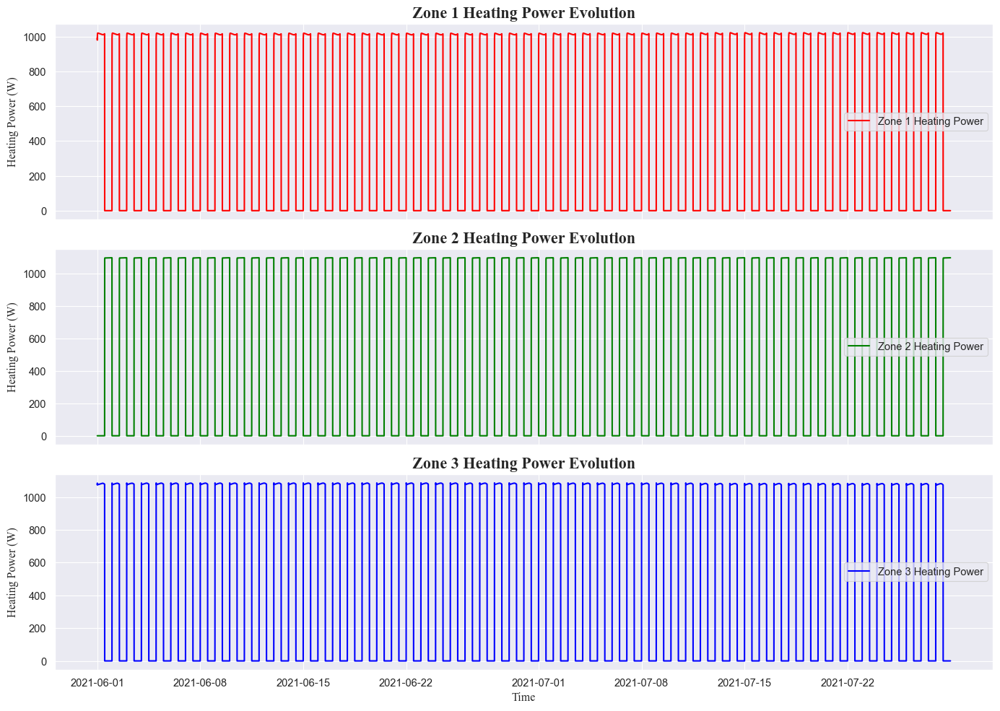

In [92]:
fig, axs = plt.subplots(3, 1, figsize=(14, 10), sharex=True)
# Plot for Zone 1
axs[0].plot(df.index, df['Heating_Power_Z1'], color='red', linewidth=1.5, label='Zone 1 Heating Power')
axs[0].set_ylabel('Heating Power (W)', fontname="Times New Roman")
axs[0].legend(loc='best')
axs[0].set_title('Zone 1 Heating Power Evolution', fontname="Times New Roman", size=16, fontweight="bold")

# Plot for Zone 2
axs[1].plot(df.index, df['Heating_Power_Z2'], color='green', linewidth=1.5, label='Zone 2 Heating Power')
axs[1].set_ylabel('Heating Power (W)', fontname="Times New Roman")
axs[1].legend(loc='best')
axs[1].set_title('Zone 2 Heating Power Evolution', fontname="Times New Roman", size=16, fontweight="bold")

# Plot for Zone 3
axs[2].plot(df.index, df['Heating_Power_Z3'], color='blue', linewidth=1.5, label='Zone 3 Heating Power')
axs[2].set_ylabel('Heating Power (W)', fontname="Times New Roman")
axs[2].set_xlabel('Time', fontname="Times New Roman")
axs[2].legend(loc='best')
axs[2].set_title('Zone 3 Heating Power Evolution', fontname="Times New Roman", size=16, fontweight="bold")

plt.tight_layout()
plt.show()

In [93]:
import numpy as np

# ============================================================
# FULL IDF-NUMBERING MAPPING BLOCK
#
# Actual IDF convention:
#   Zn001 = West Zone
#   Zn002 = East Zone
#   Zn003 = North Zone
#   Zn004 = Attic Zone
#
# Compact model convention used from now on:
#   Z1 = Zn001 = WEST
#   Z2 = Zn002 = EAST
#   Z3 = Zn003 = NORTH
#
# Wall sharing from IDF:
#   West  Zn001:Wall003 <-> North Zn003:Wall004
#   West  Zn001:Wall004 <-> East  Zn002:Wall004
#   North Zn003:Wall005 <-> East  Zn002:Wall005
#
# Compact partition convention:
#   Tw12 = Z1-Z2 = WEST-EAST
#   Tw13 = Z1-Z3 = WEST-NORTH
#   Tw23 = Z2-Z3 = EAST-NORTH
#
# Exterior openings:
#   West  Zn001:Wall001 has Door003 and Win001
#   North Zn003:Wall002 has Door004 and Win001
#   East  Zn002 has no exterior door/window in this IDF
# ============================================================

# ------------------------------------------------------------
# 0) Ensure Time column exists
# ------------------------------------------------------------
if "Time" not in df.columns:
    if "Date/Time" in df.columns:
        df.rename(columns={"Date/Time": "Time"}, inplace=True)
    else:
        candidates = [c for c in df.columns if ("date" in c.lower()) or ("time" in c.lower())]
        if candidates:
            df.rename(columns={candidates[0]: "Time"}, inplace=True)
        else:
            df["Time"] = np.arange(len(df))

if "time_steps" not in df.columns:
    df["time_steps"] = np.arange(len(df))

# ------------------------------------------------------------
# 1) IDF zone mapping
# ------------------------------------------------------------
IDF_ZONES = {
    "WEST":  "ZN001",
    "EAST":  "ZN002",
    "NORTH": "ZN003",
    "ATTIC": "ZN004",
}

ZONE_AIR_COL = {
    "WEST":  "West_Zone_Air_Temperature",
    "EAST":  "East_Zone_Air_Temperature",
    "NORTH": "North_Zone_Air_Temperature",
}

SOLAR_COL = {
    "WEST":  "West_Zone_Solar_Rate",
    "EAST":  "East_Zone_Solar_Rate",
    "NORTH": "North_Zone_Solar_Rate",
}

# IMPORTANT:
# This assumes the renamed heating columns follow pure IDF numbering:
#   Heating_Power_Z1 = ZONE1TERMREHEAT = WEST
#   Heating_Power_Z2 = ZONE2TERMREHEAT = EAST
#   Heating_Power_Z3 = ZONE3TERMREHEAT = NORTH
#
# If your rename_dict is still old, fix it before this block:
#   "ZONE1TERMREHEAT:Zone Air Terminal Sensible Heating Rate [W](TimeStep)" -> "Heating_Power_Z1"
#   "ZONE2TERMREHEAT:Zone Air Terminal Sensible Heating Rate [W](TimeStep)" -> "Heating_Power_Z2"
#   "ZONE3TERMREHEAT:Zone Air Terminal Sensible Heating Rate [W](TimeStep)" -> "Heating_Power_Z3"
HEATING_COL = {
    "WEST":  "Heating_Power_Z1",
    "EAST":  "Heating_Power_Z2",
    "NORTH": "Heating_Power_Z3",
}

# ------------------------------------------------------------
# 2) Column checks for zone-level signals
# ------------------------------------------------------------
base_required_cols = [
    "Ambient_Temperature",
    ZONE_AIR_COL["WEST"],
    ZONE_AIR_COL["EAST"],
    ZONE_AIR_COL["NORTH"],
    SOLAR_COL["WEST"],
    SOLAR_COL["EAST"],
    SOLAR_COL["NORTH"],
    HEATING_COL["WEST"],
    HEATING_COL["EAST"],
    HEATING_COL["NORTH"],
]

missing_base = [c for c in base_required_cols if c not in df.columns]
if missing_base:
    raise KeyError(
        "Missing required base columns. Check your rename_dict before running this block:\n"
        + "\n".join(missing_base)
    )

# ------------------------------------------------------------
# 3) Surface temperature column resolver
# ------------------------------------------------------------
def surface_temp_col(zn, wall):
    """
    Return exact EnergyPlus output column for a wall inside-face temperature.

    Example:
        surface_temp_col("ZN001", "WALL003")
    """
    zn = zn.upper()
    wall = wall.upper()

    target = f"{zn}:{wall}:Surface Inside Face Temperature [C](TimeStep)"

    if target in df.columns:
        return target

    # fallback: case-insensitive exact search
    target_lower = target.lower()
    matches = [c for c in df.columns if c.lower() == target_lower]

    if len(matches) == 1:
        return matches[0]

    raise KeyError(f"Could not find surface temperature column: {target}")


def optional_surface_temp_col(zn, wall):
    try:
        return surface_temp_col(zn, wall)
    except KeyError:
        return None

# ------------------------------------------------------------
# 4) IDF wall mapping
# ------------------------------------------------------------
WALL_MAP = {
    "WEST": {
        "zn": "ZN001",
        "exterior": ["WALL001", "WALL002"],
        "partitions": {
            "NORTH": "WALL003",
            "EAST":  "WALL004",
        },
        "exterior_openings": {
            "door":   ["ZN001:WALL001:DOOR003"],
            "window": ["ZN001:WALL001:WIN001"],
        },
    },

    "EAST": {
        "zn": "ZN002",
        "exterior": ["WALL001", "WALL002", "WALL003"],
        "partitions": {
            "WEST":  "WALL004",
            "NORTH": "WALL005",
        },
        "exterior_openings": {
            "door":   [],
            "window": [],
        },
    },

    "NORTH": {
        "zn": "ZN003",
        "exterior": ["WALL001", "WALL002", "WALL003"],
        "partitions": {
            "WEST": "WALL004",
            "EAST": "WALL005",
        },
        "exterior_openings": {
            "door":   ["ZN003:WALL002:DOOR004"],
            "window": ["ZN003:WALL002:WIN001"],
        },
    },
}

PARTITION_PAIRS = {
    # WEST-NORTH = Z1-Z3 = Tw13
    ("WEST", "NORTH"): {
        "west_side":  ("ZN001", "WALL003"),
        "north_side": ("ZN003", "WALL004"),
        "door_pair":  ("ZN001:WALL003:DOOR001", "ZN003:WALL004:DOOR001"),
    },

    # WEST-EAST = Z1-Z2 = Tw12
    ("WEST", "EAST"): {
        "west_side": ("ZN001", "WALL004"),
        "east_side": ("ZN002", "WALL004"),
        "door_pair": ("ZN001:WALL004:DOOR002", "ZN002:WALL004:DOOR002"),
    },

    # NORTH-EAST = Z3-Z2 = Tw23
    ("NORTH", "EAST"): {
        "north_side": ("ZN003", "WALL005"),
        "east_side":  ("ZN002", "WALL005"),
        "door_pair":  None,
    },
}

# ------------------------------------------------------------
# 5) Build IDF-based zone signals
# ------------------------------------------------------------
df["Tout"] = df["Ambient_Temperature"]

df["T_WEST"]  = df[ZONE_AIR_COL["WEST"]]
df["T_EAST"]  = df[ZONE_AIR_COL["EAST"]]
df["T_NORTH"] = df[ZONE_AIR_COL["NORTH"]]

df["U_WEST"]  = df[HEATING_COL["WEST"]]
df["U_EAST"]  = df[HEATING_COL["EAST"]]
df["U_NORTH"] = df[HEATING_COL["NORTH"]]

df["S_WEST"]  = df[SOLAR_COL["WEST"]]
df["S_EAST"]  = df[SOLAR_COL["EAST"]]
df["S_NORTH"] = df[SOLAR_COL["NORTH"]]

# ------------------------------------------------------------
# 6) Exterior wall temperature nodes
# ------------------------------------------------------------
def add_exterior_wall_nodes(zone_name, prefix):
    """
    Creates columns like:
        Tw_WEST_ext1, Tw_WEST_ext2, ...
    """
    zn = WALL_MAP[zone_name]["zn"]

    for k, wall in enumerate(WALL_MAP[zone_name]["exterior"], start=1):
        out_col = f"{prefix}_ext{k}"
        src_col = surface_temp_col(zn, wall)
        df[out_col] = df[src_col]
        print(f"{out_col} <- {zn}:{wall}")


add_exterior_wall_nodes("WEST",  "Tw_WEST")
add_exterior_wall_nodes("EAST",  "Tw_EAST")
add_exterior_wall_nodes("NORTH", "Tw_NORTH")

# ------------------------------------------------------------
# 7) Partition wall temperature nodes
# ------------------------------------------------------------
def add_partition_node(out_col, zone_a, zone_b):
    """
    Creates average partition temperature from both EnergyPlus wall-side temperatures.
    """
    pair = PARTITION_PAIRS[(zone_a, zone_b)]

    side_entries = []
    for key, val in pair.items():
        if key.endswith("_side"):
            side_entries.append(val)

    if len(side_entries) != 2:
        raise ValueError(f"Partition pair {zone_a}-{zone_b} does not have exactly two wall sides.")

    zn_a, wall_a = side_entries[0]
    zn_b, wall_b = side_entries[1]

    col_a = surface_temp_col(zn_a, wall_a)
    col_b = surface_temp_col(zn_b, wall_b)

    df[out_col] = 0.5 * (df[col_a] + df[col_b])

    print(f"{out_col} <- 0.5*({zn_a}:{wall_a} + {zn_b}:{wall_b})")


add_partition_node("Tw_WEST_NORTH", "WEST", "NORTH")
add_partition_node("Tw_WEST_EAST",  "WEST", "EAST")
add_partition_node("Tw_NORTH_EAST", "NORTH", "EAST")

# ------------------------------------------------------------
# 8) Create compact Z1/Z2/Z3 convention using pure IDF numbering
# ------------------------------------------------------------
# Pure IDF numbering:
#   Z1 = Zn001 = WEST
#   Z2 = Zn002 = EAST
#   Z3 = Zn003 = NORTH

df["Z1"] = df["T_WEST"]
df["Z2"] = df["T_EAST"]
df["Z3"] = df["T_NORTH"]

df["U1"] = df["U_WEST"]
df["U2"] = df["U_EAST"]
df["U3"] = df["U_NORTH"]

df["S1"] = df["S_WEST"]
df["S2"] = df["S_EAST"]
df["S3"] = df["S_NORTH"]

# Exterior wall aliases
df["Tw1inf1"] = df["Tw_WEST_ext1"]      # Z1/WEST exterior Wall001
df["Tw1inf2"] = df["Tw_WEST_ext2"]      # Z1/WEST exterior Wall002

df["Tw2inf1"] = df["Tw_EAST_ext1"]      # Z2/EAST exterior Wall001
df["Tw2inf2"] = df["Tw_EAST_ext2"]      # Z2/EAST exterior Wall002
df["Tw2inf3"] = df["Tw_EAST_ext3"]      # Z2/EAST exterior Wall003

df["Tw3inf1"] = df["Tw_NORTH_ext1"]     # Z3/NORTH exterior Wall001
df["Tw3inf2"] = df["Tw_NORTH_ext2"]     # Z3/NORTH exterior Wall002
df["Tw3inf3"] = df["Tw_NORTH_ext3"]     # Z3/NORTH exterior Wall003

# Partition aliases under pure IDF numbering:
#   Tw12 = Z1-Z2 = WEST-EAST
#   Tw13 = Z1-Z3 = WEST-NORTH
#   Tw23 = Z2-Z3 = EAST-NORTH

df["Tw12"] = df["Tw_WEST_EAST"]
df["Tw21"] = df["Tw_WEST_EAST"]

df["Tw13"] = df["Tw_WEST_NORTH"]
df["Tw31"] = df["Tw_WEST_NORTH"]

df["Tw23"] = df["Tw_NORTH_EAST"]        # same pair as EAST-NORTH
df["Tw32"] = df["Tw_NORTH_EAST"]

# ------------------------------------------------------------
# 9) Final dataframe
# ------------------------------------------------------------
model_cols = [
    "Time", "time_steps",
    "Z1", "Z2", "Z3", "Tout",
    "U1", "U2", "U3",
    "S1", "S2", "S3",

    # exterior wall states
    "Tw1inf1", "Tw1inf2",
    "Tw2inf1", "Tw2inf2", "Tw2inf3",
    "Tw3inf1", "Tw3inf2", "Tw3inf3",

    # partition wall states
    "Tw12", "Tw21",
    "Tw13", "Tw31",
    "Tw23", "Tw32",

    # clearer IDF-based names
    "T_WEST", "T_EAST", "T_NORTH",
    "U_WEST", "U_EAST", "U_NORTH",
    "S_WEST", "S_EAST", "S_NORTH",
    "Tw_WEST_ext1", "Tw_WEST_ext2",
    "Tw_EAST_ext1", "Tw_EAST_ext2", "Tw_EAST_ext3",
    "Tw_NORTH_ext1", "Tw_NORTH_ext2", "Tw_NORTH_ext3",
    "Tw_WEST_NORTH", "Tw_WEST_EAST", "Tw_NORTH_EAST",
]

missing = [c for c in model_cols if c not in df.columns]
if missing:
    raise KeyError(f"Missing columns after mapping block: {missing}")

model_df = df[model_cols].copy()

print("\nPure IDF numbering mapping applied successfully.")
print("Z1 = Zn001 = WEST")
print("Z2 = Zn002 = EAST")
print("Z3 = Zn003 = NORTH")
print("Tw12 = WEST-EAST")
print("Tw13 = WEST-NORTH")
print("Tw23 = EAST-NORTH")

print("\nmodel_df shape:", model_df.shape)
print("model_df columns:")
for c in model_df.columns:
    print(" ", c)

print("\nInputs preview:")
print(model_df[["U1", "U2", "U3", "S1", "S2", "S3"]].head())

print("\nZone preview:")
print(model_df[["Z1", "Z2", "Z3"]].head())

print("\nWall/partition preview:")
print(model_df[
    [
        "Tw1inf1", "Tw1inf2",
        "Tw2inf1", "Tw2inf2", "Tw2inf3",
        "Tw3inf1", "Tw3inf2", "Tw3inf3",
        "Tw12", "Tw13", "Tw23",
    ]
].head())


Tw_WEST_ext1 <- ZN001:WALL001
Tw_WEST_ext2 <- ZN001:WALL002
Tw_EAST_ext1 <- ZN002:WALL001
Tw_EAST_ext2 <- ZN002:WALL002
Tw_EAST_ext3 <- ZN002:WALL003
Tw_NORTH_ext1 <- ZN003:WALL001
Tw_NORTH_ext2 <- ZN003:WALL002
Tw_NORTH_ext3 <- ZN003:WALL003
Tw_WEST_NORTH <- 0.5*(ZN001:WALL003 + ZN003:WALL004)
Tw_WEST_EAST <- 0.5*(ZN001:WALL004 + ZN002:WALL004)
Tw_NORTH_EAST <- 0.5*(ZN003:WALL005 + ZN002:WALL005)

Pure IDF numbering mapping applied successfully.
Z1 = Zn001 = WEST
Z2 = Zn002 = EAST
Z3 = Zn003 = NORTH
Tw12 = WEST-EAST
Tw13 = WEST-NORTH
Tw23 = EAST-NORTH

model_df shape: (83520, 46)
model_df columns:
  Time
  time_steps
  Z1
  Z2
  Z3
  Tout
  U1
  U2
  U3
  S1
  S2
  S3
  Tw1inf1
  Tw1inf2
  Tw2inf1
  Tw2inf2
  Tw2inf3
  Tw3inf1
  Tw3inf2
  Tw3inf3
  Tw12
  Tw21
  Tw13
  Tw31
  Tw23
  Tw32
  T_WEST
  T_EAST
  T_NORTH
  U_WEST
  U_EAST
  U_NORTH
  S_WEST
  S_EAST
  S_NORTH
  Tw_WEST_ext1
  Tw_WEST_ext2
  Tw_EAST_ext1
  Tw_EAST_ext2
  Tw_EAST_ext3
  Tw_NORTH_ext1
  Tw_NORTH_ext2
  Tw_NORT

In [94]:
# ------------------------------------------------------------
# 1) Time settings and split
#
N = len(model_df)
Ts = None

try:
    idx_dt = pd.to_datetime(model_df.index, errors="coerce")
    idx_dt = idx_dt[~idx_dt.isna()]
    if len(idx_dt) >= 2:
        dt_sec = pd.Series(idx_dt).diff().dt.total_seconds().dropna()
        dt_sec = dt_sec[np.isfinite(dt_sec) & (dt_sec > 0)]
        if len(dt_sec) > 0:
            Ts = float(dt_sec.mode().iloc[0])
            print(f"Inferred Ts from model_df.index = {Ts} seconds")
except Exception as e:
    print("Index-based Ts inference failed:", e)

if Ts is None:
    Ts = 60.0
    print(f"Falling back to manual Ts = {Ts} seconds")

samples_per_day = int(round(24 * 3600 / Ts))

# IMPROVED: recent-window training, still enough coverage
train_days = 14
val_days = 7

needed_days = train_days + val_days
available_days = N // samples_per_day

print("N =", N)
print("Ts =", Ts)
print("samples_per_day =", samples_per_day)
print("available_days =", available_days)

if available_days < needed_days:
    raise ValueError(
        f"Need at least {needed_days} full days ({train_days} train + {val_days} val). "
        f"Available full days = {available_days}."
    )

# use the MOST RECENT train+val block instead of always starting at 0
start_day = available_days - needed_days
start_idx = start_day * samples_per_day

idx_train = np.arange(start_idx,
                      start_idx + train_days * samples_per_day,
                      dtype=int)

idx_val = np.arange(start_idx + train_days * samples_per_day,
                    start_idx + (train_days + val_days) * samples_per_day,
                    dtype=int)

t_train = np.arange(len(idx_train), dtype=float) * (Ts / 60.0)
t_val = np.arange(len(idx_val), dtype=float) * (Ts / 60.0)

print("start_day =", start_day)
print("train_days =", train_days)
print("val_days =", val_days)
print("len(idx_train) =", len(idx_train))
print("len(idx_val) =", len(idx_val))


Inferred Ts from model_df.index = 60.0 seconds
N = 83520
Ts = 60.0
samples_per_day = 1440
available_days = 58
start_day = 37
train_days = 14
val_days = 7
len(idx_train) = 20160
len(idx_val) = 10080



================ IDF-numbering UKF training setup ================
Z1 = Zn001 = WEST
Z2 = Zn002 = EAST
Z3 = Zn003 = NORTH
Tw12 = WEST-EAST
Tw13 = WEST-NORTH
Tw23 = EAST-NORTH
UKF training step 1000/20160 done
UKF training step 2000/20160 done
UKF training step 3000/20160 done
UKF training step 4000/20160 done
UKF training step 5000/20160 done
UKF training step 6000/20160 done
UKF training step 7000/20160 done
UKF training step 8000/20160 done
UKF training step 9000/20160 done
UKF training step 10000/20160 done
UKF training step 11000/20160 done
UKF training step 12000/20160 done
UKF training step 13000/20160 done
UKF training step 14000/20160 done
UKF training step 15000/20160 done
UKF training step 16000/20160 done
UKF training step 17000/20160 done
UKF training step 18000/20160 done
UKF training step 19000/20160 done
UKF training step 20000/20160 done

Frozen parameter estimates:
C1 = 499997
C2 = 499999
C3 = 499998
Cw1inf1 = 200000
Cw1inf2 = 200000
Cw2inf1 = 200002
Cw2inf2 = 200001


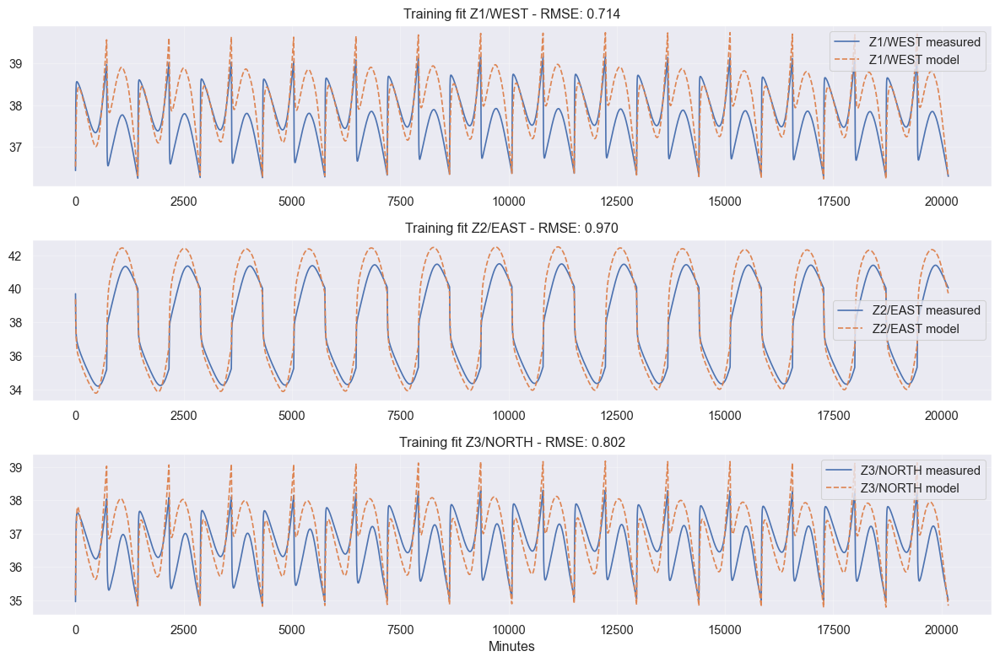

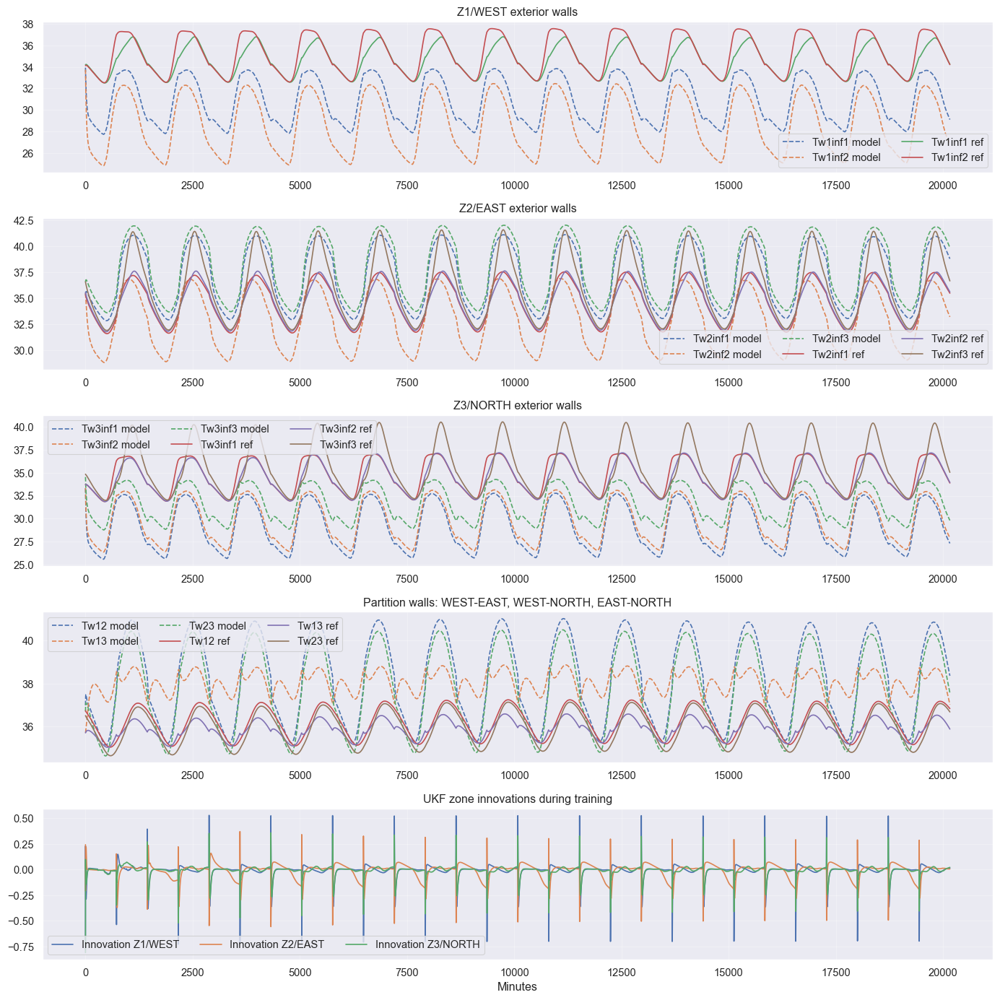


Saved variables:
Xa_train_augukf_zoneonly_trainfit
Yhat_train_augukf_zoneonly_trainfit
Innov_train_augukf_zoneonly_trainfit
theta_hat_augukf_zoneonly_trainfit
Xa_train_roll_augukf_zoneonly_trainfit
Yhat_train_roll_augukf_zoneonly_trainfit


In [95]:
# ============================================================
# IDF-NUMBERING AUGMENTED UKF SETUP + TRAINING-PERIOD FIT
#
# PURE IDF convention:
#   Z1 = Zn001 = WEST
#   Z2 = Zn002 = EAST
#   Z3 = Zn003 = NORTH
#
# Required model_df convention before running this block:
#   model_df["Z1"] = West zone air temperature
#   model_df["Z2"] = East zone air temperature
#   model_df["Z3"] = North zone air temperature
#
#   model_df["U1"] = West heating
#   model_df["U2"] = East heating
#   model_df["U3"] = North heating
#
#   model_df["S1"] = West solar
#   model_df["S2"] = East solar
#   model_df["S3"] = North solar
#
#   Tw1inf* = WEST exterior walls
#   Tw2inf* = EAST exterior walls
#   Tw3inf* = NORTH exterior walls
#
#   Tw12 = WEST-EAST
#   Tw13 = WEST-NORTH
#   Tw23 = EAST-NORTH
#
# Requires already created:
#   model_df, idx_train, t_train, Ts, samples_per_day
#
# Logic:
#   - Zone measurements only in UKF update
#   - Wall temperatures only for initialization and plotting
#   - Parameters frozen after training
#   - Open-loop rollout on training period
#   - Includes direct outside/infiltration:
#       K1inf*(Tout - Z1), K2inf*(Tout - Z2), K3inf*(Tout - Z3)
# ============================================================

import numpy as np
import matplotlib.pyplot as plt

# ------------------------------------------------------------
# 0) Required-column check and pull signals
# ------------------------------------------------------------
required_cols = [
    "Z1", "Z2", "Z3", "Tout",
    "U1", "U2", "U3",
    "S1", "S2", "S3",
    "Tw1inf1", "Tw1inf2",
    "Tw2inf1", "Tw2inf2", "Tw2inf3",
    "Tw3inf1", "Tw3inf2", "Tw3inf3",
    "Tw12", "Tw13", "Tw23",
]

missing_required = [c for c in required_cols if c not in model_df.columns]
if missing_required:
    raise KeyError(
        "model_df is missing required columns:\n"
        + "\n".join(missing_required)
        + "\n\nRun the corrected IDF-numbering mapping block first."
    )

Z1 = model_df["Z1"].to_numpy(dtype=float)      # WEST / Zn001
Z2 = model_df["Z2"].to_numpy(dtype=float)      # EAST / Zn002
Z3 = model_df["Z3"].to_numpy(dtype=float)      # NORTH / Zn003
Tout = model_df["Tout"].to_numpy(dtype=float)

U1 = model_df["U1"].to_numpy(dtype=float)      # WEST heating
U2 = model_df["U2"].to_numpy(dtype=float)      # EAST heating
U3 = model_df["U3"].to_numpy(dtype=float)      # NORTH heating

S1 = model_df["S1"].to_numpy(dtype=float)      # WEST solar
S2 = model_df["S2"].to_numpy(dtype=float)      # EAST solar
S3 = model_df["S3"].to_numpy(dtype=float)      # NORTH solar

Tw1inf1_ref = model_df["Tw1inf1"].to_numpy(dtype=float)
Tw1inf2_ref = model_df["Tw1inf2"].to_numpy(dtype=float)

Tw2inf1_ref = model_df["Tw2inf1"].to_numpy(dtype=float)
Tw2inf2_ref = model_df["Tw2inf2"].to_numpy(dtype=float)
Tw2inf3_ref = model_df["Tw2inf3"].to_numpy(dtype=float)

Tw3inf1_ref = model_df["Tw3inf1"].to_numpy(dtype=float)
Tw3inf2_ref = model_df["Tw3inf2"].to_numpy(dtype=float)
Tw3inf3_ref = model_df["Tw3inf3"].to_numpy(dtype=float)

Tw12_ref = model_df["Tw12"].to_numpy(dtype=float)   # WEST-EAST
Tw13_ref = model_df["Tw13"].to_numpy(dtype=float)   # WEST-NORTH
Tw23_ref = model_df["Tw23"].to_numpy(dtype=float)   # EAST-NORTH

N = len(model_df)

print("\n================ IDF-numbering UKF training setup ================")
print("Z1 = Zn001 = WEST")
print("Z2 = Zn002 = EAST")
print("Z3 = Zn003 = NORTH")
print("Tw12 = WEST-EAST")
print("Tw13 = WEST-NORTH")
print("Tw23 = EAST-NORTH")

# ------------------------------------------------------------
# 1) Physical state and parameter definitions
# ------------------------------------------------------------
state_names = [
    "Z1", "Z2", "Z3",
    "Tw1inf1", "Tw1inf2",
    "Tw2inf1", "Tw2inf2", "Tw2inf3",
    "Tw3inf1", "Tw3inf2", "Tw3inf3",
    "Tw12", "Tw13", "Tw23",
]

n_phys = len(state_names)
n_y = 3

param_names_aug = [
    # zone capacitances
    "C1", "C2", "C3",

    # exterior-wall capacitances
    "Cw1inf1", "Cw1inf2",
    "Cw2inf1", "Cw2inf2", "Cw2inf3",
    "Cw3inf1", "Cw3inf2", "Cw3inf3",

    # partition-wall capacitances
    "Cw12", "Cw13", "Cw23",

    # zone-to-exterior-wall conductances
    "K1inf1", "K1inf2",
    "K2inf1", "K2inf2", "K2inf3",
    "K3inf1", "K3inf2", "K3inf3",

    # exterior-wall-to-outdoor conductances
    "Ko1inf1", "Ko1inf2",
    "Ko2inf1", "Ko2inf2", "Ko2inf3",
    "Ko3inf1", "Ko3inf2", "Ko3inf3",

    # partition conductances, zone-side to wall-node
    "K12_1", "K12_2",
    "K13_1", "K13_3",
    "K23_2", "K23_3",

    # direct infiltration/outdoor coupling for each zone
    "K1inf", "K2inf", "K3inf",

    # heating gains
    "Ku1", "Ku2", "Ku3",

    # solar gains
    "Ks1", "Ks2", "Ks3",
]

n_param = len(param_names_aug)
n_aug = n_phys + n_param

def unpack_theta(theta):
    return dict(zip(param_names_aug, theta))

# ------------------------------------------------------------
# 2) Projection / bounds
# ------------------------------------------------------------
def project_aug_state(xa):
    xa = np.asarray(xa, dtype=float).copy()

    xa[:n_phys] = np.nan_to_num(
        xa[:n_phys],
        nan=20.0,
        posinf=80.0,
        neginf=-20.0,
    )
    xa[:n_phys] = np.clip(xa[:n_phys], -20.0, 80.0)

    theta = xa[n_phys:]
    theta = np.nan_to_num(theta, nan=1.0, posinf=1e6, neginf=1e-9)
    theta = np.clip(theta, 1e-9, 1e6)

    xa[n_phys:] = theta
    return xa

# ------------------------------------------------------------
# 3) Initial augmented state
# ------------------------------------------------------------
def safe_ref(arr, k, fallback):
    val = arr[k]
    if np.isfinite(val):
        return float(val)
    return float(fallback)

def make_theta0():
    theta0 = []

    # C1,C2,C3
    theta0 += [5e5, 5e5, 5e5]

    # wall capacitances: 2 + 3 + 3 exterior walls + 3 partition walls = 11
    theta0 += [
        2e5, 2e5,
        2e5, 2e5, 2e5,
        2e5, 2e5, 2e5,
        2e5, 2e5, 2e5,
    ]

    # zone-to-exterior-wall conductances: 2 + 3 + 3 = 8
    theta0 += [
        100, 100,
        100, 100, 100,
        100, 100, 100,
    ]

    # exterior-wall-to-outdoor conductances: 2 + 3 + 3 = 8
    theta0 += [
        50, 50,
        50, 50, 50,
        50, 50, 50,
    ]

    # partition conductances
    theta0 += [100, 100, 100, 100, 100, 100]

    # direct infiltration/outdoor conductances
    theta0 += [20, 20, 20]

    # heating gains
    theta0 += [1.0, 1.0, 1.0]

    # solar gains
    theta0 += [0.1, 0.1, 0.1]

    theta0 = np.array(theta0, dtype=float)

    if len(theta0) != n_param:
        raise ValueError(f"theta0 length {len(theta0)} != n_param {n_param}")

    return theta0

def make_xa0(k0):
    z1 = float(Z1[k0])
    z2 = float(Z2[k0])
    z3 = float(Z3[k0])

    x0 = np.array([
        z1, z2, z3,

        safe_ref(Tw1inf1_ref, k0, z1),
        safe_ref(Tw1inf2_ref, k0, z1),

        safe_ref(Tw2inf1_ref, k0, z2),
        safe_ref(Tw2inf2_ref, k0, z2),
        safe_ref(Tw2inf3_ref, k0, z2),

        safe_ref(Tw3inf1_ref, k0, z3),
        safe_ref(Tw3inf2_ref, k0, z3),
        safe_ref(Tw3inf3_ref, k0, z3),

        safe_ref(Tw12_ref, k0, 0.5 * (z1 + z2)),
        safe_ref(Tw13_ref, k0, 0.5 * (z1 + z3)),
        safe_ref(Tw23_ref, k0, 0.5 * (z2 + z3)),
    ], dtype=float)

    xa0 = np.r_[x0, make_theta0()]
    return project_aug_state(xa0)

def make_P0():
    P0 = np.eye(n_aug) * 1e-3
    P0[:n_phys, :n_phys] *= 100.0
    P0[n_phys:, n_phys:] *= 1e5
    return P0

# ------------------------------------------------------------
# 4) Continuous-time dynamics
# ------------------------------------------------------------
def f_phys_cont(x, theta, u):
    p = unpack_theta(theta)

    Z1_, Z2_, Z3_ = x[0], x[1], x[2]

    Tw1a, Tw1b = x[3], x[4]
    Tw2a, Tw2b, Tw2c = x[5], x[6], x[7]
    Tw3a, Tw3b, Tw3c = x[8], x[9], x[10]

    Tw12_, Tw13_, Tw23_ = x[11], x[12], x[13]

    Tout_, U1_, U2_, U3_, S1_, S2_, S3_ = u

    dx = np.zeros_like(x)

    # Z1 = WEST. Connected to:
    # exterior walls Tw1inf1,Tw1inf2
    # Z2/EAST through Tw12
    # Z3/NORTH through Tw13
    q1 = (
        p["K1inf1"] * (Tw1a - Z1_)
        + p["K1inf2"] * (Tw1b - Z1_)
        + p["K12_1"] * (Tw12_ - Z1_)
        + p["K13_1"] * (Tw13_ - Z1_)
        + p["K1inf"] * (Tout_ - Z1_)
        + p["Ku1"] * U1_
        + p["Ks1"] * S1_
    )

    # Z2 = EAST. Connected to:
    # exterior walls Tw2inf1,Tw2inf2,Tw2inf3
    # Z1/WEST through Tw12
    # Z3/NORTH through Tw23
    q2 = (
        p["K2inf1"] * (Tw2a - Z2_)
        + p["K2inf2"] * (Tw2b - Z2_)
        + p["K2inf3"] * (Tw2c - Z2_)
        + p["K12_2"] * (Tw12_ - Z2_)
        + p["K23_2"] * (Tw23_ - Z2_)
        + p["K2inf"] * (Tout_ - Z2_)
        + p["Ku2"] * U2_
        + p["Ks2"] * S2_
    )

    # Z3 = NORTH. Connected to:
    # exterior walls Tw3inf1,Tw3inf2,Tw3inf3
    # Z1/WEST through Tw13
    # Z2/EAST through Tw23
    q3 = (
        p["K3inf1"] * (Tw3a - Z3_)
        + p["K3inf2"] * (Tw3b - Z3_)
        + p["K3inf3"] * (Tw3c - Z3_)
        + p["K13_3"] * (Tw13_ - Z3_)
        + p["K23_3"] * (Tw23_ - Z3_)
        + p["K3inf"] * (Tout_ - Z3_)
        + p["Ku3"] * U3_
        + p["Ks3"] * S3_
    )

    dx[0] = q1 / p["C1"]
    dx[1] = q2 / p["C2"]
    dx[2] = q3 / p["C3"]

    # Exterior walls
    dx[3] = (p["K1inf1"] * (Z1_ - Tw1a) + p["Ko1inf1"] * (Tout_ - Tw1a)) / p["Cw1inf1"]
    dx[4] = (p["K1inf2"] * (Z1_ - Tw1b) + p["Ko1inf2"] * (Tout_ - Tw1b)) / p["Cw1inf2"]

    dx[5] = (p["K2inf1"] * (Z2_ - Tw2a) + p["Ko2inf1"] * (Tout_ - Tw2a)) / p["Cw2inf1"]
    dx[6] = (p["K2inf2"] * (Z2_ - Tw2b) + p["Ko2inf2"] * (Tout_ - Tw2b)) / p["Cw2inf2"]
    dx[7] = (p["K2inf3"] * (Z2_ - Tw2c) + p["Ko2inf3"] * (Tout_ - Tw2c)) / p["Cw2inf3"]

    dx[8] = (p["K3inf1"] * (Z3_ - Tw3a) + p["Ko3inf1"] * (Tout_ - Tw3a)) / p["Cw3inf1"]
    dx[9] = (p["K3inf2"] * (Z3_ - Tw3b) + p["Ko3inf2"] * (Tout_ - Tw3b)) / p["Cw3inf2"]
    dx[10] = (p["K3inf3"] * (Z3_ - Tw3c) + p["Ko3inf3"] * (Tout_ - Tw3c)) / p["Cw3inf3"]

    # Partition walls
    # Tw12 = WEST-EAST
    # Tw13 = WEST-NORTH
    # Tw23 = EAST-NORTH
    dx[11] = (p["K12_1"] * (Z1_ - Tw12_) + p["K12_2"] * (Z2_ - Tw12_)) / p["Cw12"]
    dx[12] = (p["K13_1"] * (Z1_ - Tw13_) + p["K13_3"] * (Z3_ - Tw13_)) / p["Cw13"]
    dx[13] = (p["K23_2"] * (Z2_ - Tw23_) + p["K23_3"] * (Z3_ - Tw23_)) / p["Cw23"]

    return dx

def f_aug_disc(xa, u, Ts, n_substeps=1):
    xa = project_aug_state(xa)

    x = xa[:n_phys].copy()
    theta = xa[n_phys:].copy()

    dt = Ts / float(n_substeps)

    for _ in range(n_substeps):
        k1 = f_phys_cont(x, theta, u)
        k2 = f_phys_cont(x + 0.5 * dt * k1, theta, u)
        k3 = f_phys_cont(x + 0.5 * dt * k2, theta, u)
        k4 = f_phys_cont(x + dt * k3, theta, u)

        x = x + (dt / 6.0) * (k1 + 2*k2 + 2*k3 + k4)
        x = np.nan_to_num(x, nan=20.0, posinf=80.0, neginf=-20.0)
        x = np.clip(x, -20.0, 80.0)

    return project_aug_state(np.r_[x, theta])

def h_aug(xa):
    return np.asarray(xa[:3], dtype=float)

# ------------------------------------------------------------
# 5) Numerically robust UKF
# ------------------------------------------------------------
class RobustUKF:
    def __init__(self, f_func, h_func, n_x, n_y, alpha=0.1, beta=2.0, kappa=0.0):
        self.f_func = f_func
        self.h_func = h_func
        self.n_x = int(n_x)
        self.n_y = int(n_y)

        self.alpha = float(alpha)
        self.beta = float(beta)
        self.kappa = float(kappa)

        self.lam = self.alpha**2 * (self.n_x + self.kappa) - self.n_x
        self.c = self.n_x + self.lam

        if self.c <= 0:
            raise ValueError("Invalid UKF scaling: n_x + lambda must be positive.")

        self.gamma = np.sqrt(self.c)

        self.Wm = np.full(2 * self.n_x + 1, 1.0 / (2.0 * self.c))
        self.Wc = np.full(2 * self.n_x + 1, 1.0 / (2.0 * self.c))

        self.Wm[0] = self.lam / self.c
        self.Wc[0] = self.lam / self.c + (1.0 - self.alpha**2 + self.beta)

    def _sym(self, P):
        return 0.5 * (P + P.T)

    def _sym_psd(self, P, floor=1e-8, ceil=1e10):
        P = self._sym(np.asarray(P, dtype=float))
        P = np.nan_to_num(P, nan=0.0, posinf=ceil, neginf=-ceil)

        try:
            eigval, eigvec = np.linalg.eigh(P)
            eigval = np.clip(eigval, floor, ceil)
            P_psd = eigvec @ np.diag(eigval) @ eigvec.T
            return self._sym(P_psd)
        except np.linalg.LinAlgError:
            return np.eye(P.shape[0]) * floor

    def _sigma_points(self, x, P):
        x = project_aug_state(x)
        P = self._sym_psd(P, floor=1e-8)

        eye = np.eye(self.n_x)
        jitter = 1e-8

        for _ in range(15):
            try:
                S = np.linalg.cholesky(P + jitter * eye)
                break
            except np.linalg.LinAlgError:
                jitter *= 10.0
        else:
            P = self._sym_psd(P + 1e-4 * eye, floor=1e-6)
            S = np.linalg.cholesky(P + 1e-6 * eye)

        X = np.zeros((2 * self.n_x + 1, self.n_x))
        X[0] = x

        for i in range(self.n_x):
            dx = self.gamma * S[:, i]
            X[i + 1] = project_aug_state(x + dx)
            X[self.n_x + i + 1] = project_aug_state(x - dx)

        return X

    def predict(self, x, P, Q, u, Ts):
        X = self._sigma_points(x, P)

        Xp = np.zeros_like(X)
        for i in range(X.shape[0]):
            Xp[i] = self.f_func(X[i], u, Ts)

        x_pred = np.sum(self.Wm[:, None] * Xp, axis=0)
        x_pred = project_aug_state(x_pred)

        P_pred = np.array(Q, dtype=float).copy()
        for i in range(Xp.shape[0]):
            d = (Xp[i] - x_pred).reshape(-1, 1)
            P_pred += self.Wc[i] * (d @ d.T)

        P_pred = self._sym_psd(P_pred, floor=1e-8)
        return x_pred, P_pred, Xp

    def update(self, x_pred, P_pred, Xp, R, y):
        Y = np.zeros((Xp.shape[0], self.n_y))

        for i in range(Xp.shape[0]):
            Y[i] = self.h_func(Xp[i])

        y_pred = np.sum(self.Wm[:, None] * Y, axis=0)
        y_pred = np.nan_to_num(y_pred, nan=20.0, posinf=80.0, neginf=-20.0)

        S = np.array(R, dtype=float).copy()
        Pxy = np.zeros((self.n_x, self.n_y))

        for i in range(Xp.shape[0]):
            dx = (Xp[i] - x_pred).reshape(-1, 1)
            dy = (Y[i] - y_pred).reshape(-1, 1)

            S += self.Wc[i] * (dy @ dy.T)
            Pxy += self.Wc[i] * (dx @ dy.T)

        S = self._sym_psd(S, floor=1e-6, ceil=1e8)
        S += 1e-5 * np.eye(self.n_y)

        innov = np.asarray(y, dtype=float) - y_pred
        innov = np.nan_to_num(innov, nan=0.0, posinf=0.0, neginf=0.0)

        try:
            K = np.linalg.solve(S.T, Pxy.T).T
        except np.linalg.LinAlgError:
            K = Pxy @ np.linalg.pinv(S)

        x_upd = x_pred + K @ innov
        x_upd = project_aug_state(x_upd)

        P_upd = P_pred - K @ S @ K.T
        P_upd = self._sym_psd(P_upd, floor=1e-8)

        return x_upd, P_upd, y_pred, innov

ukf = RobustUKF(
    f_func=f_aug_disc,
    h_func=h_aug,
    n_x=n_aug,
    n_y=n_y,
    alpha=0.1,
    beta=2.0,
    kappa=0.0,
)

# ------------------------------------------------------------
# 6) Q/R matrices
# ------------------------------------------------------------
Q = np.eye(n_aug) * 1e-8
Q[:n_phys, :n_phys] = np.eye(n_phys) * 1e-4
Q[n_phys:, n_phys:] = np.eye(n_param) * 1e-5

R = np.eye(n_y) * (0.05**2)

# ------------------------------------------------------------
# 7) UKF training: zone measurements only
# ------------------------------------------------------------
def run_augmented_ukf_zone_only(idx, xa0=None, P0=None):
    xa = make_xa0(int(idx[0])) if xa0 is None else project_aug_state(np.array(xa0, dtype=float).copy())
    P = make_P0() if P0 is None else 0.5 * (np.array(P0, dtype=float) + np.array(P0, dtype=float).T)

    Xa_hist = np.zeros((len(idx), n_aug))
    Yhat_hist = np.zeros((len(idx), n_y))
    Innov_hist = np.zeros((len(idx), n_y))

    for j, k in enumerate(idx):
        u_k = np.array([Tout[k], U1[k], U2[k], U3[k], S1[k], S2[k], S3[k]], dtype=float)
        y_k = np.array([Z1[k], Z2[k], Z3[k]], dtype=float)

        xa_pred, P_pred, Xp = ukf.predict(xa, P, Q, u_k, Ts)
        xa, P, y_pred, innov = ukf.update(xa_pred, P_pred, Xp, R, y_k)

        xa = project_aug_state(xa)

        Xa_hist[j] = xa
        Yhat_hist[j] = y_pred
        Innov_hist[j] = innov

        if (j + 1) % 1000 == 0:
            print(f"UKF training step {j+1}/{len(idx)} done")

    return Xa_hist, Yhat_hist, Innov_hist, xa, P

Xa_train, Yhat_train, Innov_train, xa_last, P_last = run_augmented_ukf_zone_only(
    idx=idx_train,
    xa0=None,
    P0=None,
)

# ------------------------------------------------------------
# 8) Freeze parameters from final part of training
# ------------------------------------------------------------
tail_len = min(1 * samples_per_day, len(Xa_train))
theta_hat = np.mean(Xa_train[-tail_len:, n_phys:], axis=0)
theta_hat = project_aug_state(np.r_[np.zeros(n_phys), theta_hat])[n_phys:]

print("\nFrozen parameter estimates:")
for name, val in zip(param_names_aug, theta_hat):
    print(f"{name} = {val:.6g}")

# ------------------------------------------------------------
# 9) Build training-start rollout initial state
# ------------------------------------------------------------
xa_train0 = np.array(Xa_train[0], dtype=float).copy()
xa_train0[n_phys:] = theta_hat
xa_train0 = project_aug_state(xa_train0)

# ------------------------------------------------------------
# 10) Pure open-loop rollout on training period
# ------------------------------------------------------------
def simulate_open_loop_train(idx, xa0):
    xa = project_aug_state(np.array(xa0, dtype=float).copy())
    xa[n_phys:] = theta_hat

    Xa_sim = np.zeros((len(idx), n_aug))
    Yhat_sim = np.zeros((len(idx), 3))

    for j, k in enumerate(idx):
        u_k = np.array([Tout[k], U1[k], U2[k], U3[k], S1[k], S2[k], S3[k]], dtype=float)

        xa = f_aug_disc(xa, u_k, Ts, n_substeps=1)
        xa[n_phys:] = theta_hat
        xa = project_aug_state(xa)

        Xa_sim[j] = xa
        Yhat_sim[j] = xa[:3]

    return Xa_sim, Yhat_sim

Xa_train_roll, Yhat_train_roll = simulate_open_loop_train(
    idx=idx_train,
    xa0=xa_train0,
)

# ------------------------------------------------------------
# 11) RMSE on training period
# ------------------------------------------------------------
def rmse(a, b):
    a = np.asarray(a, dtype=float)
    b = np.asarray(b, dtype=float)
    return np.sqrt(np.mean((a - b) ** 2))

Y_train_meas = np.column_stack([Z1[idx_train], Z2[idx_train], Z3[idx_train]])

train_fit_rmse_z1 = rmse(Z1[idx_train], Yhat_train_roll[:, 0])
train_fit_rmse_z2 = rmse(Z2[idx_train], Yhat_train_roll[:, 1])
train_fit_rmse_z3 = rmse(Z3[idx_train], Yhat_train_roll[:, 2])
train_fit_rmse_all = np.sqrt(np.mean((Y_train_meas - Yhat_train_roll) ** 2))

print("\nTraining-period open-loop RMSE:")
print(f"Z1/WEST  = {train_fit_rmse_z1:.6f}")
print(f"Z2/EAST  = {train_fit_rmse_z2:.6f}")
print(f"Z3/NORTH = {train_fit_rmse_z3:.6f}")
print(f"Overall  = {train_fit_rmse_all:.6f}")

# ------------------------------------------------------------
# 12) Zone plots
# ------------------------------------------------------------
plt.figure(figsize=(12, 8))

ax1 = plt.subplot(3, 1, 1)
ax1.plot(t_train, Z1[idx_train], label="Z1/WEST measured")
ax1.plot(t_train, Yhat_train_roll[:, 0], "--", label="Z1/WEST model")
ax1.set_title(f"Training fit Z1/WEST - RMSE: {train_fit_rmse_z1:.3f}")
ax1.grid(True, alpha=0.3)
ax1.legend()

ax2 = plt.subplot(3, 1, 2, sharex=ax1)
ax2.plot(t_train, Z2[idx_train], label="Z2/EAST measured")
ax2.plot(t_train, Yhat_train_roll[:, 1], "--", label="Z2/EAST model")
ax2.set_title(f"Training fit Z2/EAST - RMSE: {train_fit_rmse_z2:.3f}")
ax2.grid(True, alpha=0.3)
ax2.legend()

ax3 = plt.subplot(3, 1, 3, sharex=ax1)
ax3.plot(t_train, Z3[idx_train], label="Z3/NORTH measured")
ax3.plot(t_train, Yhat_train_roll[:, 2], "--", label="Z3/NORTH model")
ax3.set_title(f"Training fit Z3/NORTH - RMSE: {train_fit_rmse_z3:.3f}")
ax3.set_xlabel("Minutes")
ax3.grid(True, alpha=0.3)
ax3.legend()

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# 13) Wall-state plots
# ------------------------------------------------------------
Xtrain_roll_phys = Xa_train_roll[:, :n_phys]

plt.figure(figsize=(14, 14))

ax1 = plt.subplot(5, 1, 1)
ax1.plot(t_train, Xtrain_roll_phys[:, 3], "--", label="Tw1inf1 model")
ax1.plot(t_train, Xtrain_roll_phys[:, 4], "--", label="Tw1inf2 model")
ax1.plot(t_train, Tw1inf1_ref[idx_train], label="Tw1inf1 ref")
ax1.plot(t_train, Tw1inf2_ref[idx_train], label="Tw1inf2 ref")
ax1.set_title("Z1/WEST exterior walls")
ax1.grid(True, alpha=0.3)
ax1.legend(ncol=2)

ax2 = plt.subplot(5, 1, 2, sharex=ax1)
ax2.plot(t_train, Xtrain_roll_phys[:, 5], "--", label="Tw2inf1 model")
ax2.plot(t_train, Xtrain_roll_phys[:, 6], "--", label="Tw2inf2 model")
ax2.plot(t_train, Xtrain_roll_phys[:, 7], "--", label="Tw2inf3 model")
ax2.plot(t_train, Tw2inf1_ref[idx_train], label="Tw2inf1 ref")
ax2.plot(t_train, Tw2inf2_ref[idx_train], label="Tw2inf2 ref")
ax2.plot(t_train, Tw2inf3_ref[idx_train], label="Tw2inf3 ref")
ax2.set_title("Z2/EAST exterior walls")
ax2.grid(True, alpha=0.3)
ax2.legend(ncol=3)

ax3 = plt.subplot(5, 1, 3, sharex=ax1)
ax3.plot(t_train, Xtrain_roll_phys[:, 8], "--", label="Tw3inf1 model")
ax3.plot(t_train, Xtrain_roll_phys[:, 9], "--", label="Tw3inf2 model")
ax3.plot(t_train, Xtrain_roll_phys[:, 10], "--", label="Tw3inf3 model")
ax3.plot(t_train, Tw3inf1_ref[idx_train], label="Tw3inf1 ref")
ax3.plot(t_train, Tw3inf2_ref[idx_train], label="Tw3inf2 ref")
ax3.plot(t_train, Tw3inf3_ref[idx_train], label="Tw3inf3 ref")
ax3.set_title("Z3/NORTH exterior walls")
ax3.grid(True, alpha=0.3)
ax3.legend(ncol=3)

ax4 = plt.subplot(5, 1, 4, sharex=ax1)
ax4.plot(t_train, Xtrain_roll_phys[:, 11], "--", label="Tw12 model")
ax4.plot(t_train, Xtrain_roll_phys[:, 12], "--", label="Tw13 model")
ax4.plot(t_train, Xtrain_roll_phys[:, 13], "--", label="Tw23 model")
ax4.plot(t_train, Tw12_ref[idx_train], label="Tw12 ref")
ax4.plot(t_train, Tw13_ref[idx_train], label="Tw13 ref")
ax4.plot(t_train, Tw23_ref[idx_train], label="Tw23 ref")
ax4.set_title("Partition walls: WEST-EAST, WEST-NORTH, EAST-NORTH")
ax4.grid(True, alpha=0.3)
ax4.legend(ncol=3)

ax5 = plt.subplot(5, 1, 5, sharex=ax1)
ax5.plot(t_train, Innov_train[:, 0], label="Innovation Z1/WEST")
ax5.plot(t_train, Innov_train[:, 1], label="Innovation Z2/EAST")
ax5.plot(t_train, Innov_train[:, 2], label="Innovation Z3/NORTH")
ax5.set_title("UKF zone innovations during training")
ax5.set_xlabel("Minutes")
ax5.grid(True, alpha=0.3)
ax5.legend(ncol=3)

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# 14) Save outputs
# ------------------------------------------------------------
Xa_train_augukf_zoneonly_trainfit = Xa_train
Yhat_train_augukf_zoneonly_trainfit = Yhat_train
Innov_train_augukf_zoneonly_trainfit = Innov_train

theta_hat_augukf_zoneonly_trainfit = theta_hat

Xa_train_roll_augukf_zoneonly_trainfit = Xa_train_roll
Yhat_train_roll_augukf_zoneonly_trainfit = Yhat_train_roll

idx_train_augukf_zoneonly_trainfit = idx_train
t_train_augukf_zoneonly_trainfit = t_train

print("\nSaved variables:")
print("Xa_train_augukf_zoneonly_trainfit")
print("Yhat_train_augukf_zoneonly_trainfit")
print("Innov_train_augukf_zoneonly_trainfit")
print("theta_hat_augukf_zoneonly_trainfit")
print("Xa_train_roll_augukf_zoneonly_trainfit")
print("Yhat_train_roll_augukf_zoneonly_trainfit")



================ Corrected IDF-numbering validation setup ================
Zone convention:
  Z1 = Zn001 = WEST
  Z2 = Zn002 = EAST
  Z3 = Zn003 = NORTH

State order:
  x[00] = Z1
  x[01] = Z2
  x[02] = Z3
  x[03] = Tw1inf1
  x[04] = Tw1inf2
  x[05] = Tw2inf1
  x[06] = Tw2inf2
  x[07] = Tw2inf3
  x[08] = Tw3inf1
  x[09] = Tw3inf2
  x[10] = Tw3inf3
  x[11] = Tw12
  x[12] = Tw13
  x[13] = Tw23

Partition meaning:
  Tw12 = WEST-EAST
  Tw13 = WEST-NORTH
  Tw23 = EAST-NORTH

Direct Kinf parameters:
  K1inf / WEST  = 2.17947
  K2inf / EAST  = 37.2877
  K3inf / NORTH = 1.26505

===== PURE OPEN-LOOP VALIDATION RMSE =====
Z1/WEST        RMSE =   0.67788   MAE =   0.51358   MaxAbs =   1.89868
Z2/EAST        RMSE =   0.92482   MAE =   0.73807   MaxAbs =   1.94736
Z3/NORTH       RMSE =   0.73026   MAE =   0.61555   MaxAbs =   1.61416
Overall        RMSE =   0.78488

===== CARRY-TRAIN-LAST OPEN-LOOP VALIDATION RMSE =====
Z1/WEST        RMSE =   0.67939   MAE =   0.51463   MaxAbs =   1.89868
Z2/EAS

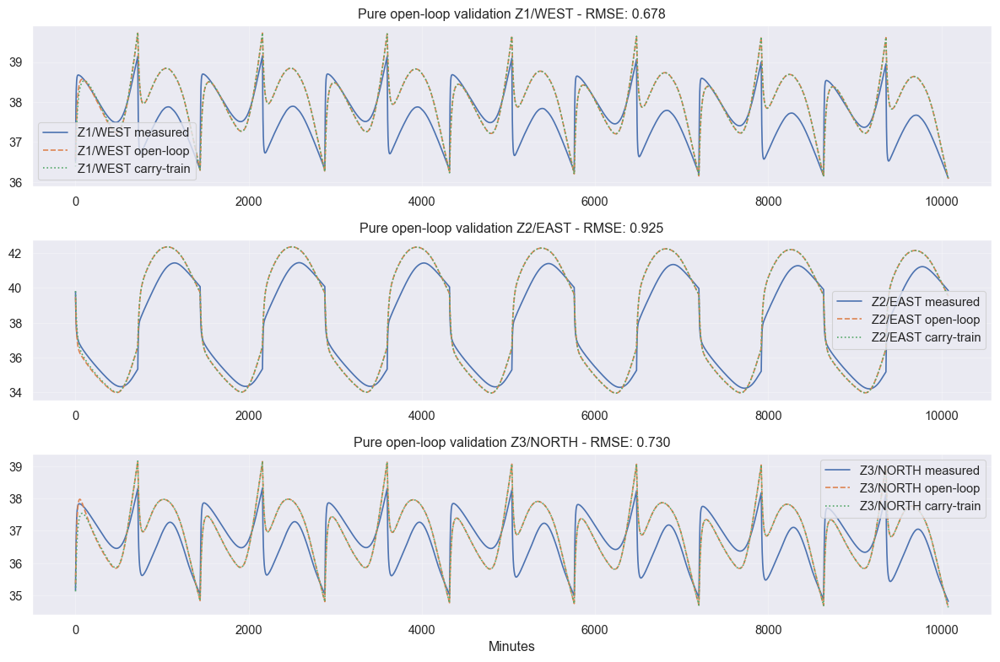


===== H-STEP-AHEAD VALIDATION RMSE =====

1-step ahead:
  Z1/WEST  = 0.030203
  Z2/EAST  = 0.106675
  Z3/NORTH = 0.036450
  Overall  = 0.067381

2-step ahead:
  Z1/WEST  = 0.056557
  Z2/EAST  = 0.190620
  Z3/NORTH = 0.071578
  Overall  = 0.122008

5-step ahead:
  Z1/WEST  = 0.117876
  Z2/EAST  = 0.345665
  Z3/NORTH = 0.169435
  Overall  = 0.232442

10-step ahead:
  Z1/WEST  = 0.182372
  Z2/EAST  = 0.425502
  Z3/NORTH = 0.300765
  Overall  = 0.318732

20-step ahead:
  Z1/WEST  = 0.246072
  Z2/EAST  = 0.381656
  Z3/NORTH = 0.443799
  Overall  = 0.366593

30-step ahead:
  Z1/WEST  = 0.271010
  Z2/EAST  = 0.319940
  Z3/NORTH = 0.480839
  Overall  = 0.368336

50-step ahead:
  Z1/WEST  = 0.286685
  Z2/EAST  = 0.315713
  Z3/NORTH = 0.444212
  Overall  = 0.355522

RMSE summary by horizon:
   horizon_steps  horizon_minutes  rmse_z1_west  rmse_z2_east  rmse_z3_north  \
0              1              1.0      0.030203      0.106675       0.036450   
1              2              2.0      0.056557

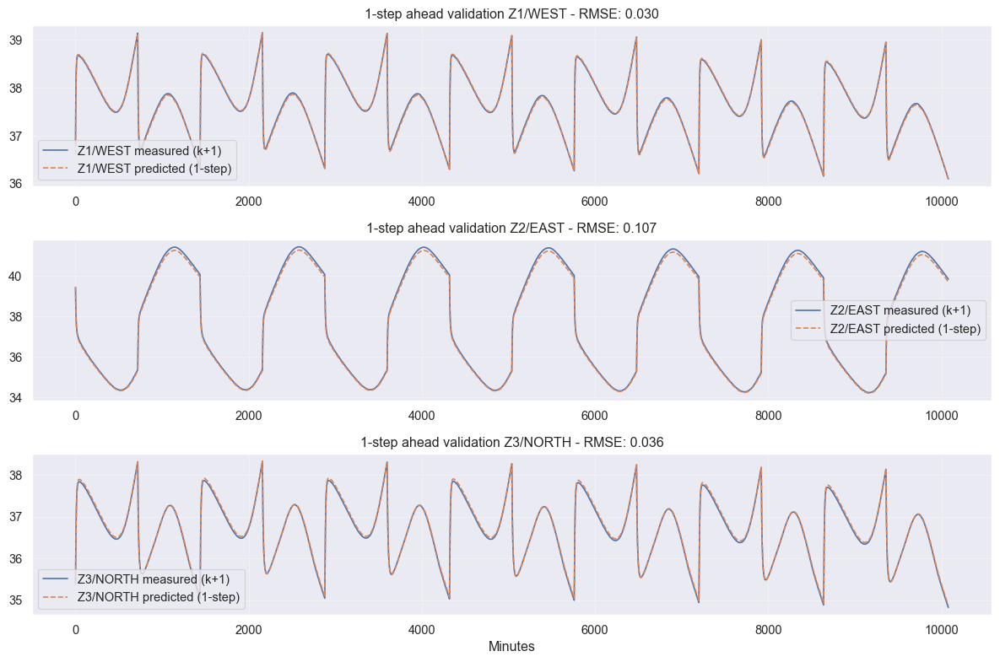

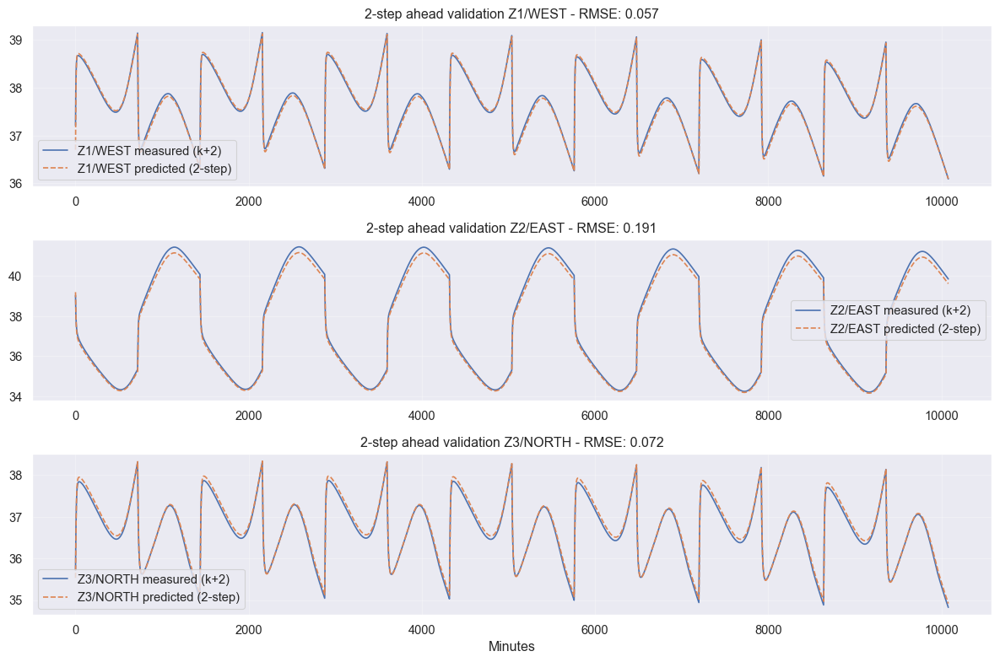

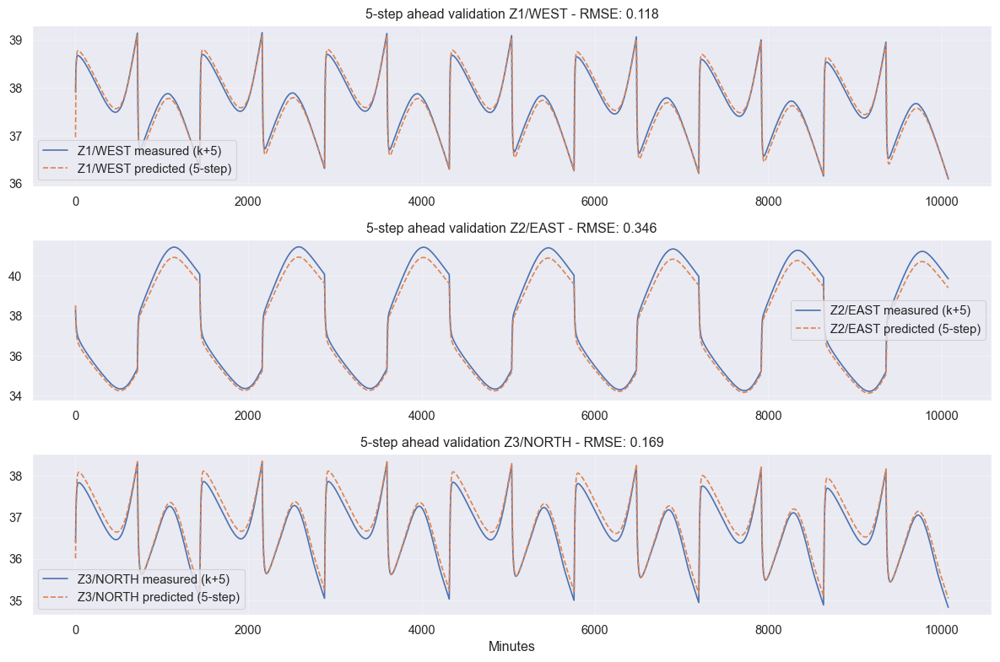

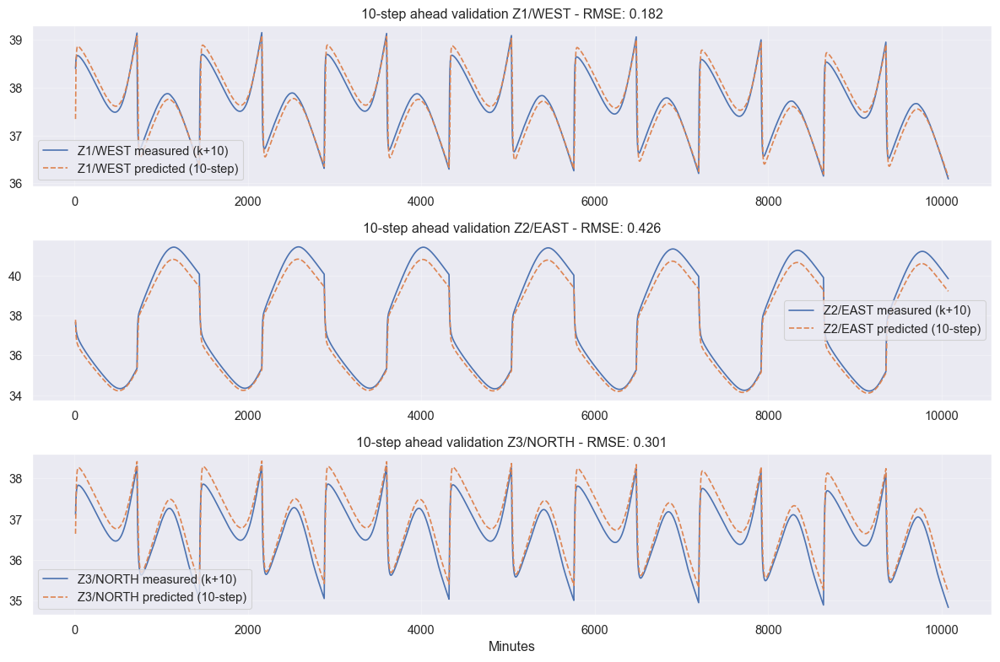

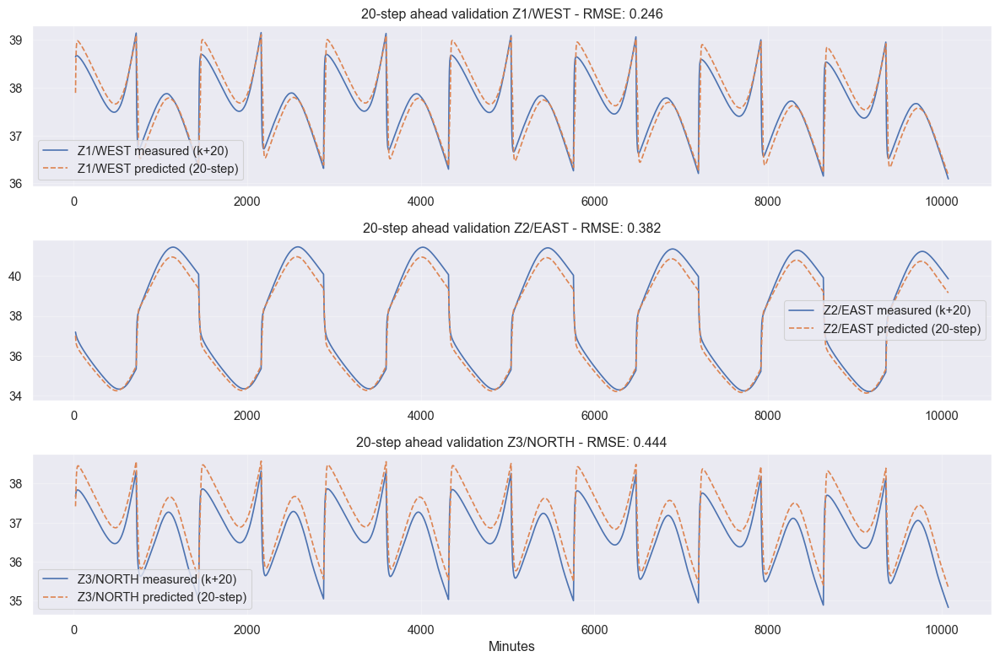

...

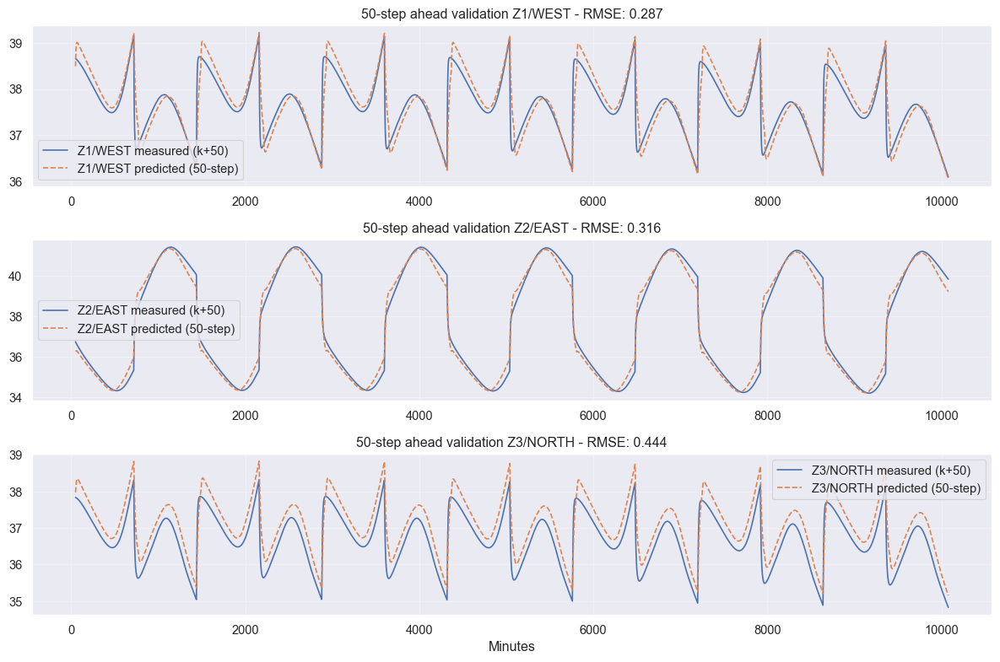

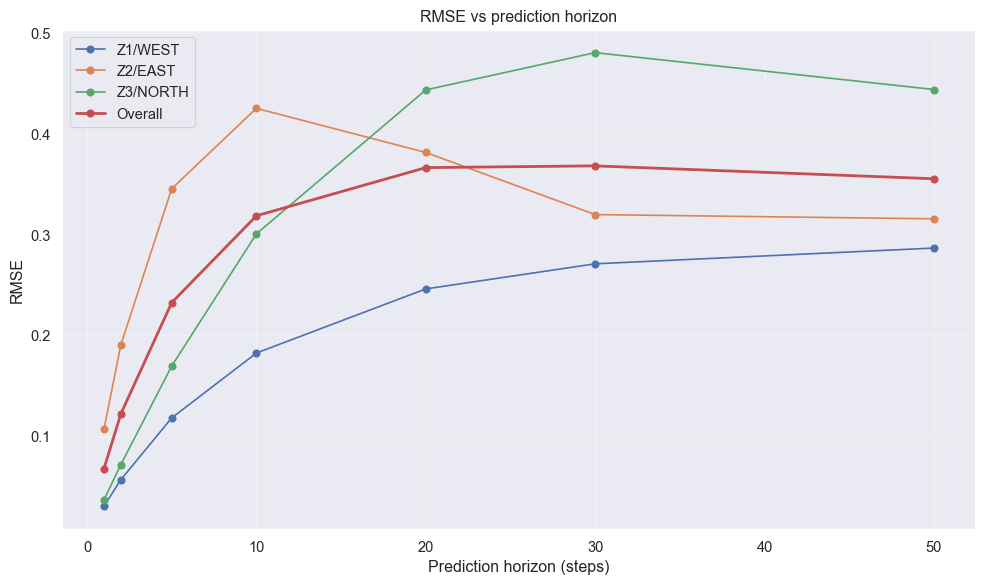

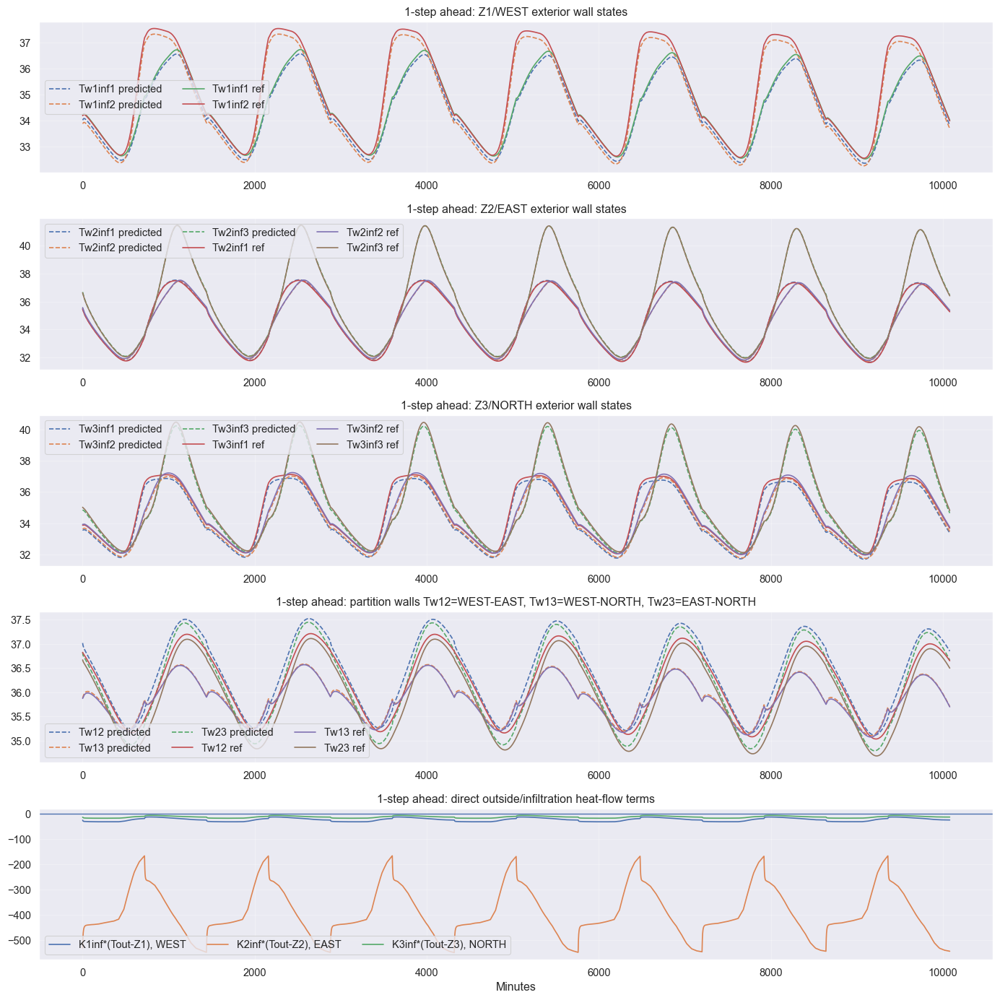

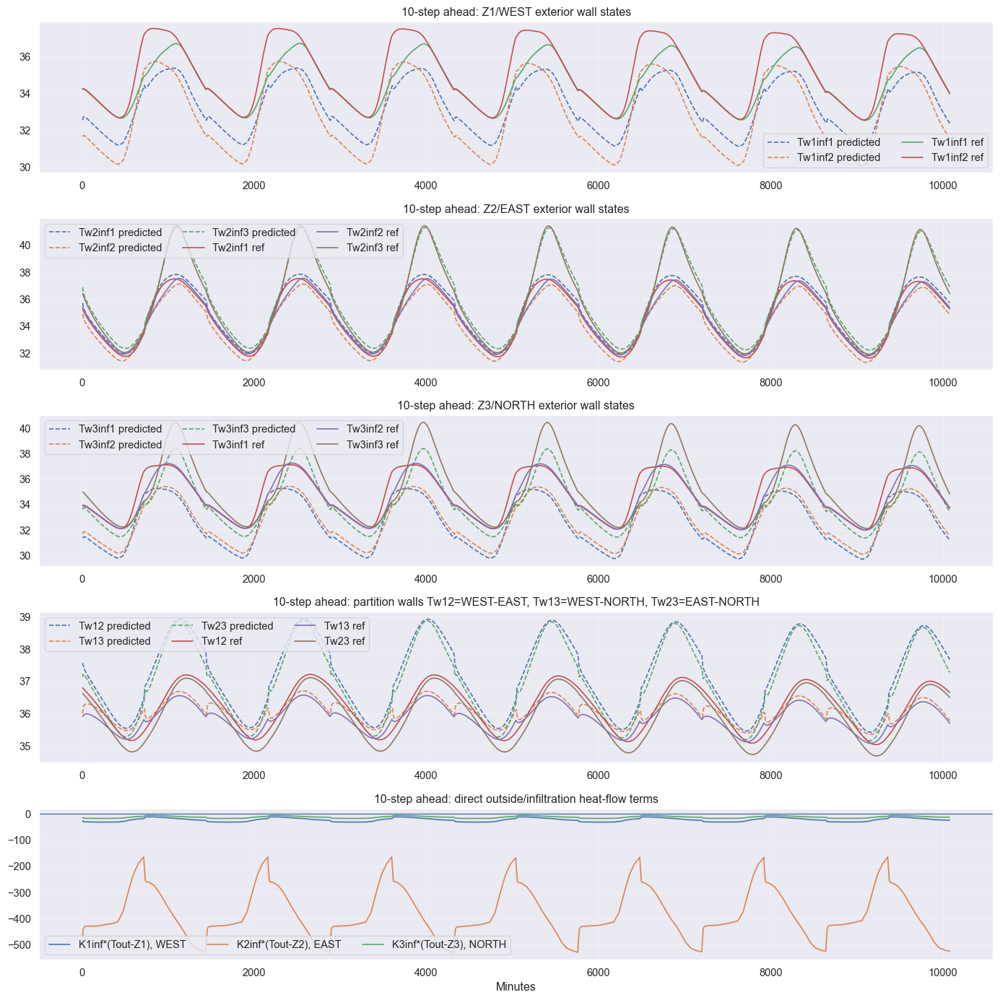

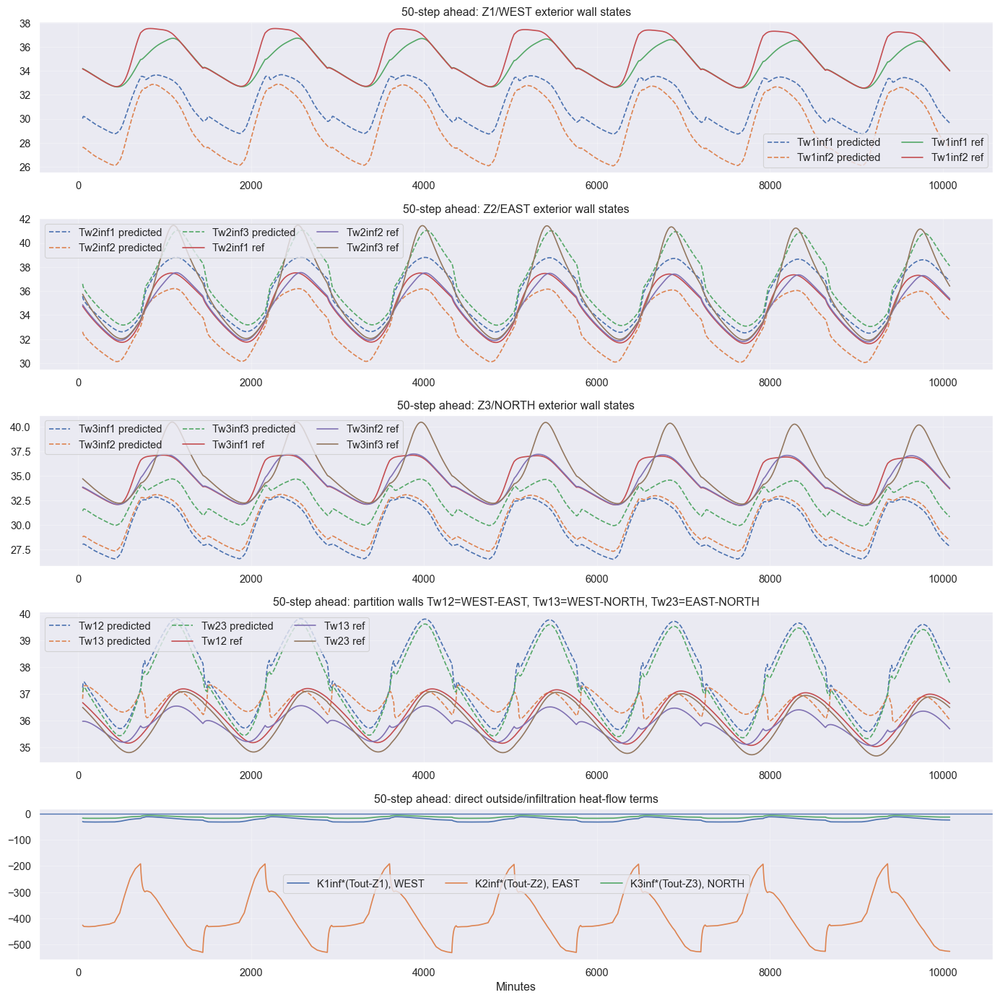


Wall-state RMSE summary by horizon:
   horizon_steps  horizon_minutes  rmse_Tw1inf1  rmse_Tw1inf2  rmse_Tw2inf1  \
0              1              1.0      0.156280      0.267748      0.033760   
1              2              2.0      0.306554      0.524733      0.065714   
2              5              5.0      0.723381      1.235257      0.153460   
3             10             10.0      1.316568      2.240802      0.282716   
4             20             20.0      2.200269      3.724963      0.510528   
5             30             30.0      2.793870      4.707993      0.715803   
6             50             50.0      3.464894      5.791594      1.072545   

   rmse_Tw2inf2  rmse_Tw2inf3  rmse_Tw3inf1  rmse_Tw3inf2  rmse_Tw3inf3  \
0      0.047911      0.032572      0.270627      0.228120      0.145544   
1      0.095547      0.063696      0.528070      0.445354      0.285865   
2      0.235479      0.150471      1.227394      1.036595      0.677044   
3      0.454116      0.280338 

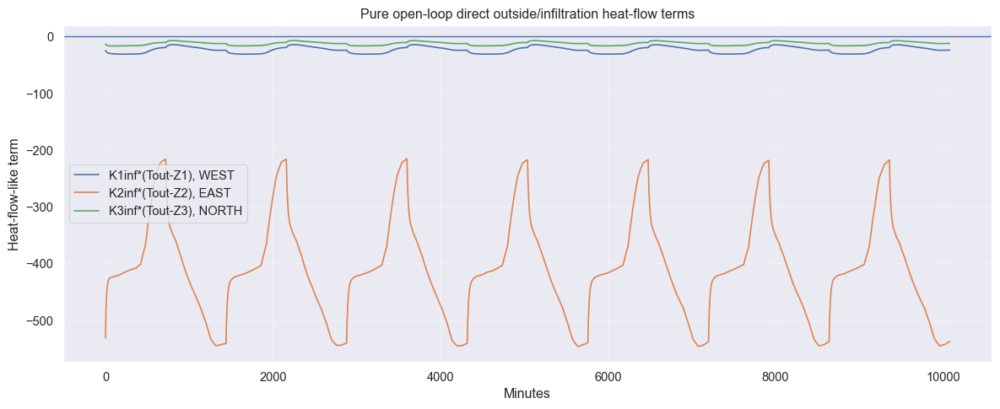


Saved validation outputs:
  theta_fixed_validation_only_augukf_idf_numbering
  Xa_openloop_validation_only_augukf_idf_numbering
  Yhat_openloop_validation_only_augukf_idf_numbering
  Ytrue_openloop_validation_only_augukf_idf_numbering
  horizon_results_validation_only_augukf_idf_numbering
  rmse_horizon_df_validation_only_augukf_idf_numbering
  wall_rmse_horizon_df_validation_only_augukf_idf_numbering
  qinf_openloop_validation_only_augukf_idf_numbering


In [96]:
# ============================================================
# VALIDATION ONLY BLOCK - IDF-NUMBERING + SAME OLD LOGIC
#
# Corrected from the previous validation block.
#
# Requires previous corrected IDF-numbering training block to have run:
#   model_df, idx_val, t_val, Ts
#   theta_hat or theta_hat_augukf_zoneonly_trainfit
#   n_phys, n_aug, param_names_aug, state_names
#   project_aug_state, make_xa0, f_aug_disc
#
# PURE IDF convention:
#   Z1 = Zn001 = WEST
#   Z2 = Zn002 = EAST
#   Z3 = Zn003 = NORTH
#
# Correct physical state order:
#   [Z1, Z2, Z3,
#    Tw1inf1, Tw1inf2,
#    Tw2inf1, Tw2inf2, Tw2inf3,
#    Tw3inf1, Tw3inf2, Tw3inf3,
#    Tw12, Tw13, Tw23]
#
# Correct partitions:
#   Tw12 = WEST-EAST
#   Tw13 = WEST-NORTH
#   Tw23 = EAST-NORTH
#
# Includes/checks direct outside terms:
#   K1inf*(Tout-Z1), K2inf*(Tout-Z2), K3inf*(Tout-Z3)
#
# Provides:
#   1) pure open-loop validation
#   2) h-step-ahead validation for horizons [1,2,5,10,20,30,50]
#   3) RMSE table/prints
#   4) zone plots for each horizon
#   5) RMSE-vs-horizon plot
#   6) wall-state plots for selected horizons
#   7) Kinf diagnostic plot
# ============================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# ------------------------------------------------------------
# 0) Safety checks and signal loading
# ------------------------------------------------------------
required_objects = [
    "model_df", "idx_val", "Ts",
    "n_phys", "n_aug", "param_names_aug", "state_names",
    "project_aug_state", "make_xa0", "f_aug_disc",
]

for _nm in required_objects:
    if _nm not in globals():
        raise NameError(f"Required object '{_nm}' not found above this block.")

if "t_val" not in globals():
    t_val = np.arange(len(idx_val), dtype=float) * (Ts / 60.0)

if "theta_hat" not in globals():
    if "theta_hat_augukf_zoneonly_trainfit" in globals():
        theta_hat = theta_hat_augukf_zoneonly_trainfit.copy()
    else:
        raise NameError("Neither theta_hat nor theta_hat_augukf_zoneonly_trainfit exists.")

required_cols = [
    "Z1", "Z2", "Z3", "Tout",
    "U1", "U2", "U3",
    "S1", "S2", "S3",
    "Tw1inf1", "Tw1inf2",
    "Tw2inf1", "Tw2inf2", "Tw2inf3",
    "Tw3inf1", "Tw3inf2", "Tw3inf3",
    "Tw12", "Tw13", "Tw23",
]

missing_cols = [c for c in required_cols if c not in model_df.columns]
if missing_cols:
    raise KeyError(
        "model_df is missing required columns:\n"
        + "\n".join(missing_cols)
        + "\n\nRun the corrected IDF-numbering mapping block first."
    )

if n_phys != 14:
    raise ValueError(f"Expected n_phys = 14 for corrected IDF-numbering model, got n_phys = {n_phys}")

if len(theta_hat) != (n_aug - n_phys):
    raise ValueError(
        f"theta_hat length mismatch: len(theta_hat)={len(theta_hat)}, "
        f"expected {n_aug - n_phys}"
    )

if np.max(idx_val) >= len(model_df):
    raise IndexError("idx_val contains indices outside model_df.")

# Pull signals from corrected model_df
Z1 = model_df["Z1"].to_numpy(dtype=float)      # WEST / Zn001
Z2 = model_df["Z2"].to_numpy(dtype=float)      # EAST / Zn002
Z3 = model_df["Z3"].to_numpy(dtype=float)      # NORTH / Zn003
Tout = model_df["Tout"].to_numpy(dtype=float)

U1 = model_df["U1"].to_numpy(dtype=float)      # WEST heating
U2 = model_df["U2"].to_numpy(dtype=float)      # EAST heating
U3 = model_df["U3"].to_numpy(dtype=float)      # NORTH heating

S1 = model_df["S1"].to_numpy(dtype=float)      # WEST solar
S2 = model_df["S2"].to_numpy(dtype=float)      # EAST solar
S3 = model_df["S3"].to_numpy(dtype=float)      # NORTH solar

Tw1inf1_ref = model_df["Tw1inf1"].to_numpy(dtype=float)
Tw1inf2_ref = model_df["Tw1inf2"].to_numpy(dtype=float)

Tw2inf1_ref = model_df["Tw2inf1"].to_numpy(dtype=float)
Tw2inf2_ref = model_df["Tw2inf2"].to_numpy(dtype=float)
Tw2inf3_ref = model_df["Tw2inf3"].to_numpy(dtype=float)

Tw3inf1_ref = model_df["Tw3inf1"].to_numpy(dtype=float)
Tw3inf2_ref = model_df["Tw3inf2"].to_numpy(dtype=float)
Tw3inf3_ref = model_df["Tw3inf3"].to_numpy(dtype=float)

Tw12_ref = model_df["Tw12"].to_numpy(dtype=float)   # WEST-EAST
Tw13_ref = model_df["Tw13"].to_numpy(dtype=float)   # WEST-NORTH
Tw23_ref = model_df["Tw23"].to_numpy(dtype=float)   # EAST-NORTH

theta_hat = np.asarray(theta_hat, dtype=float).copy()
theta_hat = np.nan_to_num(theta_hat, nan=1.0, posinf=1e6, neginf=1e-9)
theta_hat = np.clip(theta_hat, 1e-9, 1e6)

theta_dict = dict(zip(param_names_aug, theta_hat))

for _p in ["K1inf", "K2inf", "K3inf"]:
    if _p not in theta_dict:
        raise KeyError(f"{_p} is missing. Training model did not include direct Kinf*(Tout-Tz).")

print("\n================ Corrected IDF-numbering validation setup ================")
print("Zone convention:")
print("  Z1 = Zn001 = WEST")
print("  Z2 = Zn002 = EAST")
print("  Z3 = Zn003 = NORTH")
print("\nState order:")
for i, name in enumerate(state_names):
    print(f"  x[{i:02d}] = {name}")

print("\nPartition meaning:")
print("  Tw12 = WEST-EAST")
print("  Tw13 = WEST-NORTH")
print("  Tw23 = EAST-NORTH")

print("\nDirect Kinf parameters:")
print(f"  K1inf / WEST  = {theta_dict['K1inf']:.6g}")
print(f"  K2inf / EAST  = {theta_dict['K2inf']:.6g}")
print(f"  K3inf / NORTH = {theta_dict['K3inf']:.6g}")

# ------------------------------------------------------------
# 1) Helpers
# ------------------------------------------------------------
def rmse_local(a, b):
    a = np.asarray(a, dtype=float)
    b = np.asarray(b, dtype=float)
    return float(np.sqrt(np.mean((a - b) ** 2)))

def mae_local(a, b):
    a = np.asarray(a, dtype=float)
    b = np.asarray(b, dtype=float)
    return float(np.mean(np.abs(a - b)))

def maxabs_local(a, b):
    a = np.asarray(a, dtype=float)
    b = np.asarray(b, dtype=float)
    return float(np.max(np.abs(a - b)))

def print_metric_row(name, y, yhat):
    print(
        f"{name:14s} RMSE = {rmse_local(y, yhat):9.5f}   "
        f"MAE = {mae_local(y, yhat):9.5f}   "
        f"MaxAbs = {maxabs_local(y, yhat):9.5f}"
    )

def make_input_u(k):
    return np.array([Tout[k], U1[k], U2[k], U3[k], S1[k], S2[k], S3[k]], dtype=float)

def make_measured_aug_state(k, theta_fixed):
    """
    Initialize full augmented state from measured zones/wall refs at time k,
    then attach frozen theta.
    """
    xa = make_xa0(int(k))
    xa[n_phys:] = theta_fixed
    return project_aug_state(xa)

def propagate_one_step_aug(xa, k, theta_fixed):
    """
    Propagate one sample using measured input at global index k.
    Parameters remain frozen.
    """
    u_k = make_input_u(k)
    xa = f_aug_disc(xa, u_k, Ts, n_substeps=1)
    xa[n_phys:] = theta_fixed
    xa = project_aug_state(xa)
    return xa

def compute_qinf_from_aug(Xa, idx):
    K1inf = theta_dict["K1inf"]
    K2inf = theta_dict["K2inf"]
    K3inf = theta_dict["K3inf"]

    qinf1 = K1inf * (Tout[idx] - Xa[:, 0])
    qinf2 = K2inf * (Tout[idx] - Xa[:, 1])
    qinf3 = K3inf * (Tout[idx] - Xa[:, 2])
    return qinf1, qinf2, qinf3

# ------------------------------------------------------------
# 2) PURE OPEN-LOOP VALIDATION
# Single initialization at first validation point.
# Then free-run over the full validation horizon.
# ------------------------------------------------------------
def simulate_open_loop_validation(idx, theta_fixed, init_mode="measured_val_start"):
    if init_mode == "measured_val_start":
        xa = make_measured_aug_state(idx[0], theta_fixed)
    elif init_mode == "carry_train_last":
        if "xa_last" not in globals():
            raise NameError("xa_last is not defined; cannot use carry_train_last.")
        xa = np.array(xa_last, dtype=float).copy()
        xa[n_phys:] = theta_fixed
        xa = project_aug_state(xa)
    else:
        raise ValueError("init_mode must be 'measured_val_start' or 'carry_train_last'.")

    Xa_hist = np.zeros((len(idx), n_aug))
    Yhat_hist = np.zeros((len(idx), 3))

    for j, k in enumerate(idx):
        xa = propagate_one_step_aug(xa, k, theta_fixed)
        Xa_hist[j] = xa
        Yhat_hist[j] = xa[:3]

    return Xa_hist, Yhat_hist

Xa_openloop, Yhat_openloop = simulate_open_loop_validation(
    idx=idx_val,
    theta_fixed=theta_hat,
    init_mode="measured_val_start",
)

Ytrue_openloop = np.column_stack([Z1[idx_val], Z2[idx_val], Z3[idx_val]])

openloop_rmse_z1 = rmse_local(Ytrue_openloop[:, 0], Yhat_openloop[:, 0])
openloop_rmse_z2 = rmse_local(Ytrue_openloop[:, 1], Yhat_openloop[:, 1])
openloop_rmse_z3 = rmse_local(Ytrue_openloop[:, 2], Yhat_openloop[:, 2])
openloop_rmse_overall = rmse_local(Ytrue_openloop, Yhat_openloop)

print("\n===== PURE OPEN-LOOP VALIDATION RMSE =====")
print_metric_row("Z1/WEST",  Ytrue_openloop[:, 0], Yhat_openloop[:, 0])
print_metric_row("Z2/EAST",  Ytrue_openloop[:, 1], Yhat_openloop[:, 1])
print_metric_row("Z3/NORTH", Ytrue_openloop[:, 2], Yhat_openloop[:, 2])
print(f"{'Overall':14s} RMSE = {openloop_rmse_overall:9.5f}")

# Optional stricter carry-train-last open-loop validation
try:
    Xa_openloop_carry, Yhat_openloop_carry = simulate_open_loop_validation(
        idx=idx_val,
        theta_fixed=theta_hat,
        init_mode="carry_train_last",
    )
    has_carry_openloop = True
except Exception as e:
    print("\nCarry-train-last open-loop skipped:", e)
    has_carry_openloop = False

if has_carry_openloop:
    print("\n===== CARRY-TRAIN-LAST OPEN-LOOP VALIDATION RMSE =====")
    print_metric_row("Z1/WEST",  Ytrue_openloop[:, 0], Yhat_openloop_carry[:, 0])
    print_metric_row("Z2/EAST",  Ytrue_openloop[:, 1], Yhat_openloop_carry[:, 1])
    print_metric_row("Z3/NORTH", Ytrue_openloop[:, 2], Yhat_openloop_carry[:, 2])
    print(f"{'Overall':14s} RMSE = {rmse_local(Ytrue_openloop, Yhat_openloop_carry):9.5f}")

# ------------------------------------------------------------
# 3) Plot pure open-loop validation
# ------------------------------------------------------------
plt.figure(figsize=(12, 8))

ax1 = plt.subplot(3, 1, 1)
ax1.plot(t_val, Z1[idx_val], label="Z1/WEST measured")
ax1.plot(t_val, Yhat_openloop[:, 0], "--", label="Z1/WEST open-loop")
if has_carry_openloop:
    ax1.plot(t_val, Yhat_openloop_carry[:, 0], ":", label="Z1/WEST carry-train")
ax1.set_title(f"Pure open-loop validation Z1/WEST - RMSE: {openloop_rmse_z1:.3f}")
ax1.grid(True, alpha=0.3)
ax1.legend()

ax2 = plt.subplot(3, 1, 2, sharex=ax1)
ax2.plot(t_val, Z2[idx_val], label="Z2/EAST measured")
ax2.plot(t_val, Yhat_openloop[:, 1], "--", label="Z2/EAST open-loop")
if has_carry_openloop:
    ax2.plot(t_val, Yhat_openloop_carry[:, 1], ":", label="Z2/EAST carry-train")
ax2.set_title(f"Pure open-loop validation Z2/EAST - RMSE: {openloop_rmse_z2:.3f}")
ax2.grid(True, alpha=0.3)
ax2.legend()

ax3 = plt.subplot(3, 1, 3, sharex=ax1)
ax3.plot(t_val, Z3[idx_val], label="Z3/NORTH measured")
ax3.plot(t_val, Yhat_openloop[:, 2], "--", label="Z3/NORTH open-loop")
if has_carry_openloop:
    ax3.plot(t_val, Yhat_openloop_carry[:, 2], ":", label="Z3/NORTH carry-train")
ax3.set_title(f"Pure open-loop validation Z3/NORTH - RMSE: {openloop_rmse_z3:.3f}")
ax3.set_xlabel("Minutes")
ax3.grid(True, alpha=0.3)
ax3.legend()

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# 4) H-STEP-AHEAD VALIDATION
#
# Same old logic:
#   At each k, initialize from measured physical state at k.
#   Then open-loop propagate h steps with frozen theta.
#   Compare prediction at k+h against measured zone temps at k+h.
# ------------------------------------------------------------
def simulate_h_step_ahead(idx, horizon, theta_fixed):
    n_steps = len(idx) - horizon
    if n_steps <= 0:
        raise ValueError(f"Horizon {horizon} is too large for idx_val length {len(idx)}")

    Xh_aug = np.zeros((n_steps, n_aug))
    Xh_phys = np.zeros((n_steps, n_phys))
    Yhat_h = np.zeros((n_steps, 3))
    Ytrue_h = np.zeros((n_steps, 3))
    t_h = t_val[horizon:]

    for j in range(n_steps):
        k0 = idx[j]
        xa = make_measured_aug_state(k0, theta_fixed)

        for m in range(horizon):
            kk = idx[j + m]
            xa = propagate_one_step_aug(xa, kk, theta_fixed)

        kt = idx[j + horizon]

        Xh_aug[j] = xa
        Xh_phys[j] = xa[:n_phys]
        Yhat_h[j] = xa[:3]
        Ytrue_h[j] = np.array([Z1[kt], Z2[kt], Z3[kt]], dtype=float)

    return Xh_aug, Xh_phys, Yhat_h, Ytrue_h, t_h

horizons = [1, 2, 5, 10, 20, 30, 50]
horizon_results = {}

print("\n===== H-STEP-AHEAD VALIDATION RMSE =====")
for h in horizons:
    Xh_aug, Xh_phys, Yhat_h, Ytrue_h, t_h = simulate_h_step_ahead(
        idx=idx_val,
        horizon=h,
        theta_fixed=theta_hat,
    )

    rmse_z1 = rmse_local(Ytrue_h[:, 0], Yhat_h[:, 0])
    rmse_z2 = rmse_local(Ytrue_h[:, 1], Yhat_h[:, 1])
    rmse_z3 = rmse_local(Ytrue_h[:, 2], Yhat_h[:, 2])
    rmse_overall = rmse_local(Ytrue_h, Yhat_h)

    horizon_results[h] = {
        "Xh_aug": Xh_aug,
        "Xh_phys": Xh_phys,
        "Yhat": Yhat_h,
        "Ytrue": Ytrue_h,
        "t": t_h,
        "rmse_z1": rmse_z1,
        "rmse_z2": rmse_z2,
        "rmse_z3": rmse_z3,
        "rmse_overall": rmse_overall,
    }

    print(f"\n{h}-step ahead:")
    print(f"  Z1/WEST  = {rmse_z1:.6f}")
    print(f"  Z2/EAST  = {rmse_z2:.6f}")
    print(f"  Z3/NORTH = {rmse_z3:.6f}")
    print(f"  Overall  = {rmse_overall:.6f}")

# ------------------------------------------------------------
# 5) RMSE summary table
# ------------------------------------------------------------
rmse_rows = []
for h in horizons:
    r = horizon_results[h]
    rmse_rows.append({
        "horizon_steps": h,
        "horizon_minutes": h * Ts / 60.0,
        "rmse_z1_west": r["rmse_z1"],
        "rmse_z2_east": r["rmse_z2"],
        "rmse_z3_north": r["rmse_z3"],
        "rmse_overall": r["rmse_overall"],
    })

rmse_horizon_df = pd.DataFrame(rmse_rows)

print("\nRMSE summary by horizon:")
print(rmse_horizon_df)

# ------------------------------------------------------------
# 6) Zone plots for each horizon
# ------------------------------------------------------------
for h in horizons:
    r = horizon_results[h]
    Yhat_h = r["Yhat"]
    Ytrue_h = r["Ytrue"]
    t_h = r["t"]

    plt.figure(figsize=(12, 8))

    ax1 = plt.subplot(3, 1, 1)
    ax1.plot(t_h, Ytrue_h[:, 0], label=f"Z1/WEST measured (k+{h})")
    ax1.plot(t_h, Yhat_h[:, 0], "--", label=f"Z1/WEST predicted ({h}-step)")
    ax1.set_title(f"{h}-step ahead validation Z1/WEST - RMSE: {r['rmse_z1']:.3f}")
    ax1.grid(True, alpha=0.3)
    ax1.legend()

    ax2 = plt.subplot(3, 1, 2, sharex=ax1)
    ax2.plot(t_h, Ytrue_h[:, 1], label=f"Z2/EAST measured (k+{h})")
    ax2.plot(t_h, Yhat_h[:, 1], "--", label=f"Z2/EAST predicted ({h}-step)")
    ax2.set_title(f"{h}-step ahead validation Z2/EAST - RMSE: {r['rmse_z2']:.3f}")
    ax2.grid(True, alpha=0.3)
    ax2.legend()

    ax3 = plt.subplot(3, 1, 3, sharex=ax1)
    ax3.plot(t_h, Ytrue_h[:, 2], label=f"Z3/NORTH measured (k+{h})")
    ax3.plot(t_h, Yhat_h[:, 2], "--", label=f"Z3/NORTH predicted ({h}-step)")
    ax3.set_title(f"{h}-step ahead validation Z3/NORTH - RMSE: {r['rmse_z3']:.3f}")
    ax3.set_xlabel("Minutes")
    ax3.grid(True, alpha=0.3)
    ax3.legend()

    plt.tight_layout()
    plt.show()

# ------------------------------------------------------------
# 7) RMSE vs horizon plot
# ------------------------------------------------------------
plt.figure(figsize=(10, 6))
plt.plot(rmse_horizon_df["horizon_steps"], rmse_horizon_df["rmse_z1_west"], marker="o", label="Z1/WEST")
plt.plot(rmse_horizon_df["horizon_steps"], rmse_horizon_df["rmse_z2_east"], marker="o", label="Z2/EAST")
plt.plot(rmse_horizon_df["horizon_steps"], rmse_horizon_df["rmse_z3_north"], marker="o", label="Z3/NORTH")
plt.plot(rmse_horizon_df["horizon_steps"], rmse_horizon_df["rmse_overall"], marker="o", linewidth=2, label="Overall")
plt.xlabel("Prediction horizon (steps)")
plt.ylabel("RMSE")
plt.title("RMSE vs prediction horizon")
plt.grid(True, alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# 8) Wall-state plots for selected horizons
# ------------------------------------------------------------
wall_plot_horizons = [1, 10, 50]

for h in wall_plot_horizons:
    if h not in horizon_results:
        continue

    r = horizon_results[h]
    Xh = r["Xh_phys"]
    t_h = r["t"]
    idx_target = idx_val[h:]

    plt.figure(figsize=(14, 14))

    ax1 = plt.subplot(5, 1, 1)
    ax1.plot(t_h, Xh[:, 3], "--", label="Tw1inf1 predicted")
    ax1.plot(t_h, Xh[:, 4], "--", label="Tw1inf2 predicted")
    ax1.plot(t_h, Tw1inf1_ref[idx_target], label="Tw1inf1 ref")
    ax1.plot(t_h, Tw1inf2_ref[idx_target], label="Tw1inf2 ref")
    ax1.set_title(f"{h}-step ahead: Z1/WEST exterior wall states")
    ax1.grid(True, alpha=0.3)
    ax1.legend(ncol=2)

    ax2 = plt.subplot(5, 1, 2, sharex=ax1)
    ax2.plot(t_h, Xh[:, 5], "--", label="Tw2inf1 predicted")
    ax2.plot(t_h, Xh[:, 6], "--", label="Tw2inf2 predicted")
    ax2.plot(t_h, Xh[:, 7], "--", label="Tw2inf3 predicted")
    ax2.plot(t_h, Tw2inf1_ref[idx_target], label="Tw2inf1 ref")
    ax2.plot(t_h, Tw2inf2_ref[idx_target], label="Tw2inf2 ref")
    ax2.plot(t_h, Tw2inf3_ref[idx_target], label="Tw2inf3 ref")
    ax2.set_title(f"{h}-step ahead: Z2/EAST exterior wall states")
    ax2.grid(True, alpha=0.3)
    ax2.legend(ncol=3)

    ax3 = plt.subplot(5, 1, 3, sharex=ax1)
    ax3.plot(t_h, Xh[:, 8], "--", label="Tw3inf1 predicted")
    ax3.plot(t_h, Xh[:, 9], "--", label="Tw3inf2 predicted")
    ax3.plot(t_h, Xh[:, 10], "--", label="Tw3inf3 predicted")
    ax3.plot(t_h, Tw3inf1_ref[idx_target], label="Tw3inf1 ref")
    ax3.plot(t_h, Tw3inf2_ref[idx_target], label="Tw3inf2 ref")
    ax3.plot(t_h, Tw3inf3_ref[idx_target], label="Tw3inf3 ref")
    ax3.set_title(f"{h}-step ahead: Z3/NORTH exterior wall states")
    ax3.grid(True, alpha=0.3)
    ax3.legend(ncol=3)

    ax4 = plt.subplot(5, 1, 4, sharex=ax1)
    ax4.plot(t_h, Xh[:, 11], "--", label="Tw12 predicted")
    ax4.plot(t_h, Xh[:, 12], "--", label="Tw13 predicted")
    ax4.plot(t_h, Xh[:, 13], "--", label="Tw23 predicted")
    ax4.plot(t_h, Tw12_ref[idx_target], label="Tw12 ref")
    ax4.plot(t_h, Tw13_ref[idx_target], label="Tw13 ref")
    ax4.plot(t_h, Tw23_ref[idx_target], label="Tw23 ref")
    ax4.set_title(f"{h}-step ahead: partition walls Tw12=WEST-EAST, Tw13=WEST-NORTH, Tw23=EAST-NORTH")
    ax4.grid(True, alpha=0.3)
    ax4.legend(ncol=3)

    qinf1_h, qinf2_h, qinf3_h = compute_qinf_from_aug(r["Xh_aug"], idx_target)

    ax5 = plt.subplot(5, 1, 5, sharex=ax1)
    ax5.plot(t_h, qinf1_h, label="K1inf*(Tout-Z1), WEST")
    ax5.plot(t_h, qinf2_h, label="K2inf*(Tout-Z2), EAST")
    ax5.plot(t_h, qinf3_h, label="K3inf*(Tout-Z3), NORTH")
    ax5.axhline(0.0, linewidth=1)
    ax5.set_title(f"{h}-step ahead: direct outside/infiltration heat-flow terms")
    ax5.set_xlabel("Minutes")
    ax5.grid(True, alpha=0.3)
    ax5.legend(ncol=3)

    plt.tight_layout()
    plt.show()

# ------------------------------------------------------------
# 9) Wall-state RMSE table for selected horizons
# ------------------------------------------------------------
wall_rmse_rows = []

wall_state_info = [
    ("Tw1inf1", 3, Tw1inf1_ref),
    ("Tw1inf2", 4, Tw1inf2_ref),
    ("Tw2inf1", 5, Tw2inf1_ref),
    ("Tw2inf2", 6, Tw2inf2_ref),
    ("Tw2inf3", 7, Tw2inf3_ref),
    ("Tw3inf1", 8, Tw3inf1_ref),
    ("Tw3inf2", 9, Tw3inf2_ref),
    ("Tw3inf3", 10, Tw3inf3_ref),
    ("Tw12", 11, Tw12_ref),
    ("Tw13", 12, Tw13_ref),
    ("Tw23", 13, Tw23_ref),
]

for h in horizons:
    r = horizon_results[h]
    Xh = r["Xh_phys"]
    idx_target = idx_val[h:]

    row = {"horizon_steps": h, "horizon_minutes": h * Ts / 60.0}
    for nm, col_idx, ref_arr in wall_state_info:
        y = ref_arr[idx_target]
        yhat = Xh[:, col_idx]
        finite = np.isfinite(y) & np.isfinite(yhat)
        row[f"rmse_{nm}"] = rmse_local(y[finite], yhat[finite]) if np.sum(finite) > 0 else np.nan

    wall_rmse_rows.append(row)

wall_rmse_horizon_df = pd.DataFrame(wall_rmse_rows)

print("\nWall-state RMSE summary by horizon:")
print(wall_rmse_horizon_df)

# ------------------------------------------------------------
# 10) Kinf direct outside-coupling diagnostic for pure open-loop
# ------------------------------------------------------------
qinf1_open, qinf2_open, qinf3_open = compute_qinf_from_aug(Xa_openloop, idx_val)

print("\n===== Direct Kinf*(Tout - Tz) diagnostic, pure open-loop =====")
print(f"qinf1/WEST:  mean = {np.mean(qinf1_open): .6g}, std = {np.std(qinf1_open): .6g}, min = {np.min(qinf1_open): .6g}, max = {np.max(qinf1_open): .6g}")
print(f"qinf2/EAST:  mean = {np.mean(qinf2_open): .6g}, std = {np.std(qinf2_open): .6g}, min = {np.min(qinf2_open): .6g}, max = {np.max(qinf2_open): .6g}")
print(f"qinf3/NORTH: mean = {np.mean(qinf3_open): .6g}, std = {np.std(qinf3_open): .6g}, min = {np.min(qinf3_open): .6g}, max = {np.max(qinf3_open): .6g}")

plt.figure(figsize=(12, 5))
plt.plot(t_val, qinf1_open, label="K1inf*(Tout-Z1), WEST")
plt.plot(t_val, qinf2_open, label="K2inf*(Tout-Z2), EAST")
plt.plot(t_val, qinf3_open, label="K3inf*(Tout-Z3), NORTH")
plt.axhline(0.0, linewidth=1)
plt.title("Pure open-loop direct outside/infiltration heat-flow terms")
plt.xlabel("Minutes")
plt.ylabel("Heat-flow-like term")
plt.grid(True, alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# 11) Save outputs
# ------------------------------------------------------------
theta_fixed_validation_only_augukf_idf_numbering = theta_hat

Xa_openloop_validation_only_augukf_idf_numbering = Xa_openloop
Yhat_openloop_validation_only_augukf_idf_numbering = Yhat_openloop
Ytrue_openloop_validation_only_augukf_idf_numbering = Ytrue_openloop

if has_carry_openloop:
    Xa_openloop_carry_validation_only_augukf_idf_numbering = Xa_openloop_carry
    Yhat_openloop_carry_validation_only_augukf_idf_numbering = Yhat_openloop_carry

horizon_results_validation_only_augukf_idf_numbering = horizon_results
rmse_horizon_df_validation_only_augukf_idf_numbering = rmse_horizon_df
wall_rmse_horizon_df_validation_only_augukf_idf_numbering = wall_rmse_horizon_df

qinf_openloop_validation_only_augukf_idf_numbering = {
    "qinf1_WEST": qinf1_open,
    "qinf2_EAST": qinf2_open,
    "qinf3_NORTH": qinf3_open,
}

print("\nSaved validation outputs:")
print("  theta_fixed_validation_only_augukf_idf_numbering")
print("  Xa_openloop_validation_only_augukf_idf_numbering")
print("  Yhat_openloop_validation_only_augukf_idf_numbering")
print("  Ytrue_openloop_validation_only_augukf_idf_numbering")
print("  horizon_results_validation_only_augukf_idf_numbering")
print("  rmse_horizon_df_validation_only_augukf_idf_numbering")
print("  wall_rmse_horizon_df_validation_only_augukf_idf_numbering")
print("  qinf_openloop_validation_only_augukf_idf_numbering")


In [52]:
# ============================================================
# EXPANDED WALL-BY-WALL AUGMENTED UKF
# IMPROVED TRAINING + CORRECT OPEN-LOOP VALIDATION
# - train on recent 14 days instead of 30
# - lower parameter random walk to improve stability/generalization
# - faster integration: 2 substeps instead of 10
# - freeze parameters from last 1 day
# - correct validation: pure open-loop, no measured-zone forcing
# - validation starts from measured/reference physical state at first val point
# ============================================================

import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from scipy.linalg import cholesky

# ------------------------------------------------------------
# 0) Build signals from model_df
# ------------------------------------------------------------
Z1 = model_df["Z1"].to_numpy(dtype=float)
Z2 = model_df["Z2"].to_numpy(dtype=float)
Z3 = model_df["Z3"].to_numpy(dtype=float)
Tout = model_df["Tout"].to_numpy(dtype=float)

U1 = model_df["U1"].to_numpy(dtype=float)
U2 = model_df["U2"].to_numpy(dtype=float)
U3 = model_df["U3"].to_numpy(dtype=float)

N = len(model_df)

def get_required_col(df, name):
    if name not in df.columns:
        raise KeyError(f"Required column '{name}' not found in model_df")
    x = df[name].to_numpy(dtype=float)
    if not np.isfinite(x).all():
        bad = np.where(~np.isfinite(x))[0][:10]
        raise ValueError(f"Column '{name}' contains NaN/Inf at indices {bad}")
    return x

def get_first_existing_col(df, candidates):
    for c in candidates:
        if c in df.columns:
            x = df[c].to_numpy(dtype=float)
            if not np.isfinite(x).all():
                bad = np.where(~np.isfinite(x))[0][:10]
                raise ValueError(f"Column '{c}' contains NaN/Inf at indices {bad}")
            return x, c
    raise KeyError(f"None of these columns exist in model_df: {candidates}")

def get_col_or_zeros(df, name, N):
    if name in df.columns:
        x = df[name].to_numpy(dtype=float)
        if not np.isfinite(x).all():
            bad = np.where(~np.isfinite(x))[0][:10]
            raise ValueError(f"Column '{name}' contains NaN/Inf at indices {bad}")
        return x
    return np.zeros(N, dtype=float)

S1 = get_col_or_zeros(model_df, "S1", N)
S2 = get_col_or_zeros(model_df, "S2", N)
S3 = get_col_or_zeros(model_df, "S3", N)

Tw1inf1_ref = get_required_col(model_df, "Tw1inf1")
Tw1inf2_ref = get_required_col(model_df, "Tw1inf2")
Tw1inf3_ref = get_required_col(model_df, "Tw1inf3")

Tw2inf1_ref = get_required_col(model_df, "Tw2inf1")
Tw2inf2_ref = get_required_col(model_df, "Tw2inf2")

Tw3inf1_ref, tw3c1_name = get_first_existing_col(model_df, ["Tw3inf1", "Zw3inf1"])
Tw3inf2_ref, tw3c2_name = get_first_existing_col(model_df, ["Tw3inf2", "Zw3inf2"])
Tw3inf3_ref, tw3c3_name = get_first_existing_col(model_df, ["Tw3inf3", "Zw3inf3"])

Tw12_ref = get_required_col(model_df, "Tw12")
Tw23_ref = get_required_col(model_df, "Tw23")

Y_meas = np.column_stack([Z1, Z2, Z3])

print("Using zone-3 wall columns:", tw3c1_name, tw3c2_name, tw3c3_name)

# ------------------------------------------------------------
# 1) Time settings and split
# ------------------------------------------------------------
Ts = None

try:
    idx_dt = pd.to_datetime(model_df.index, errors="coerce")
    idx_dt = idx_dt[~idx_dt.isna()]
    if len(idx_dt) >= 2:
        dt_sec = pd.Series(idx_dt).diff().dt.total_seconds().dropna()
        dt_sec = dt_sec[np.isfinite(dt_sec) & (dt_sec > 0)]
        if len(dt_sec) > 0:
            Ts = float(dt_sec.mode().iloc[0])
            print(f"Inferred Ts from model_df.index = {Ts} seconds")
except Exception as e:
    print("Index-based Ts inference failed:", e)

if Ts is None:
    Ts = 60.0
    print(f"Falling back to manual Ts = {Ts} seconds")

samples_per_day = int(round(24 * 3600 / Ts))

# IMPROVED: recent-window training, still enough coverage
train_days = 14
val_days = 7

needed_days = train_days + val_days
available_days = N // samples_per_day

print("N =", N)
print("Ts =", Ts)
print("samples_per_day =", samples_per_day)
print("available_days =", available_days)

if available_days < needed_days:
    raise ValueError(
        f"Need at least {needed_days} full days ({train_days} train + {val_days} val). "
        f"Available full days = {available_days}."
    )

# use the MOST RECENT train+val block instead of always starting at 0
start_day = available_days - needed_days
start_idx = start_day * samples_per_day

idx_train = np.arange(start_idx,
                      start_idx + train_days * samples_per_day,
                      dtype=int)

idx_val = np.arange(start_idx + train_days * samples_per_day,
                    start_idx + (train_days + val_days) * samples_per_day,
                    dtype=int)

t_train = np.arange(len(idx_train), dtype=float) * (Ts / 60.0)
t_val = np.arange(len(idx_val), dtype=float) * (Ts / 60.0)

print("start_day =", start_day)
print("train_days =", train_days)
print("val_days =", val_days)
print("len(idx_train) =", len(idx_train))
print("len(idx_val) =", len(idx_val))

# ------------------------------------------------------------
# 2) Augmented state layout
# ------------------------------------------------------------
n_phys = 13
n_param = 29
n_aug = n_phys + n_param
n_y = 3

param_names_aug = [
    "Cz1", "Cz2", "Cz3",
    "Cw1inf1", "Cw1inf2", "Cw1inf3",
    "Cw2inf1", "Cw2inf2",
    "Cw3inf1", "Cw3inf2", "Cw3inf3",
    "Cw12", "Cw23",
    "Kz1w1", "Kz1w2", "Kz1w3",
    "Kz2w1", "Kz2w2",
    "Kz3w1", "Kz3w2", "Kz3w3",
    "Ka1", "Ka2", "Ka3",
    "K12", "K23",
    "D1", "D2", "D3"
]

# ------------------------------------------------------------
# 2.1) Hard state/parameter projection bounds
# ------------------------------------------------------------
TEMP_MIN, TEMP_MAX = -20.0, 80.0

CZ_MIN, CZ_MAX = 1.0e4, 5.0e6
CW_MIN, CW_MAX = 1.0e4, 1.0e7

K_MIN, K_MAX = 1.0e-4, 5.0e2
KA_MIN, KA_MAX = 1.0e-4, 5.0e2
KIJ_MIN, KIJ_MAX = 1.0e-4, 5.0e2

D_MIN, D_MAX = 0.0, 0.05

def project_aug_state(xa):
    xa = np.asarray(xa, dtype=float).copy()

    xa[:n_phys] = np.clip(xa[:n_phys], TEMP_MIN, TEMP_MAX)
    xa[13:16] = np.clip(xa[13:16], CZ_MIN, CZ_MAX)
    xa[16:26] = np.clip(xa[16:26], CW_MIN, CW_MAX)
    xa[26:34] = np.clip(xa[26:34], K_MIN, K_MAX)
    xa[34:37] = np.clip(xa[34:37], KA_MIN, KA_MAX)
    xa[37:39] = np.clip(xa[37:39], KIJ_MIN, KIJ_MAX)
    xa[39:42] = np.clip(xa[39:42], D_MIN, D_MAX)

    xa = np.nan_to_num(xa, nan=0.0, posinf=0.0, neginf=0.0)

    xa[:n_phys] = np.clip(xa[:n_phys], TEMP_MIN, TEMP_MAX)
    xa[13:16] = np.clip(xa[13:16], CZ_MIN, CZ_MAX)
    xa[16:26] = np.clip(xa[16:26], CW_MIN, CW_MAX)
    xa[26:34] = np.clip(xa[26:34], K_MIN, K_MAX)
    xa[34:37] = np.clip(xa[34:37], KA_MIN, KA_MAX)
    xa[37:39] = np.clip(xa[37:39], KIJ_MIN, KIJ_MAX)
    xa[39:42] = np.clip(xa[39:42], D_MIN, D_MAX)

    return xa

# ------------------------------------------------------------
# 3) Dynamics
# IMPROVED: 2 substeps instead of 10 for speed
# ------------------------------------------------------------
def f_aug_cont(xa, u):
    xa = project_aug_state(xa)

    z1, z2, z3 = xa[0], xa[1], xa[2]
    tw1i1, tw1i2, tw1i3 = xa[3], xa[4], xa[5]
    tw2i1, tw2i2 = xa[6], xa[7]
    tw3i1, tw3i2, tw3i3 = xa[8], xa[9], xa[10]
    tw12, tw23 = xa[11], xa[12]

    (Cz1, Cz2, Cz3,
     Cw1i1, Cw1i2, Cw1i3,
     Cw2i1, Cw2i2,
     Cw3i1, Cw3i2, Cw3i3,
     Cw12, Cw23,
     Kz1w1, Kz1w2, Kz1w3,
     Kz2w1, Kz2w2,
     Kz3w1, Kz3w2, Kz3w3,
     Ka1, Ka2, Ka3,
     K12, K23,
     D1, D2, D3) = xa[n_phys:]

    tout, u1, u2, u3, s1, s2, s3 = u

    B1 = 1.0
    B2 = 1.0
    B3 = 1.0

    dz1 = (
        Kz1w1 * (tw1i1 - z1) +
        Kz1w2 * (tw1i2 - z1) +
        Kz1w3 * (tw1i3 - z1) +
        K12   * (tw12 - z1) +
        B1 * u1 +
        D1 * s1
    ) / Cz1

    dz2 = (
        Kz2w1 * (tw2i1 - z2) +
        Kz2w2 * (tw2i2 - z2) +
        K12   * (tw12 - z2) +
        K23   * (tw23 - z2) +
        B2 * u2 +
        D2 * s2
    ) / Cz2

    dz3 = (
        Kz3w1 * (tw3i1 - z3) +
        Kz3w2 * (tw3i2 - z3) +
        Kz3w3 * (tw3i3 - z3) +
        K23   * (tw23 - z3) +
        B3 * u3 +
        D3 * s3
    ) / Cz3

    dtw1i1 = (Kz1w1 * (z1 - tw1i1) + Ka1 * (tout - tw1i1)) / Cw1i1
    dtw1i2 = (Kz1w2 * (z1 - tw1i2) + Ka1 * (tout - tw1i2)) / Cw1i2
    dtw1i3 = (Kz1w3 * (z1 - tw1i3) + Ka1 * (tout - tw1i3)) / Cw1i3

    dtw2i1 = (Kz2w1 * (z2 - tw2i1) + Ka2 * (tout - tw2i1)) / Cw2i1
    dtw2i2 = (Kz2w2 * (z2 - tw2i2) + Ka2 * (tout - tw2i2)) / Cw2i2

    dtw3i1 = (Kz3w1 * (z3 - tw3i1) + Ka3 * (tout - tw3i1)) / Cw3i1
    dtw3i2 = (Kz3w2 * (z3 - tw3i2) + Ka3 * (tout - tw3i2)) / Cw3i2
    dtw3i3 = (Kz3w3 * (z3 - tw3i3) + Ka3 * (tout - tw3i3)) / Cw3i3

    dtw12 = (K12 * (z1 - tw12) + K12 * (z2 - tw12)) / Cw12
    dtw23 = (K23 * (z2 - tw23) + K23 * (z3 - tw23)) / Cw23

    xdot_phys = np.array([
        dz1, dz2, dz3,
        dtw1i1, dtw1i2, dtw1i3,
        dtw2i1, dtw2i2,
        dtw3i1, dtw3i2, dtw3i3,
        dtw12, dtw23
    ], dtype=float)

    xdot_param = np.zeros(n_param, dtype=float)

    dx = np.concatenate([xdot_phys, xdot_param])
    dx = np.nan_to_num(dx, nan=0.0, posinf=1e3, neginf=-1e3)

    dx[:n_phys] = np.clip(dx[:n_phys], -0.5, 0.5)
    dx[n_phys:] = np.clip(dx[n_phys:], -1e3, 1e3)

    return dx

def f_aug_disc(xa, u, Ts, n_substeps=2):
    dt = Ts / n_substeps
    x = project_aug_state(xa)
    for _ in range(n_substeps):
        dx = f_aug_cont(x, u)
        x = x + dt * dx
        x = project_aug_state(x)
    return x

def h_aug(xa):
    xa = project_aug_state(xa)
    return xa[:3].copy()

# ------------------------------------------------------------
# 4) UKF
# ------------------------------------------------------------
class SimpleUKF:
    def __init__(self, n, m, alpha=5e-2, beta=2.0, kappa=0.0):
        self.n = n
        self.m = m
        self.alpha = alpha
        self.beta = beta
        self.kappa = kappa

        self.lmbda = alpha**2 * (n + kappa) - n
        self.gamma = np.sqrt(n + self.lmbda)

        self.Wm = np.full(2*n + 1, 1.0 / (2.0 * (n + self.lmbda)))
        self.Wc = np.full(2*n + 1, 1.0 / (2.0 * (n + self.lmbda)))
        self.Wm[0] = self.lmbda / (n + self.lmbda)
        self.Wc[0] = self.lmbda / (n + self.lmbda) + (1.0 - alpha**2 + beta)

    def _symmetrize(self, M):
        return 0.5 * (M + M.T)

    def _force_spd(self, M, min_eig=1e-6):
        M = np.asarray(M, dtype=float)
        M = np.nan_to_num(M, nan=0.0, posinf=1e6, neginf=-1e6)
        M = self._symmetrize(M)
        try:
            evals, evecs = np.linalg.eigh(M)
            evals = np.maximum(evals, min_eig)
            M_spd = evecs @ np.diag(evals) @ evecs.T
            return self._symmetrize(M_spd)
        except np.linalg.LinAlgError:
            return self._symmetrize(M + (1e-3 + min_eig) * np.eye(M.shape[0]))

    def _matrix_sqrt_psd(self, M, min_eig=1e-6):
        M = self._force_spd(M, min_eig=min_eig)
        try:
            evals, evecs = np.linalg.eigh(M)
            evals = np.maximum(evals, min_eig)
            return evecs @ np.diag(np.sqrt(evals))
        except np.linalg.LinAlgError:
            return np.sqrt(min_eig) * np.eye(M.shape[0])

    def sigma_points(self, x, P):
        x = project_aug_state(x)
        P = self._force_spd(P, min_eig=1e-6)

        jitter = 1e-8
        for _ in range(10):
            try:
                S = cholesky(P + jitter * np.eye(self.n), lower=True)
                break
            except np.linalg.LinAlgError:
                jitter *= 10.0
        else:
            S = self._matrix_sqrt_psd(P, min_eig=1e-5)

        X = np.zeros((2*self.n + 1, self.n))
        X[0] = x
        for i in range(self.n):
            col = self.gamma * S[:, i]
            X[1 + i] = project_aug_state(x + col)
            X[1 + self.n + i] = project_aug_state(x - col)
        return X

    def predict(self, x, P, Q, u, Ts):
        x = project_aug_state(x)
        P = self._force_spd(P, min_eig=1e-6)
        Q = self._force_spd(Q, min_eig=1e-12)

        X = self.sigma_points(x, P)
        Xp = np.array([project_aug_state(f_aug_disc(xx, u, Ts)) for xx in X])

        x_pred = np.sum(self.Wm[:, None] * Xp, axis=0)
        x_pred = project_aug_state(x_pred)

        P_pred = np.zeros((self.n, self.n))
        for i in range(Xp.shape[0]):
            d = (Xp[i] - x_pred).reshape(-1, 1)
            d = np.nan_to_num(d, nan=0.0, posinf=1e3, neginf=-1e3)
            d[:n_phys] = np.clip(d[:n_phys], -20.0, 20.0)
            d[n_phys:] = np.clip(d[n_phys:], -1e5, 1e5)
            P_pred += self.Wc[i] * (d @ d.T)

        P_pred += Q
        P_pred = np.nan_to_num(P_pred, nan=0.0, posinf=1e10, neginf=-1e10)
        P_pred = self._force_spd(P_pred, min_eig=1e-6)

        return x_pred, P_pred, Xp

    def update(self, x_pred, P_pred, Xp, R, y):
        x_pred = project_aug_state(x_pred)
        P_pred = self._force_spd(P_pred, min_eig=1e-6)
        R = self._force_spd(R, min_eig=1e-12)

        Ysig = np.array([h_aug(xx) for xx in Xp])
        y_pred = np.sum(self.Wm[:, None] * Ysig, axis=0)
        y_pred = np.nan_to_num(y_pred, nan=0.0, posinf=1e3, neginf=-1e3)

        Pyy = np.zeros((self.m, self.m))
        Pxy = np.zeros((self.n, self.m))

        for i in range(Ysig.shape[0]):
            dy = (Ysig[i] - y_pred).reshape(-1, 1)
            dx = (Xp[i] - x_pred).reshape(-1, 1)

            dy = np.nan_to_num(dy, nan=0.0, posinf=1e3, neginf=-1e3)
            dx = np.nan_to_num(dx, nan=0.0, posinf=1e3, neginf=-1e3)

            dy = np.clip(dy, -20.0, 20.0)
            dx[:n_phys] = np.clip(dx[:n_phys], -20.0, 20.0)
            dx[n_phys:] = np.clip(dx[n_phys:], -1e5, 1e5)

            Pyy += self.Wc[i] * (dy @ dy.T)
            Pxy += self.Wc[i] * (dx @ dy.T)

        Pyy += R
        Pyy = np.nan_to_num(Pyy, nan=0.0, posinf=1e10, neginf=-1e10)
        Pxy = np.nan_to_num(Pxy, nan=0.0, posinf=1e10, neginf=-1e10)
        Pyy = self._force_spd(Pyy, min_eig=1e-8)

        try:
            K = np.linalg.solve(Pyy.T, Pxy.T).T
        except np.linalg.LinAlgError:
            K = Pxy @ np.linalg.pinv(Pyy)

        innov = y - y_pred
        innov = np.nan_to_num(innov, nan=0.0, posinf=20.0, neginf=-20.0)
        innov = np.clip(innov, -20.0, 20.0)

        x_upd = x_pred + K @ innov
        x_upd = project_aug_state(x_upd)

        P_upd = P_pred - K @ Pyy @ K.T
        P_upd = np.nan_to_num(P_upd, nan=0.0, posinf=1e10, neginf=-1e10)
        P_upd = self._force_spd(P_upd, min_eig=1e-6)

        return x_upd, P_upd, y_pred, innov

ukf = SimpleUKF(n=n_aug, m=n_y, alpha=5e-2, beta=2.0, kappa=0.0)

# ------------------------------------------------------------
# 5) Covariance tuning
# IMPROVED: tighter parameter random walk
# ------------------------------------------------------------
def build_Q_R():
    q_zone = 0.003
    q_wall = 0.003

    q_Cz = 1.0e1
    q_Cw = 1.0e1
    q_Kzw = 5.0e-4
    q_Ka  = 5.0e-4
    q_Kij = 5.0e-4
    q_D   = 1.0e-10

    q_vec = np.array([
        q_zone, q_zone, q_zone,
        q_wall, q_wall, q_wall,
        q_wall, q_wall,
        q_wall, q_wall, q_wall,
        q_wall, q_wall,

        q_Cz, q_Cz, q_Cz,
        q_Cw, q_Cw, q_Cw,
        q_Cw, q_Cw,
        q_Cw, q_Cw, q_Cw,
        q_Cw, q_Cw,

        q_Kzw, q_Kzw, q_Kzw,
        q_Kzw, q_Kzw,
        q_Kzw, q_Kzw, q_Kzw,
        q_Ka, q_Ka, q_Ka,
        q_Kij, q_Kij,

        q_D, q_D, q_D
    ], dtype=float)

    Q = np.diag(q_vec**2)
    r_std = 0.08
    R = np.diag([r_std**2, r_std**2, r_std**2])
    return Q, R

Q, R = build_Q_R()

# ------------------------------------------------------------
# 6) Initial augmented state and covariance
# ------------------------------------------------------------
def make_xa0(i0=0):
    xa0 = np.array([
        Z1[i0], Z2[i0], Z3[i0],
        Tw1inf1_ref[i0], Tw1inf2_ref[i0], Tw1inf3_ref[i0],
        Tw2inf1_ref[i0], Tw2inf2_ref[i0],
        Tw3inf1_ref[i0], Tw3inf2_ref[i0], Tw3inf3_ref[i0],
        Tw12_ref[i0], Tw23_ref[i0],

        4.0e5, 4.0e5, 4.0e5,
        8.0e5, 8.0e5, 8.0e5,
        8.0e5, 8.0e5,
        8.0e5, 8.0e5, 8.0e5,
        8.0e5, 8.0e5,

        80.0, 80.0, 80.0,
        80.0, 80.0,
        80.0, 80.0, 80.0,

        50.0, 50.0, 50.0,
        100.0, 100.0,

        1.0e-4, 1.0e-4, 1.0e-4
    ], dtype=float)

    return project_aug_state(xa0)

def make_P0():
    std = np.array([
        0.10, 0.10, 0.10,
        0.20, 0.20, 0.20,
        0.20, 0.20,
        0.20, 0.20, 0.20,
        0.20, 0.20,

        5.0e3, 5.0e3, 5.0e3,

        1.0e4, 1.0e4, 1.0e4,
        1.0e4, 1.0e4,
        1.0e4, 1.0e4, 1.0e4,
        1.0e4, 1.0e4,

        1.0, 1.0, 1.0,
        1.0, 1.0,
        1.0, 1.0, 1.0,

        0.5, 0.5, 0.5,
        1.0, 1.0,

        1.0e-7, 1.0e-7, 1.0e-7
    ], dtype=float)

    return np.diag(std**2)

# ------------------------------------------------------------
# 7) Training UKF
# ------------------------------------------------------------
def run_augmented_ukf(idx, xa0=None, P0=None):
    xa = make_xa0(int(idx[0])) if xa0 is None else project_aug_state(np.array(xa0, dtype=float).copy())
    P = make_P0() if P0 is None else 0.5 * (np.array(P0, dtype=float).copy() + np.array(P0, dtype=float).copy().T)

    Xa_hist = np.zeros((len(idx), n_aug))
    Yhat_hist = np.zeros((len(idx), n_y))
    Innov_hist = np.zeros((len(idx), n_y))

    for j, k in enumerate(idx):
        u_k = np.array([Tout[k], U1[k], U2[k], U3[k], S1[k], S2[k], S3[k]], dtype=float)
        y_k = np.array([Z1[k], Z2[k], Z3[k]], dtype=float)

        xa_pred, P_pred, Xp = ukf.predict(xa, P, Q, u_k, Ts)
        xa, P, y_pred, innov = ukf.update(xa_pred, P_pred, Xp, R, y_k)

        Xa_hist[j] = xa
        Yhat_hist[j] = y_pred
        Innov_hist[j] = innov

        if (j + 1) % 1000 == 0:
            print(f"UKF step {j+1}/{len(idx)} done")

    return Xa_hist, Yhat_hist, Innov_hist, xa, P

Xa_train, Yhat_train, Innov_train, xa_last, P_last = run_augmented_ukf(
    idx=idx_train,
    xa0=None,
    P0=None
)

# ------------------------------------------------------------
# 8) Freeze final parameter-state estimates
# IMPROVED: use last 1 day only
# ------------------------------------------------------------
tail_len = min(1 * samples_per_day, len(Xa_train))
theta_hat = np.mean(Xa_train[-tail_len:, n_phys:], axis=0)
theta_hat = project_aug_state(np.r_[np.zeros(n_phys), theta_hat])[n_phys:]

print("\nFrozen parameter estimates used for validation:")
for name, val in zip(param_names_aug, theta_hat):
    print(f"{name} = {val:.6g}")

# ------------------------------------------------------------
# 9) Correct open-loop validation
# IMPROVED: reset physical states at validation start
# ------------------------------------------------------------
xa_val0 = np.array([
    Z1[idx_val[0]], Z2[idx_val[0]], Z3[idx_val[0]],
    Tw1inf1_ref[idx_val[0]], Tw1inf2_ref[idx_val[0]], Tw1inf3_ref[idx_val[0]],
    Tw2inf1_ref[idx_val[0]], Tw2inf2_ref[idx_val[0]],
    Tw3inf1_ref[idx_val[0]], Tw3inf2_ref[idx_val[0]], Tw3inf3_ref[idx_val[0]],
    Tw12_ref[idx_val[0]], Tw23_ref[idx_val[0]],
    *theta_hat
], dtype=float)

xa_val0 = project_aug_state(xa_val0)

def simulate_open_loop_aug(idx, xa0):
    xa = project_aug_state(np.array(xa0, dtype=float).copy())
    Xa_sim = np.zeros((len(idx), n_aug))
    Yhat_sim = np.zeros((len(idx), 3))

    for j, k in enumerate(idx):
        u_k = np.array([Tout[k], U1[k], U2[k], U3[k], S1[k], S2[k], S3[k]], dtype=float)
        xa = f_aug_disc(xa, u_k, Ts, n_substeps=1)   # fast validation
        Xa_sim[j] = xa
        Yhat_sim[j] = xa[:3]

    return Xa_sim, Yhat_sim

Xa_val_sim, Yhat_val_sim = simulate_open_loop_aug(
    idx=idx_val,
    xa0=xa_val0
)

Xsim_val_daily = Xa_val_sim[:, :n_phys]

# ------------------------------------------------------------
# 10) RMSE
# ------------------------------------------------------------
def rmse(a, b):
    a = np.asarray(a, dtype=float)
    b = np.asarray(b, dtype=float)
    return np.sqrt(np.mean((a - b)**2))

train_rmse_z1 = rmse(Z1[idx_train], Yhat_train[:, 0])
train_rmse_z2 = rmse(Z2[idx_train], Yhat_train[:, 1])
train_rmse_z3 = rmse(Z3[idx_train], Yhat_train[:, 2])
train_rmse_overall = np.sqrt(np.mean((Y_meas[idx_train] - Yhat_train)**2))

val_rmse_z1 = rmse(Z1[idx_val], Yhat_val_sim[:, 0])
val_rmse_z2 = rmse(Z2[idx_val], Yhat_val_sim[:, 1])
val_rmse_z3 = rmse(Z3[idx_val], Yhat_val_sim[:, 2])
val_rmse_overall = np.sqrt(np.mean((Y_meas[idx_val] - Yhat_val_sim)**2))

print("\nTraining RMSE:")
print(f"Z1 = {train_rmse_z1:.6f}")
print(f"Z2 = {train_rmse_z2:.6f}")
print(f"Z3 = {train_rmse_z3:.6f}")
print(f"Overall = {train_rmse_overall:.6f}")

print("\nValidation RMSE:")
print(f"Z1 = {val_rmse_z1:.6f}")
print(f"Z2 = {val_rmse_z2:.6f}")
print(f"Z3 = {val_rmse_z3:.6f}")
print(f"Overall = {val_rmse_overall:.6f}")

# ------------------------------------------------------------
# 11) Parameter trajectories
# ------------------------------------------------------------
ncols = 3
nrows = int(np.ceil(len(param_names_aug) / ncols))

plt.figure(figsize=(14, 4 * nrows))
for i, name in enumerate(param_names_aug):
    ax = plt.subplot(nrows, ncols, i + 1)
    ax.plot(Xa_train[:, n_phys + i])
    ax.set_title(name)
    ax.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# 12) Validation plots: zones
# ------------------------------------------------------------
plt.figure(figsize=(12, 8))

ax1 = plt.subplot(3, 1, 1)
ax1.plot(t_val, Z1[idx_val], label="Z1 measured")
ax1.plot(t_val, Yhat_val_sim[:, 0], "--", label="Z1 predicted")
ax1.set_title(f"Correct open-loop validation Z1 - RMSE: {val_rmse_z1:.3f}")
ax1.grid(True, alpha=0.3)
ax1.legend()

ax2 = plt.subplot(3, 1, 2, sharex=ax1)
ax2.plot(t_val, Z2[idx_val], label="Z2 measured")
ax2.plot(t_val, Yhat_val_sim[:, 1], "--", label="Z2 predicted")
ax2.set_title(f"Correct open-loop validation Z2 - RMSE: {val_rmse_z2:.3f}")
ax2.grid(True, alpha=0.3)
ax2.legend()

ax3 = plt.subplot(3, 1, 3, sharex=ax1)
ax3.plot(t_val, Z3[idx_val], label="Z3 measured")
ax3.plot(t_val, Yhat_val_sim[:, 2], "--", label="Z3 predicted")
ax3.set_title(f"Correct open-loop validation Z3 - RMSE: {val_rmse_z3:.3f}")
ax3.set_xlabel("Minutes")
ax3.grid(True, alpha=0.3)
ax3.legend()

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# 13) Validation plots: wall states
# ------------------------------------------------------------
plt.figure(figsize=(14, 12))

ax1 = plt.subplot(4, 1, 1)
ax1.plot(t_val, Xsim_val_daily[:, 3], "--", label="Tw1inf1 predicted")
ax1.plot(t_val, Xsim_val_daily[:, 4], "--", label="Tw1inf2 predicted")
ax1.plot(t_val, Xsim_val_daily[:, 5], "--", label="Tw1inf3 predicted")
ax1.plot(t_val, Tw1inf1_ref[idx_val], label="Tw1inf1 reference")
ax1.plot(t_val, Tw1inf2_ref[idx_val], label="Tw1inf2 reference")
ax1.plot(t_val, Tw1inf3_ref[idx_val], label="Tw1inf3 reference")
ax1.set_title("Correct open-loop validation: Zone 1 exterior wall states")
ax1.grid(True, alpha=0.3)
ax1.legend(ncol=3)

ax2 = plt.subplot(4, 1, 2, sharex=ax1)
ax2.plot(t_val, Xsim_val_daily[:, 6], "--", label="Tw2inf1 predicted")
ax2.plot(t_val, Xsim_val_daily[:, 7], "--", label="Tw2inf2 predicted")
ax2.plot(t_val, Tw2inf1_ref[idx_val], label="Tw2inf1 reference")
ax2.plot(t_val, Tw2inf2_ref[idx_val], label="Tw2inf2 reference")
ax2.set_title("Correct open-loop validation: Zone 2 exterior wall states")
ax2.grid(True, alpha=0.3)
ax2.legend(ncol=2)

ax3 = plt.subplot(4, 1, 3, sharex=ax1)
ax3.plot(t_val, Xsim_val_daily[:, 8], "--", label="Tw3inf1 predicted")
ax3.plot(t_val, Xsim_val_daily[:, 9], "--", label="Tw3inf2 predicted")
ax3.plot(t_val, Xsim_val_daily[:, 10], "--", label="Tw3inf3 predicted")
ax3.plot(t_val, Tw3inf1_ref[idx_val], label="Tw3inf1 reference")
ax3.plot(t_val, Tw3inf2_ref[idx_val], label="Tw3inf2 reference")
ax3.plot(t_val, Tw3inf3_ref[idx_val], label="Tw3inf3 reference")
ax3.set_title("Correct open-loop validation: Zone 3 exterior wall states")
ax3.grid(True, alpha=0.3)
ax3.legend(ncol=3)

ax4 = plt.subplot(4, 1, 4, sharex=ax1)
ax4.plot(t_val, Xsim_val_daily[:, 11], "--", label="Tw12 predicted")
ax4.plot(t_val, Xsim_val_daily[:, 12], "--", label="Tw23 predicted")
ax4.plot(t_val, Tw12_ref[idx_val], label="Tw12 reference")
ax4.plot(t_val, Tw23_ref[idx_val], label="Tw23 reference")
ax4.set_title("Correct open-loop validation: shared wall states")
ax4.set_xlabel("Minutes")
ax4.grid(True, alpha=0.3)
ax4.legend(ncol=2)

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# 14) Save outputs
# ------------------------------------------------------------
Xa_train_augukf_expanded_allstates_fast_recent = Xa_train
Yhat_train_augukf_expanded_allstates_fast_recent = Yhat_train
Xa_val_augukf_expanded_allstates_fast_recent = Xa_val_sim
Yhat_val_augukf_expanded_allstates_fast_recent = Yhat_val_sim
theta_hat_augukf_expanded_allstates_fast_recent = theta_hat
idx_train_augukf_expanded_allstates_fast_recent = idx_train
idx_val_augukf_expanded_allstates_fast_recent = idx_val
t_train_augukf_expanded_allstates_fast_recent = t_train
t_val_augukf_expanded_allstates_fast_recent = t_val

Using zone-3 wall columns: Zw3inf1 Zw3inf2 Zw3inf3
Inferred Ts from model_df.index = 60.0 seconds
N = 83520
Ts = 60.0
samples_per_day = 1440
available_days = 58
start_day = 37
train_days = 14
val_days = 7
len(idx_train) = 20160
len(idx_val) = 10080
UKF step 1000/20160 done


KeyboardInterrupt: 

In [63]:
# ============================================================
# REPLACEMENT: UKF TRAINING + VALIDATION WITH NO KNOWN WALL TEMPS
# AFTER INITIALIZATION
#
# Assumes these are already defined above exactly as in your notebook:
#   model_df, Z1,Z2,Z3,Tout,U1,U2,U3,S1,S2,S3
#   Tw1inf1_ref,Tw1inf2_ref,Tw1inf3_ref
#   Tw2inf1_ref,Tw2inf2_ref
#   Tw3inf1_ref,Tw3inf2_ref,Tw3inf3_ref
#   Tw12_ref,Tw23_ref
#   Ts, samples_per_day, idx_train, idx_val, t_train, t_val
#   n_phys, n_param, n_aug, n_y, param_names_aug
#   project_aug_state, f_aug_disc, h_aug
#   SimpleUKF, ukf, Q, R
#   make_xa0, make_P0
# ============================================================
'''
import numpy as np
import matplotlib.pyplot as plt

# ------------------------------------------------------------
# 7) UKF training
# IMPORTANT:
# - wall temperatures are used ONLY in make_xa0() at the first time
# - after that, update uses only y_k = [Z1,Z2,Z3]
# ------------------------------------------------------------
def run_augmented_ukf_zone_only(idx, xa0=None, P0=None):
    xa = make_xa0(int(idx[0])) if xa0 is None else project_aug_state(np.array(xa0, dtype=float).copy())
    P = make_P0() if P0 is None else 0.5 * (np.array(P0, dtype=float) + np.array(P0, dtype=float).T)

    Xa_hist = np.zeros((len(idx), n_aug))
    Yhat_hist = np.zeros((len(idx), n_y))
    Innov_hist = np.zeros((len(idx), n_y))

    for j, k in enumerate(idx):
        u_k = np.array([Tout[k], U1[k], U2[k], U3[k], S1[k], S2[k], S3[k]], dtype=float)
        y_k = np.array([Z1[k], Z2[k], Z3[k]], dtype=float)

        xa_pred, P_pred, Xp = ukf.predict(xa, P, Q, u_k, Ts)
        xa, P, y_pred, innov = ukf.update(xa_pred, P_pred, Xp, R, y_k)

        Xa_hist[j] = xa
        Yhat_hist[j] = y_pred
        Innov_hist[j] = innov

        if (j + 1) % 1000 == 0:
            print(f"UKF training step {j+1}/{len(idx)} done")

    return Xa_hist, Yhat_hist, Innov_hist, xa, P

Xa_train, Yhat_train, Innov_train, xa_last, P_last = run_augmented_ukf_zone_only(
    idx=idx_train,
    xa0=None,
    P0=None
)

# ------------------------------------------------------------
# 8) Freeze parameters from final part of training
# ------------------------------------------------------------
tail_len = min(1 * samples_per_day, len(Xa_train))
theta_hat = np.mean(Xa_train[-tail_len:, n_phys:], axis=0)
theta_hat = project_aug_state(np.r_[np.zeros(n_phys), theta_hat])[n_phys:]

print("\nFrozen parameter estimates used for validation:")
for name, val in zip(param_names_aug, theta_hat):
    print(f"{name} = {val:.6g}")

# ------------------------------------------------------------
# 9) Build validation initial state with NO wall references
# Strategy:
# - use final estimated training state xa_last
# - freeze parameters to theta_hat
# - optionally anchor ONLY zone temperatures to first val measured zone temps
# - keep wall states from estimated training end, not from measured wall temps
# ------------------------------------------------------------
xa_val0 = np.array(xa_last, dtype=float).copy()

# anchor ONLY measured zones at start of validation
xa_val0[0] = Z1[idx_val[0]]
xa_val0[1] = Z2[idx_val[0]]
xa_val0[2] = Z3[idx_val[0]]

# freeze parameters
xa_val0[n_phys:] = theta_hat
xa_val0 = project_aug_state(xa_val0)

P_val0 = np.array(P_last, dtype=float).copy()
P_val0[n_phys:, :] = 0.0
P_val0[:, n_phys:] = 0.0
for i in range(n_param):
    P_val0[n_phys + i, n_phys + i] = 1e-12
P_val0 = 0.5 * (P_val0 + P_val0.T)

# ------------------------------------------------------------
# 10) Helpers
# ------------------------------------------------------------
Y_meas = np.column_stack([Z1, Z2, Z3])

def rmse(a, b):
    a = np.asarray(a, dtype=float)
    b = np.asarray(b, dtype=float)
    return np.sqrt(np.mean((a - b) ** 2))

def overall_rmse(y_true, y_pred):
    y_true = np.asarray(y_true, dtype=float)
    y_pred = np.asarray(y_pred, dtype=float)
    return np.sqrt(np.mean((y_true - y_pred) ** 2))

def horizon_label(h, n_total):
    return "Open-loop" if h >= n_total else f"{h}-step ahead"

# ------------------------------------------------------------
# 11) Pure open-loop validation
# No zone correction, no wall correction, no known wall temps
# ------------------------------------------------------------
def simulate_open_loop_aug(idx, xa0):
    xa = project_aug_state(np.array(xa0, dtype=float).copy())
    xa[n_phys:] = theta_hat

    Xa_sim = np.zeros((len(idx), n_aug))
    Yhat_sim = np.zeros((len(idx), 3))

    for j, k in enumerate(idx):
        u_k = np.array([Tout[k], U1[k], U2[k], U3[k], S1[k], S2[k], S3[k]], dtype=float)
        xa = f_aug_disc(xa, u_k, Ts, n_substeps=1)
        xa[n_phys:] = theta_hat
        xa = project_aug_state(xa)

        Xa_sim[j] = xa
        Yhat_sim[j] = xa[:3]

    return Xa_sim, Yhat_sim

Xa_val_open, Yhat_val_open = simulate_open_loop_aug(idx_val, xa_val0)

open_rmse_z1 = rmse(Z1[idx_val], Yhat_val_open[:, 0])
open_rmse_z2 = rmse(Z2[idx_val], Yhat_val_open[:, 1])
open_rmse_z3 = rmse(Z3[idx_val], Yhat_val_open[:, 2])
open_rmse_all = overall_rmse(Y_meas[idx_val], Yhat_val_open)

print("\nPure open-loop validation RMSE:")
print(f"Z1 = {open_rmse_z1:.6f}")
print(f"Z2 = {open_rmse_z2:.6f}")
print(f"Z3 = {open_rmse_z3:.6f}")
print(f"Overall = {open_rmse_all:.6f}")

# ------------------------------------------------------------
# 12) Rolling h-step-ahead validation using ONLY zone measurements
#
# At each time k:
#   1) update state with measured zone temperature y_k only
#   2) predict h steps ahead open-loop with frozen theta_hat
#   3) compare only the endpoint forecast at k+h
#
# No wall temperatures are used.
# ------------------------------------------------------------
def run_zone_only_hstep_validation(idx, xa0, P0, horizon):
    idx = np.asarray(idx, dtype=int)
    H = int(horizon)
    if H < 1:
        raise ValueError("horizon must be >= 1")

    xa_filt = project_aug_state(np.array(xa0, dtype=float).copy())
    P_filt = 0.5 * (np.array(P0, dtype=float) + np.array(P0, dtype=float).T)

    # freeze parameters at start
    xa_filt[n_phys:] = theta_hat
    xa_filt = project_aug_state(xa_filt)

    q_phys_only = np.array(Q, dtype=float).copy()
    q_phys_only[n_phys:, :] = 0.0
    q_phys_only[:, n_phys:] = 0.0

    pred_list = []
    true_list = []
    step_indices = []

    Xa_filt_hist = np.zeros((len(idx), n_aug))
    Yfilt_hist = np.zeros((len(idx), 3))

    for j, k in enumerate(idx):
        # filtering step using zone measurements only
        u_k = np.array([Tout[k], U1[k], U2[k], U3[k], S1[k], S2[k], S3[k]], dtype=float)
        y_k = np.array([Z1[k], Z2[k], Z3[k]], dtype=float)

        xa_pred, P_pred, Xp = ukf.predict(xa_filt, P_filt, q_phys_only, u_k, Ts)

        # force parameters frozen
        xa_pred[n_phys:] = theta_hat
        Xp[:, n_phys:] = theta_hat[None, :]
        xa_pred = project_aug_state(xa_pred)

        xa_filt, P_filt, y_pred_now, innov = ukf.update(xa_pred, P_pred, Xp, R, y_k)

        xa_filt[n_phys:] = theta_hat
        xa_filt = project_aug_state(xa_filt)

        P_filt[n_phys:, :] = 0.0
        P_filt[:, n_phys:] = 0.0
        for ii in range(n_param):
            P_filt[n_phys + ii, n_phys + ii] = 1e-12
        P_filt = 0.5 * (P_filt + P_filt.T)

        Xa_filt_hist[j] = xa_filt
        Yfilt_hist[j] = xa_filt[:3]

        # endpoint h-step forecast
        if j + H < len(idx):
            xa_roll = np.array(xa_filt, dtype=float).copy()

            for m in range(1, H + 1):
                kk = idx[j + m]
                u_roll = np.array([Tout[kk], U1[kk], U2[kk], U3[kk], S1[kk], S2[kk], S3[kk]], dtype=float)
                xa_roll = f_aug_disc(xa_roll, u_roll, Ts, n_substeps=1)
                xa_roll[n_phys:] = theta_hat
                xa_roll = project_aug_state(xa_roll)

            pred_list.append(xa_roll[:3].copy())
            true_list.append(np.array([Z1[idx[j + H]], Z2[idx[j + H]], Z3[idx[j + H]]], dtype=float))
            step_indices.append(j + H)

    Y_pred = np.array(pred_list, dtype=float)
    Y_true = np.array(true_list, dtype=float)
    step_indices = np.array(step_indices, dtype=int)

    metrics = {
        "horizon": H,
        "rmse_z1": rmse(Y_true[:, 0], Y_pred[:, 0]) if len(Y_pred) else np.nan,
        "rmse_z2": rmse(Y_true[:, 1], Y_pred[:, 1]) if len(Y_pred) else np.nan,
        "rmse_z3": rmse(Y_true[:, 2], Y_pred[:, 2]) if len(Y_pred) else np.nan,
        "rmse_all": overall_rmse(Y_true, Y_pred) if len(Y_pred) else np.nan,
    }

    return {
        "Xa_filt_hist": Xa_filt_hist,
        "Yfilt_hist": Yfilt_hist,
        "Y_pred": Y_pred,
        "Y_true": Y_true,
        "step_indices": step_indices,
        "metrics": metrics,
    }

# ------------------------------------------------------------
# 13) Horizons:
# 1-step, plus 3 more, plus final open-loop
# ------------------------------------------------------------
horizons = [1, 5, 10, 20]
horizon_results = {}

for H in horizons:
    print(f"\nRunning {H}-step-ahead validation...")
    horizon_results[H] = run_zone_only_hstep_validation(
        idx=idx_val,
        xa0=xa_val0,
        P0=P_val0,
        horizon=H
    )
    m = horizon_results[H]["metrics"]
    print(f"{H}-step RMSE -> Z1={m['rmse_z1']:.6f}, Z2={m['rmse_z2']:.6f}, Z3={m['rmse_z3']:.6f}, Overall={m['rmse_all']:.6f}")

# ------------------------------------------------------------
# 14) Training RMSE
# ------------------------------------------------------------
train_rmse_z1 = rmse(Z1[idx_train], Yhat_train[:, 0])
train_rmse_z2 = rmse(Z2[idx_train], Yhat_train[:, 1])
train_rmse_z3 = rmse(Z3[idx_train], Yhat_train[:, 2])
train_rmse_all = overall_rmse(Y_meas[idx_train], Yhat_train)

print("\nTraining RMSE:")
print(f"Z1 = {train_rmse_z1:.6f}")
print(f"Z2 = {train_rmse_z2:.6f}")
print(f"Z3 = {train_rmse_z3:.6f}")
print(f"Overall = {train_rmse_all:.6f}")

# ------------------------------------------------------------
# 15) Plot function for each validation case
# For h-step results, plot only valid endpoint times
# ------------------------------------------------------------
def plot_validation_case(t_axis_full, idx_full, y_meas_full, y_pred_case, step_indices_case, title_prefix):
    t_case = t_axis_full[step_indices_case]

    plt.figure(figsize=(12, 8))

    ax1 = plt.subplot(3, 1, 1)
    ax1.plot(t_axis_full, y_meas_full[:, 0], label="Z1 measured")
    ax1.plot(t_case, y_pred_case[:, 0], "--", label="Z1 predicted")
    ax1.set_title(f"{title_prefix} - Z1")
    ax1.grid(True, alpha=0.3)
    ax1.legend()

    ax2 = plt.subplot(3, 1, 2, sharex=ax1)
    ax2.plot(t_axis_full, y_meas_full[:, 1], label="Z2 measured")
    ax2.plot(t_case, y_pred_case[:, 1], "--", label="Z2 predicted")
    ax2.set_title(f"{title_prefix} - Z2")
    ax2.grid(True, alpha=0.3)
    ax2.legend()

    ax3 = plt.subplot(3, 1, 3, sharex=ax1)
    ax3.plot(t_axis_full, y_meas_full[:, 2], label="Z3 measured")
    ax3.plot(t_case, y_pred_case[:, 2], "--", label="Z3 predicted")
    ax3.set_title(f"{title_prefix} - Z3")
    ax3.set_xlabel("Minutes")
    ax3.grid(True, alpha=0.3)
    ax3.legend()

    plt.tight_layout()
    plt.show()

# ------------------------------------------------------------
# 16) Plot open-loop validation
# ------------------------------------------------------------
plot_validation_case(
    t_axis_full=t_val,
    idx_full=idx_val,
    y_meas_full=Y_meas[idx_val],
    y_pred_case=Yhat_val_open,
    step_indices_case=np.arange(len(idx_val)),
    title_prefix=(
        f"Pure open-loop validation "
        f"(RMSE: Z1={open_rmse_z1:.3f}, Z2={open_rmse_z2:.3f}, Z3={open_rmse_z3:.3f}, All={open_rmse_all:.3f})"
    )
)

# ------------------------------------------------------------
# 17) Plot each h-step validation
# ------------------------------------------------------------
for H in horizons:
    res = horizon_results[H]
    m = res["metrics"]

    plot_validation_case(
        t_axis_full=t_val,
        idx_full=idx_val,
        y_meas_full=Y_meas[idx_val],
        y_pred_case=res["Y_pred"],
        step_indices_case=res["step_indices"],
        title_prefix=(
            f"{H}-step-ahead validation "
            f"(RMSE: Z1={m['rmse_z1']:.3f}, Z2={m['rmse_z2']:.3f}, "
            f"Z3={m['rmse_z3']:.3f}, All={m['rmse_all']:.3f})"
        )
    )

# ------------------------------------------------------------
# 18) RMSE vs horizon plot
# Includes final open-loop as last point
# ------------------------------------------------------------
rmse_horizons = []
rmse_all_list = []
rmse_z1_list = []
rmse_z2_list = []
rmse_z3_list = []

for H in horizons:
    m = horizon_results[H]["metrics"]
    rmse_horizons.append(H)
    rmse_all_list.append(m["rmse_all"])
    rmse_z1_list.append(m["rmse_z1"])
    rmse_z2_list.append(m["rmse_z2"])
    rmse_z3_list.append(m["rmse_z3"])

rmse_horizons.append(len(idx_val))
rmse_all_list.append(open_rmse_all)
rmse_z1_list.append(open_rmse_z1)
rmse_z2_list.append(open_rmse_z2)
rmse_z3_list.append(open_rmse_z3)

plt.figure(figsize=(10, 6))
plt.plot(rmse_horizons, rmse_all_list, marker="o", label="Overall RMSE")
plt.plot(rmse_horizons, rmse_z1_list, marker="o", label="Z1 RMSE")
plt.plot(rmse_horizons, rmse_z2_list, marker="o", label="Z2 RMSE")
plt.plot(rmse_horizons, rmse_z3_list, marker="o", label="Z3 RMSE")
plt.xlabel("Prediction horizon (steps)")
plt.ylabel("RMSE")
plt.title("RMSE vs prediction horizon")
plt.grid(True, alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# 19) Compact printed summary
# ------------------------------------------------------------
print("\nValidation summary:")
for H in horizons:
    m = horizon_results[H]["metrics"]
    print(
        f"H={H:>4d} | "
        f"Z1={m['rmse_z1']:.6f} | "
        f"Z2={m['rmse_z2']:.6f} | "
        f"Z3={m['rmse_z3']:.6f} | "
        f"Overall={m['rmse_all']:.6f}"
    )

print(
    f"H={len(idx_val):>4d} (open-loop) | "
    f"Z1={open_rmse_z1:.6f} | "
    f"Z2={open_rmse_z2:.6f} | "
    f"Z3={open_rmse_z3:.6f} | "
    f"Overall={open_rmse_all:.6f}"
)

# ------------------------------------------------------------
# 20) Optional saves
# ------------------------------------------------------------
Xa_train_augukf_zoneonly_nowalls = Xa_train
Yhat_train_augukf_zoneonly_nowalls = Yhat_train
Innov_train_augukf_zoneonly_nowalls = Innov_train

xa_last_augukf_zoneonly_nowalls = xa_last
P_last_augukf_zoneonly_nowalls = P_last
theta_hat_augukf_zoneonly_nowalls = theta_hat

Xa_val_open_augukf_zoneonly_nowalls = Xa_val_open
Yhat_val_open_augukf_zoneonly_nowalls = Yhat_val_open

horizon_results_augukf_zoneonly_nowalls = horizon_results
idx_train_augukf_zoneonly_nowalls = idx_train
idx_val_augukf_zoneonly_nowalls = idx_val
t_train_augukf_zoneonly_nowalls = t_train
t_val_augukf_zoneonly_nowalls = t_val

UKF training step 1000/20160 done
UKF training step 2000/20160 done
UKF training step 3000/20160 done
UKF training step 4000/20160 done
UKF training step 5000/20160 done
UKF training step 6000/20160 done
UKF training step 7000/20160 done
UKF training step 8000/20160 done
UKF training step 9000/20160 done
UKF training step 10000/20160 done
UKF training step 11000/20160 done
UKF training step 12000/20160 done
UKF training step 13000/20160 done
UKF training step 14000/20160 done
UKF training step 15000/20160 done
UKF training step 16000/20160 done
UKF training step 17000/20160 done
UKF training step 18000/20160 done
UKF training step 19000/20160 done
UKF training step 20000/20160 done

Frozen parameter estimates used for validation:
Cz1 = 139585
Cz2 = 230434
Cz3 = 157705
Cw1inf1 = 1.42852e+06
Cw1inf2 = 1.43077e+06
Cw1inf3 = 1.33459e+06
Cw2inf1 = 290299
Cw2inf2 = 289943
Cw3inf1 = 800240
Cw3inf2 = 810181
Cw3inf3 = 815955
Cw12 = 1.93967e+06
Cw23 = 339980
Kz1w1 = 81.1067
Kz1w2 = 81.2454
Kz1w3


KeyboardInterrupt



UKF training step 1000/20160 done
UKF training step 2000/20160 done
UKF training step 3000/20160 done
UKF training step 4000/20160 done
UKF training step 5000/20160 done
UKF training step 6000/20160 done
UKF training step 7000/20160 done
UKF training step 8000/20160 done
UKF training step 9000/20160 done
UKF training step 10000/20160 done
UKF training step 11000/20160 done
UKF training step 12000/20160 done
UKF training step 13000/20160 done
UKF training step 14000/20160 done
UKF training step 15000/20160 done
UKF training step 16000/20160 done
UKF training step 17000/20160 done
UKF training step 18000/20160 done
UKF training step 19000/20160 done
UKF training step 20000/20160 done

Frozen parameter estimates:
Cz1 = 139585
Cz2 = 230434
Cz3 = 157705
Cw1inf1 = 1.42852e+06
Cw1inf2 = 1.43077e+06
Cw1inf3 = 1.33459e+06
Cw2inf1 = 290299
Cw2inf2 = 289943
Cw3inf1 = 800240
Cw3inf2 = 810181
Cw3inf3 = 815955
Cw12 = 1.93967e+06
Cw23 = 339980
Kz1w1 = 81.1067
Kz1w2 = 81.2454
Kz1w3 = 75.2688
Kz2w1 = 6

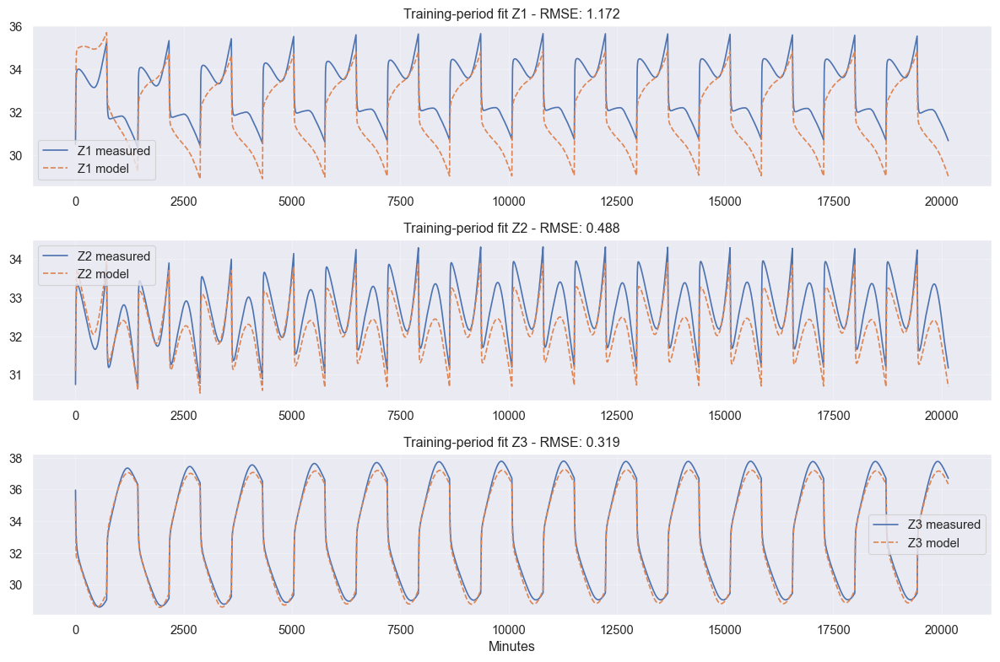

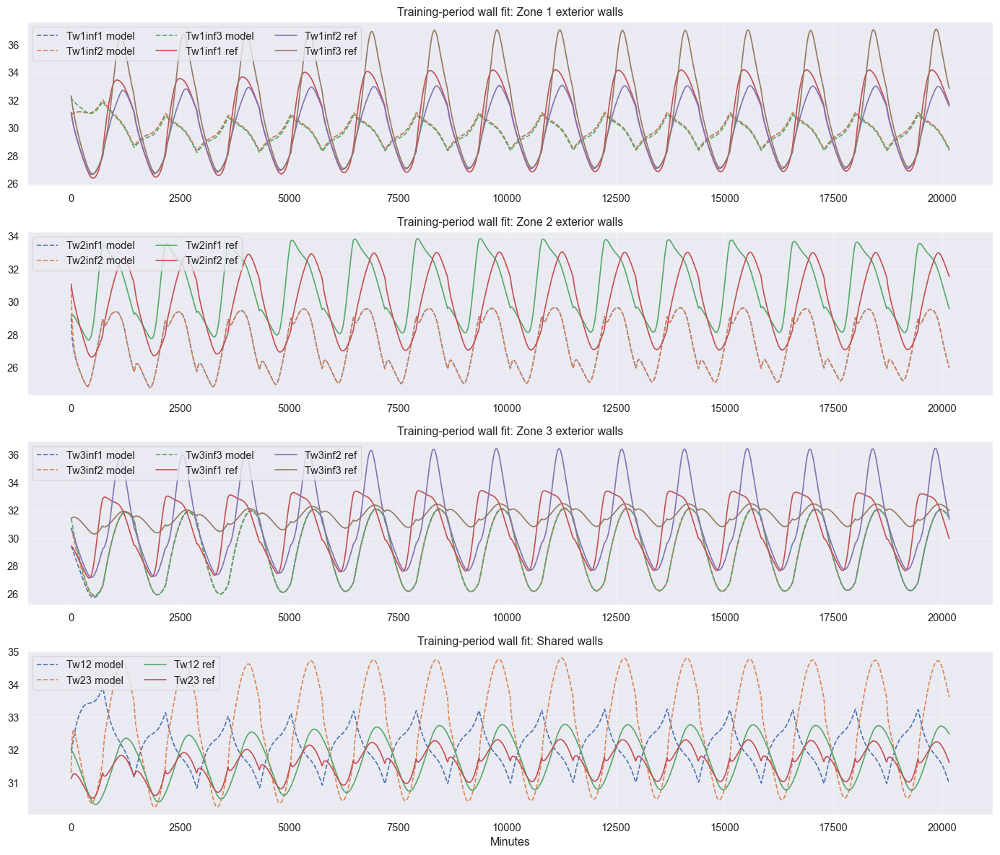

In [68]:
# ============================================================
# TRAINING-PERIOD FIT ONLY
# - no separate validation
# - no measured wall temperatures after initialization
# - parameters frozen after training
# - only zones + wall states propagate
# - plots + RMSE on same training period
# ============================================================

import numpy as np
import matplotlib.pyplot as plt

# ------------------------------------------------------------
# 7) UKF training
# zone measurements only in update
# wall refs used only through make_xa0() at first initialization
# ------------------------------------------------------------
def run_augmented_ukf_zone_only(idx, xa0=None, P0=None):
    xa = make_xa0(int(idx[0])) if xa0 is None else project_aug_state(np.array(xa0, dtype=float).copy())
    P = make_P0() if P0 is None else 0.5 * (np.array(P0, dtype=float) + np.array(P0, dtype=float).T)

    Xa_hist = np.zeros((len(idx), n_aug))
    Yhat_hist = np.zeros((len(idx), n_y))
    Innov_hist = np.zeros((len(idx), n_y))

    for j, k in enumerate(idx):
        u_k = np.array([Tout[k], U1[k], U2[k], U3[k], S1[k], S2[k], S3[k]], dtype=float)
        y_k = np.array([Z1[k], Z2[k], Z3[k]], dtype=float)

        xa_pred, P_pred, Xp = ukf.predict(xa, P, Q, u_k, Ts)
        xa, P, y_pred, innov = ukf.update(xa_pred, P_pred, Xp, R, y_k)

        Xa_hist[j] = xa
        Yhat_hist[j] = y_pred
        Innov_hist[j] = innov

        if (j + 1) % 1000 == 0:
            print(f"UKF training step {j+1}/{len(idx)} done")

    return Xa_hist, Yhat_hist, Innov_hist, xa, P

Xa_train, Yhat_train, Innov_train, xa_last, P_last = run_augmented_ukf_zone_only(
    idx=idx_train,
    xa0=None,
    P0=None
)

# ------------------------------------------------------------
# 8) Freeze parameters from final part of training
# ------------------------------------------------------------
tail_len = min(1 * samples_per_day, len(Xa_train))
theta_hat = np.mean(Xa_train[-tail_len:, n_phys:], axis=0)
theta_hat = project_aug_state(np.r_[np.zeros(n_phys), theta_hat])[n_phys:]

print("\nFrozen parameter estimates:")
for name, val in zip(param_names_aug, theta_hat):
    print(f"{name} = {val:.6g}")

# ------------------------------------------------------------
# 9) Build training-start rollout initial state
# use first training point only
# after that, NO measured wall temps are used
# ------------------------------------------------------------
xa_train0 = np.array(Xa_train[0], dtype=float).copy()
xa_train0[n_phys:] = theta_hat
xa_train0 = project_aug_state(xa_train0)

# ------------------------------------------------------------
# 10) Pure open-loop rollout on TRAINING PERIOD
# parameters fixed, only physical states propagate
# ------------------------------------------------------------
def simulate_open_loop_train(idx, xa0):
    xa = project_aug_state(np.array(xa0, dtype=float).copy())
    xa[n_phys:] = theta_hat

    Xa_sim = np.zeros((len(idx), n_aug))
    Yhat_sim = np.zeros((len(idx), 3))

    for j, k in enumerate(idx):
        u_k = np.array([Tout[k], U1[k], U2[k], U3[k], S1[k], S2[k], S3[k]], dtype=float)
        xa = f_aug_disc(xa, u_k, Ts, n_substeps=1)
        xa[n_phys:] = theta_hat
        xa = project_aug_state(xa)

        Xa_sim[j] = xa
        Yhat_sim[j] = xa[:3]

    return Xa_sim, Yhat_sim

Xa_train_roll, Yhat_train_roll = simulate_open_loop_train(
    idx=idx_train,
    xa0=xa_train0
)

# ------------------------------------------------------------
# 11) RMSE on SAME TRAINED PERIOD
# ------------------------------------------------------------
def rmse(a, b):
    a = np.asarray(a, dtype=float)
    b = np.asarray(b, dtype=float)
    return np.sqrt(np.mean((a - b) ** 2))

Y_train_meas = np.column_stack([Z1[idx_train], Z2[idx_train], Z3[idx_train]])

train_fit_rmse_z1 = rmse(Z1[idx_train], Yhat_train_roll[:, 0])
train_fit_rmse_z2 = rmse(Z2[idx_train], Yhat_train_roll[:, 1])
train_fit_rmse_z3 = rmse(Z3[idx_train], Yhat_train_roll[:, 2])
train_fit_rmse_all = np.sqrt(np.mean((Y_train_meas - Yhat_train_roll) ** 2))

print("\nTraining-period open-loop RMSE:")
print(f"Z1 = {train_fit_rmse_z1:.6f}")
print(f"Z2 = {train_fit_rmse_z2:.6f}")
print(f"Z3 = {train_fit_rmse_z3:.6f}")
print(f"Overall = {train_fit_rmse_all:.6f}")

# ------------------------------------------------------------
# 12) Zone plots on training period
# ------------------------------------------------------------
plt.figure(figsize=(12, 8))

ax1 = plt.subplot(3, 1, 1)
ax1.plot(t_train, Z1[idx_train], label="Z1 measured")
ax1.plot(t_train, Yhat_train_roll[:, 0], "--", label="Z1 model")
ax1.set_title(f"Training-period fit Z1 - RMSE: {train_fit_rmse_z1:.3f}")
ax1.grid(True, alpha=0.3)
ax1.legend()

ax2 = plt.subplot(3, 1, 2, sharex=ax1)
ax2.plot(t_train, Z2[idx_train], label="Z2 measured")
ax2.plot(t_train, Yhat_train_roll[:, 1], "--", label="Z2 model")
ax2.set_title(f"Training-period fit Z2 - RMSE: {train_fit_rmse_z2:.3f}")
ax2.grid(True, alpha=0.3)
ax2.legend()

ax3 = plt.subplot(3, 1, 3, sharex=ax1)
ax3.plot(t_train, Z3[idx_train], label="Z3 measured")
ax3.plot(t_train, Yhat_train_roll[:, 2], "--", label="Z3 model")
ax3.set_title(f"Training-period fit Z3 - RMSE: {train_fit_rmse_z3:.3f}")
ax3.set_xlabel("Minutes")
ax3.grid(True, alpha=0.3)
ax3.legend()

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# 13) Optional wall-state plots on training period
# these are model-propagated walls, not re-injected measured walls
# ------------------------------------------------------------
Xtrain_roll_phys = Xa_train_roll[:, :n_phys]

plt.figure(figsize=(14, 12))

ax1 = plt.subplot(4, 1, 1)
ax1.plot(t_train, Xtrain_roll_phys[:, 3], "--", label="Tw1inf1 model")
ax1.plot(t_train, Xtrain_roll_phys[:, 4], "--", label="Tw1inf2 model")
ax1.plot(t_train, Xtrain_roll_phys[:, 5], "--", label="Tw1inf3 model")
ax1.plot(t_train, Tw1inf1_ref[idx_train], label="Tw1inf1 ref")
ax1.plot(t_train, Tw1inf2_ref[idx_train], label="Tw1inf2 ref")
ax1.plot(t_train, Tw1inf3_ref[idx_train], label="Tw1inf3 ref")
ax1.set_title("Training-period wall fit: Zone 1 exterior walls")
ax1.grid(True, alpha=0.3)
ax1.legend(ncol=3)

ax2 = plt.subplot(4, 1, 2, sharex=ax1)
ax2.plot(t_train, Xtrain_roll_phys[:, 6], "--", label="Tw2inf1 model")
ax2.plot(t_train, Xtrain_roll_phys[:, 7], "--", label="Tw2inf2 model")
ax2.plot(t_train, Tw2inf1_ref[idx_train], label="Tw2inf1 ref")
ax2.plot(t_train, Tw2inf2_ref[idx_train], label="Tw2inf2 ref")
ax2.set_title("Training-period wall fit: Zone 2 exterior walls")
ax2.grid(True, alpha=0.3)
ax2.legend(ncol=2)

ax3 = plt.subplot(4, 1, 3, sharex=ax1)
ax3.plot(t_train, Xtrain_roll_phys[:, 8], "--", label="Tw3inf1 model")
ax3.plot(t_train, Xtrain_roll_phys[:, 9], "--", label="Tw3inf2 model")
ax3.plot(t_train, Xtrain_roll_phys[:, 10], "--", label="Tw3inf3 model")
ax3.plot(t_train, Tw3inf1_ref[idx_train], label="Tw3inf1 ref")
ax3.plot(t_train, Tw3inf2_ref[idx_train], label="Tw3inf2 ref")
ax3.plot(t_train, Tw3inf3_ref[idx_train], label="Tw3inf3 ref")
ax3.set_title("Training-period wall fit: Zone 3 exterior walls")
ax3.grid(True, alpha=0.3)
ax3.legend(ncol=3)

ax4 = plt.subplot(4, 1, 4, sharex=ax1)
ax4.plot(t_train, Xtrain_roll_phys[:, 11], "--", label="Tw12 model")
ax4.plot(t_train, Xtrain_roll_phys[:, 12], "--", label="Tw23 model")
ax4.plot(t_train, Tw12_ref[idx_train], label="Tw12 ref")
ax4.plot(t_train, Tw23_ref[idx_train], label="Tw23 ref")
ax4.set_title("Training-period wall fit: Shared walls")
ax4.set_xlabel("Minutes")
ax4.grid(True, alpha=0.3)
ax4.legend(ncol=2)

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# 14) Save outputs
# ------------------------------------------------------------
Xa_train_augukf_zoneonly_trainfit = Xa_train
Yhat_train_augukf_zoneonly_trainfit = Yhat_train
Innov_train_augukf_zoneonly_trainfit = Innov_train

theta_hat_augukf_zoneonly_trainfit = theta_hat

Xa_train_roll_augukf_zoneonly_trainfit = Xa_train_roll
Yhat_train_roll_augukf_zoneonly_trainfit = Yhat_train_roll

idx_train_augukf_zoneonly_trainfit = idx_train
t_train_augukf_zoneonly_trainfit = t_train


Frozen parameters used in this validation block:
Cz1 = 139585
Cz2 = 230434
Cz3 = 157705
Cw1i1 = 1.42852e+06
Cw1i2 = 1.43077e+06
Cw1i3 = 1.33459e+06
Cw2i1 = 290299
Cw2i2 = 289943
Cw3i1 = 800240
Cw3i2 = 810181
Cw3i3 = 815955
Cw12 = 1.93967e+06
Cw23 = 339980
Kz1w1 = 81.1067
Kz1w2 = 81.2454
Kz1w3 = 75.2688
Kz2w1 = 62.7277
Kz2w2 = 62.5028
Kz3w1 = 41.4305
Kz3w2 = 41.2722
Kz3w3 = 41.1707
Ka1 = 24.932
Ka2 = 66.0831
Ka3 = 24.9813
K12 = 62.055
K23 = 187.227
D1 = 0.04822
D2 = 0.0407884
D3 = 0.0141562

===== PURE OPEN-LOOP VALIDATION RMSE =====
Z1 = 1.141135
Z2 = 0.533419
Z3 = 0.367190
Overall = 0.757529


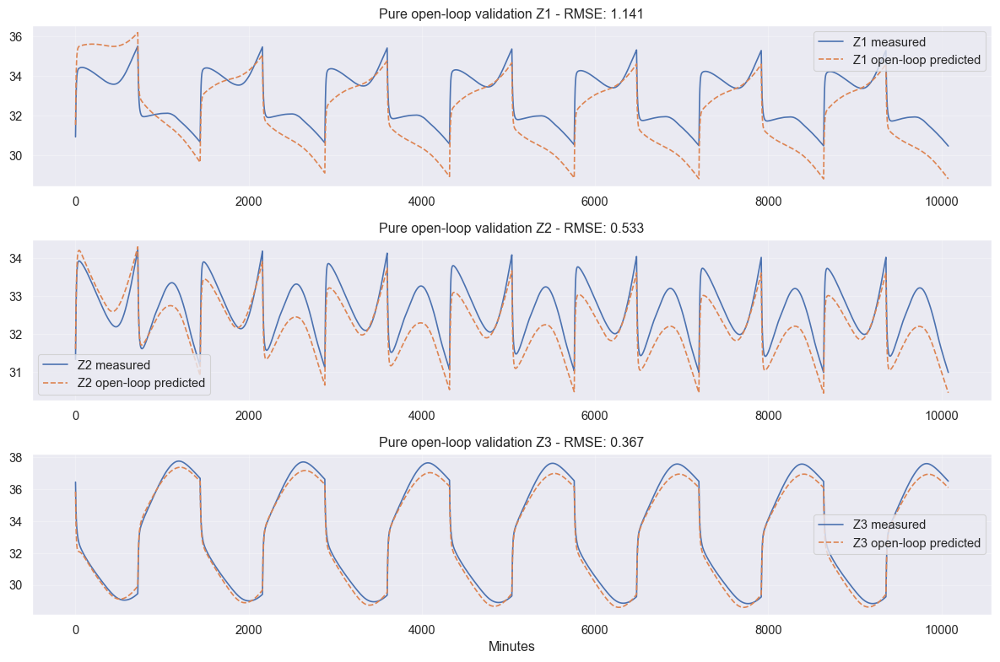


===== H-STEP-AHEAD VALIDATION RMSE =====

1-step ahead:
  Z1 = 0.246744
  Z2 = 0.053506
  Z3 = 0.134027
  Overall = 0.165034

2-step ahead:
  Z1 = 0.460391
  Z2 = 0.098129
  Z3 = 0.245681
  Overall = 0.306566

5-step ahead:
  Z1 = 0.944664
  Z2 = 0.193560
  Z3 = 0.481956
  Overall = 0.622398

10-step ahead:
  Z1 = 1.403314
  Z2 = 0.273764
  Z3 = 0.680068
  Overall = 0.914099

20-step ahead:
  Z1 = 1.724213
  Z2 = 0.316366
  Z3 = 0.820069
  Overall = 1.117365

30-step ahead:
  Z1 = 1.783569
  Z2 = 0.313555
  Z3 = 0.889728
  Overall = 1.164911

50-step ahead:
  Z1 = 1.764780
  Z2 = 0.283831
  Z3 = 0.979113
  Overall = 1.176672

RMSE summary by horizon:
   horizon_steps  horizon_minutes   rmse_z1   rmse_z2   rmse_z3  rmse_overall
0              1              1.0  0.246744  0.053506  0.134027      0.165034
1              2              2.0  0.460391  0.098129  0.245681      0.306566
2              5              5.0  0.944664  0.193560  0.481956      0.622398
3             10            

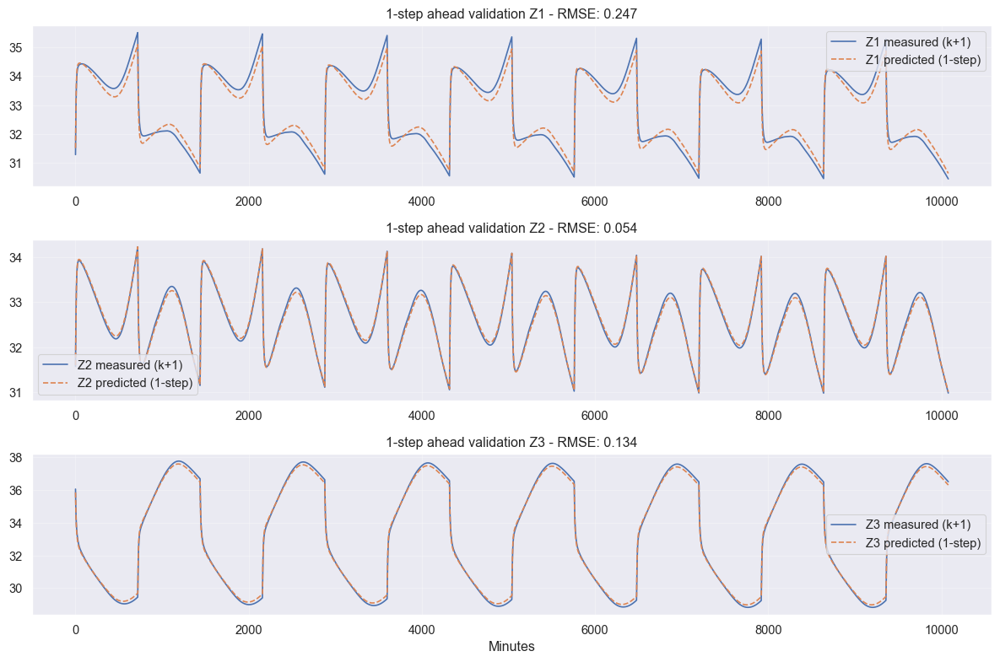

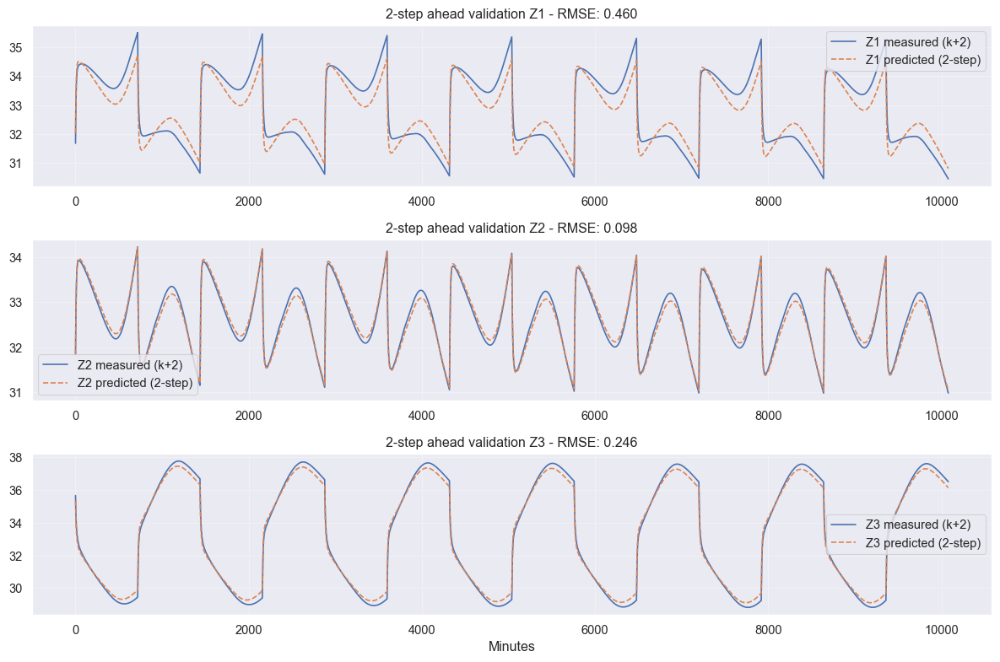

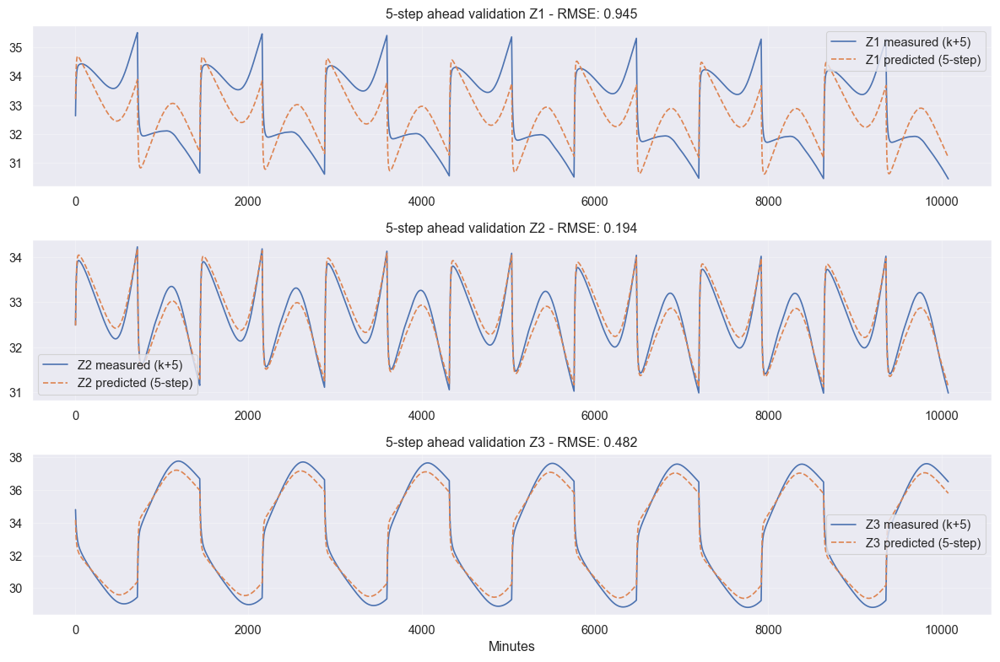

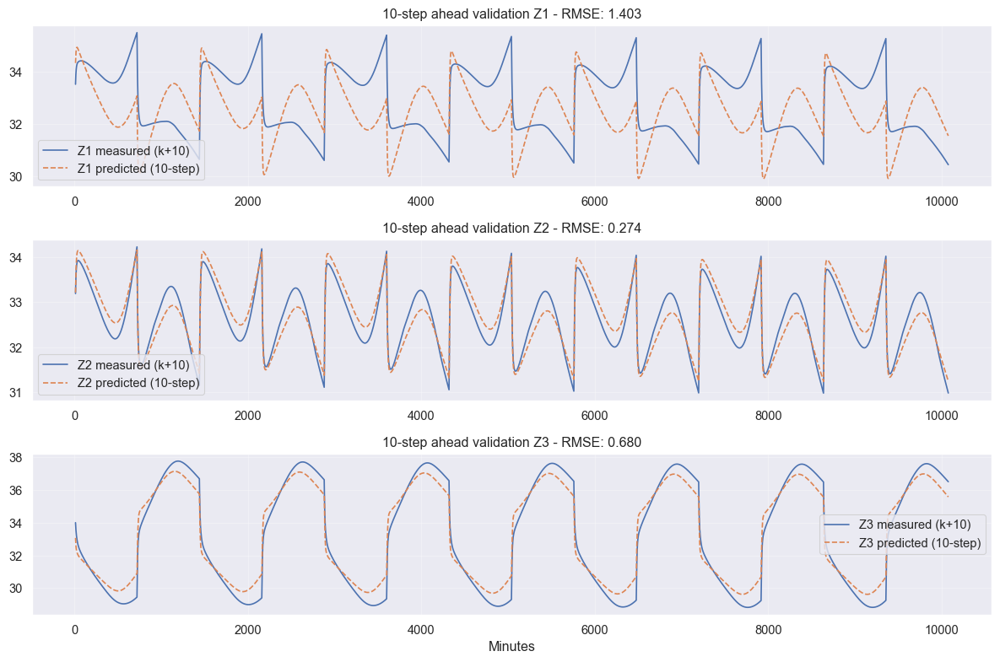

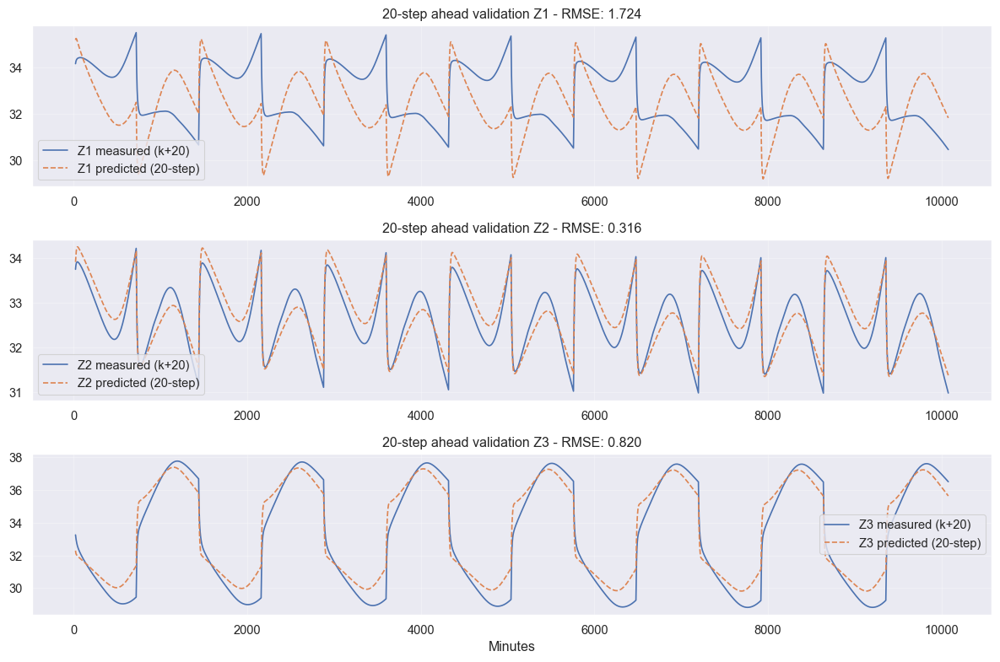

...

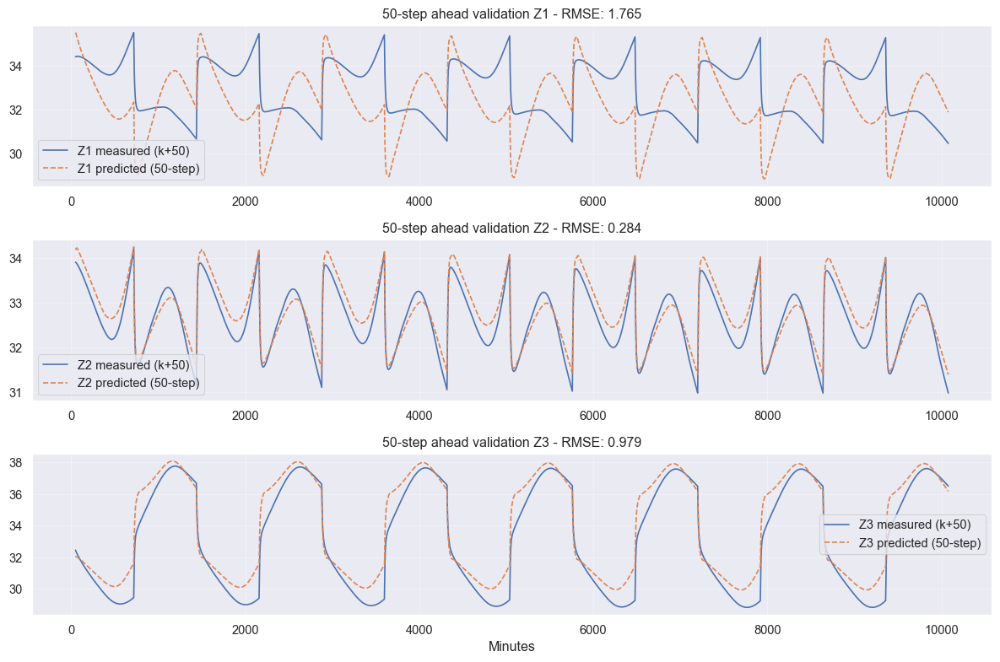

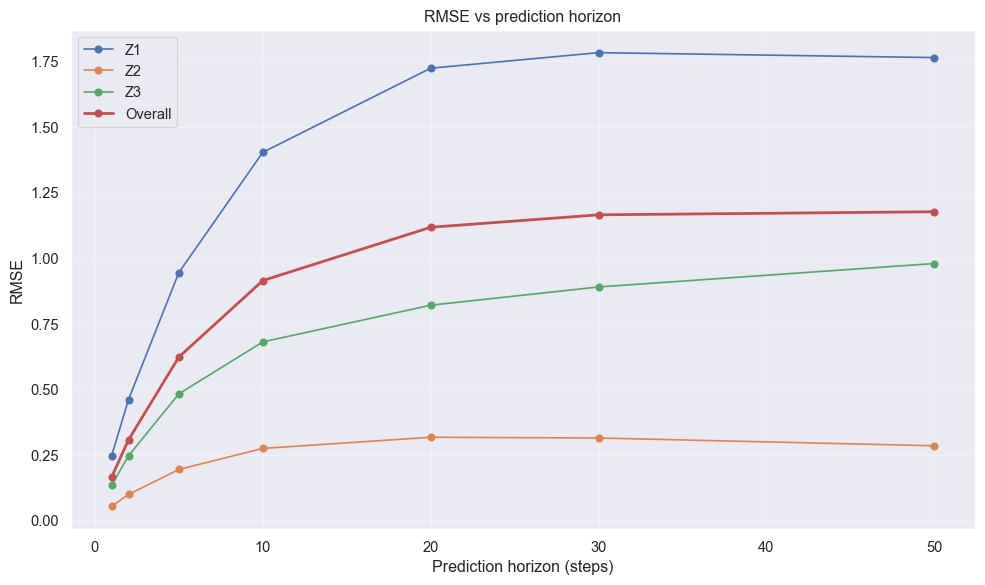

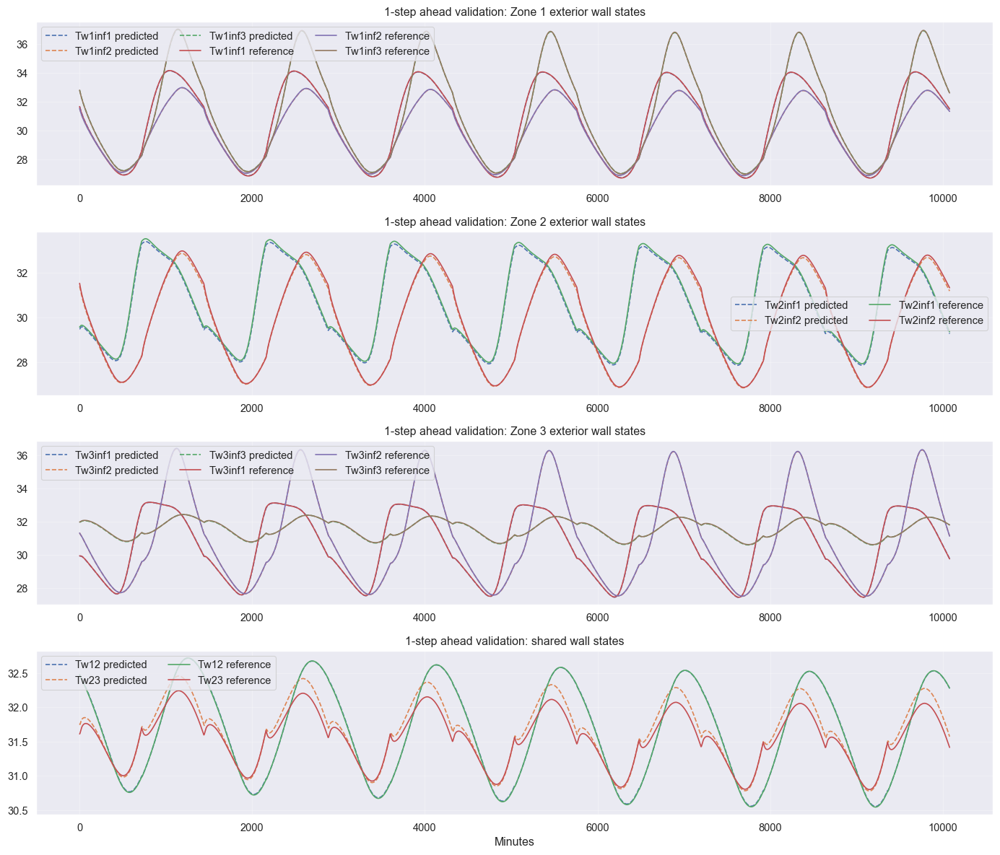

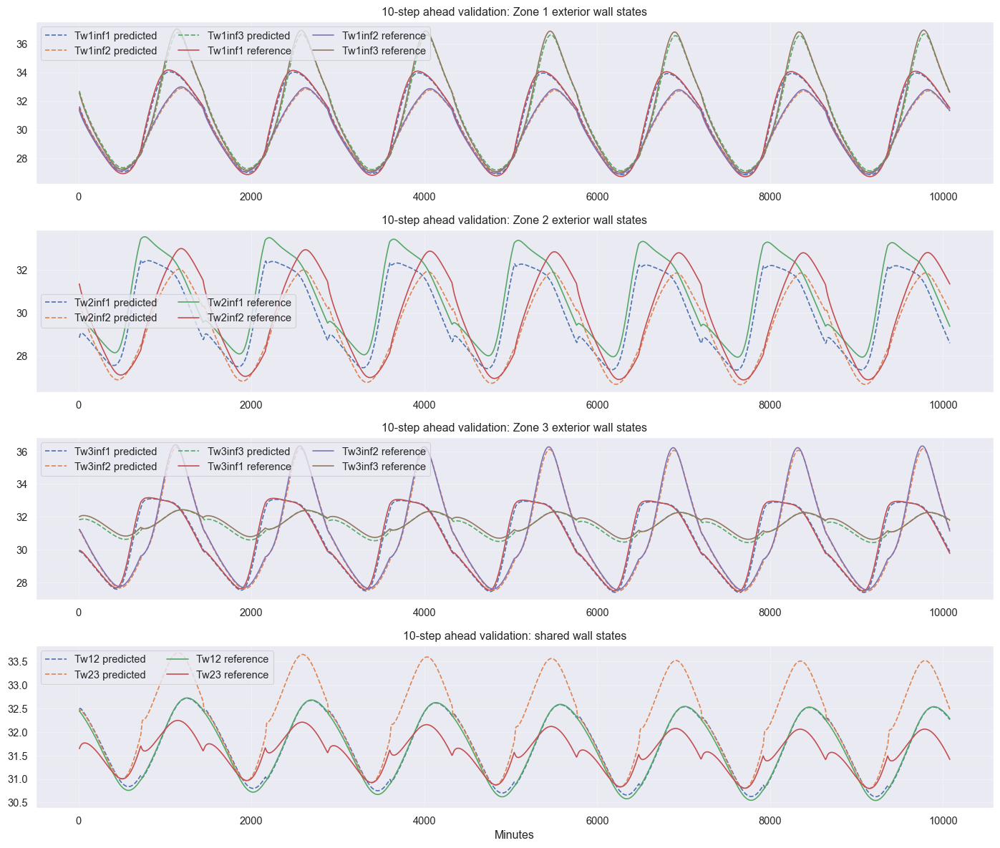

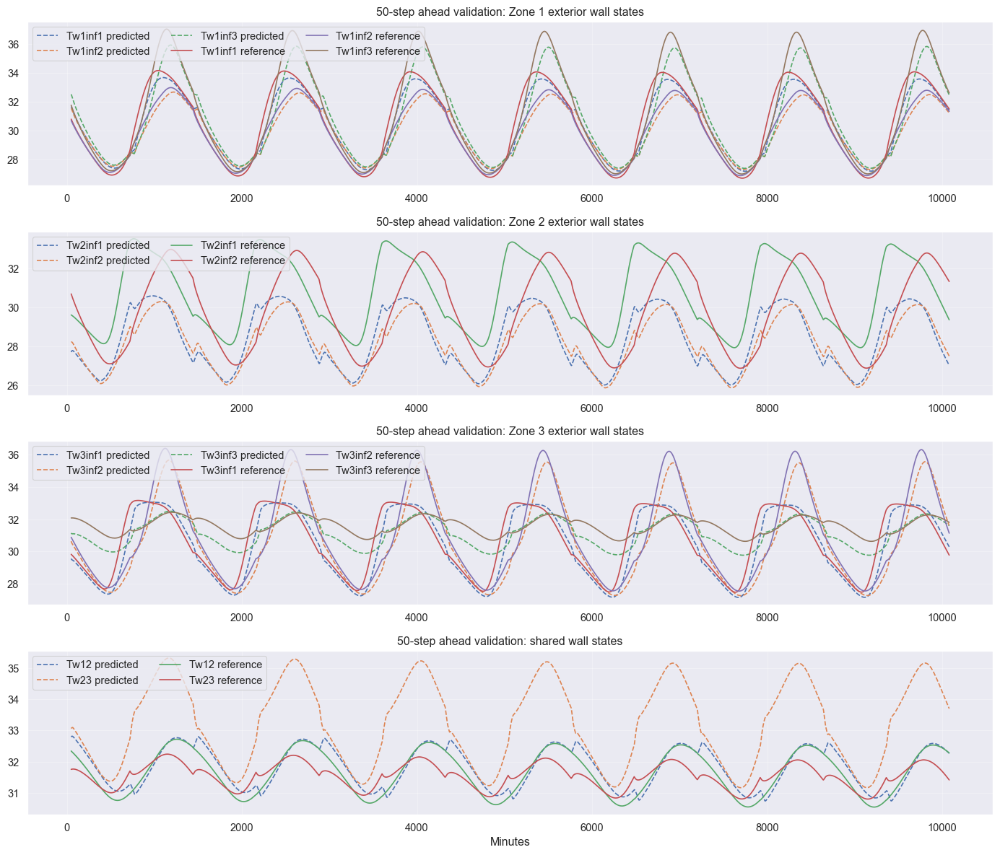

In [66]:
# ============================================================
# VALIDATION ONLY BLOCK
# - uses frozen theta_hat from UKF training above
# - propagates ONLY physical states (zones + walls)
# - parameters are FIXED constants during validation
# - provides:
#     1) pure open-loop validation
#     2) h-step-ahead validation for multiple horizons
#     3) RMSE tables/prints
#     4) zone plots for each horizon
#     5) RMSE-vs-horizon plot
# ============================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# ------------------------------------------------------------
# 0) Safety checks
# ------------------------------------------------------------
required_names = [
    "theta_hat", "idx_val", "t_val", "Ts",
    "Z1", "Z2", "Z3", "Tout", "U1", "U2", "U3", "S1", "S2", "S3",
    "Tw1inf1_ref", "Tw1inf2_ref", "Tw1inf3_ref",
    "Tw2inf1_ref", "Tw2inf2_ref",
    "Tw3inf1_ref", "Tw3inf2_ref", "Tw3inf3_ref",
    "Tw12_ref", "Tw23_ref"
]
for _nm in required_names:
    if _nm not in globals():
        raise NameError(f"Required variable '{_nm}' not found above this block.")

# ------------------------------------------------------------
# 1) Fixed parameter unpacking from theta_hat
# state order:
# [z1, z2, z3, tw1i1, tw1i2, tw1i3, tw2i1, tw2i2,
#  tw3i1, tw3i2, tw3i3, tw12, tw23]
# ------------------------------------------------------------
def unpack_theta_fixed(theta):
    theta = np.asarray(theta, dtype=float).copy()

    if len(theta) != 29:
        raise ValueError(f"theta_hat must have length 29, got {len(theta)}")

    (Cz1, Cz2, Cz3,
     Cw1i1, Cw1i2, Cw1i3,
     Cw2i1, Cw2i2,
     Cw3i1, Cw3i2, Cw3i3,
     Cw12, Cw23,
     Kz1w1, Kz1w2, Kz1w3,
     Kz2w1, Kz2w2,
     Kz3w1, Kz3w2, Kz3w3,
     Ka1, Ka2, Ka3,
     K12, K23,
     D1, D2, D3) = theta

    return {
        "Cz1": Cz1, "Cz2": Cz2, "Cz3": Cz3,
        "Cw1i1": Cw1i1, "Cw1i2": Cw1i2, "Cw1i3": Cw1i3,
        "Cw2i1": Cw2i1, "Cw2i2": Cw2i2,
        "Cw3i1": Cw3i1, "Cw3i2": Cw3i2, "Cw3i3": Cw3i3,
        "Cw12": Cw12, "Cw23": Cw23,
        "Kz1w1": Kz1w1, "Kz1w2": Kz1w2, "Kz1w3": Kz1w3,
        "Kz2w1": Kz2w1, "Kz2w2": Kz2w2,
        "Kz3w1": Kz3w1, "Kz3w2": Kz3w2, "Kz3w3": Kz3w3,
        "Ka1": Ka1, "Ka2": Ka2, "Ka3": Ka3,
        "K12": K12, "K23": K23,
        "D1": D1, "D2": D2, "D3": D3,
    }

theta_fixed = unpack_theta_fixed(theta_hat)

print("\nFrozen parameters used in this validation block:")
for k, v in theta_fixed.items():
    print(f"{k} = {v:.6g}")

# ------------------------------------------------------------
# 2) Physical-state helpers only
# ------------------------------------------------------------
TEMP_MIN_LOCAL = globals().get("TEMP_MIN", -20.0)
TEMP_MAX_LOCAL = globals().get("TEMP_MAX", 80.0)

def project_phys_state(x):
    x = np.asarray(x, dtype=float).copy()
    x = np.nan_to_num(x, nan=0.0, posinf=TEMP_MAX_LOCAL, neginf=TEMP_MIN_LOCAL)
    x = np.clip(x, TEMP_MIN_LOCAL, TEMP_MAX_LOCAL)
    return x

def make_measured_phys_state(k):
    x_phys = np.array([
        Z1[k], Z2[k], Z3[k],
        Tw1inf1_ref[k], Tw1inf2_ref[k], Tw1inf3_ref[k],
        Tw2inf1_ref[k], Tw2inf2_ref[k],
        Tw3inf1_ref[k], Tw3inf2_ref[k], Tw3inf3_ref[k],
        Tw12_ref[k], Tw23_ref[k]
    ], dtype=float)
    return project_phys_state(x_phys)

def make_input_u(k):
    return np.array([Tout[k], U1[k], U2[k], U3[k], S1[k], S2[k], S3[k]], dtype=float)

def f_phys_cont(x_phys, u, theta):
    x_phys = project_phys_state(x_phys)

    z1, z2, z3 = x_phys[0], x_phys[1], x_phys[2]
    tw1i1, tw1i2, tw1i3 = x_phys[3], x_phys[4], x_phys[5]
    tw2i1, tw2i2 = x_phys[6], x_phys[7]
    tw3i1, tw3i2, tw3i3 = x_phys[8], x_phys[9], x_phys[10]
    tw12, tw23 = x_phys[11], x_phys[12]

    tout, u1, u2, u3, s1, s2, s3 = u

    B1 = 1.0
    B2 = 1.0
    B3 = 1.0

    dz1 = (
        theta["Kz1w1"] * (tw1i1 - z1) +
        theta["Kz1w2"] * (tw1i2 - z1) +
        theta["Kz1w3"] * (tw1i3 - z1) +
        theta["K12"]   * (tw12  - z1) +
        B1 * u1 +
        theta["D1"] * s1
    ) / theta["Cz1"]

    dz2 = (
        theta["Kz2w1"] * (tw2i1 - z2) +
        theta["Kz2w2"] * (tw2i2 - z2) +
        theta["K12"]   * (tw12  - z2) +
        theta["K23"]   * (tw23  - z2) +
        B2 * u2 +
        theta["D2"] * s2
    ) / theta["Cz2"]

    dz3 = (
        theta["Kz3w1"] * (tw3i1 - z3) +
        theta["Kz3w2"] * (tw3i2 - z3) +
        theta["Kz3w3"] * (tw3i3 - z3) +
        theta["K23"]   * (tw23  - z3) +
        B3 * u3 +
        theta["D3"] * s3
    ) / theta["Cz3"]

    dtw1i1 = (theta["Kz1w1"] * (z1 - tw1i1) + theta["Ka1"] * (tout - tw1i1)) / theta["Cw1i1"]
    dtw1i2 = (theta["Kz1w2"] * (z1 - tw1i2) + theta["Ka1"] * (tout - tw1i2)) / theta["Cw1i2"]
    dtw1i3 = (theta["Kz1w3"] * (z1 - tw1i3) + theta["Ka1"] * (tout - tw1i3)) / theta["Cw1i3"]

    dtw2i1 = (theta["Kz2w1"] * (z2 - tw2i1) + theta["Ka2"] * (tout - tw2i1)) / theta["Cw2i1"]
    dtw2i2 = (theta["Kz2w2"] * (z2 - tw2i2) + theta["Ka2"] * (tout - tw2i2)) / theta["Cw2i2"]

    dtw3i1 = (theta["Kz3w1"] * (z3 - tw3i1) + theta["Ka3"] * (tout - tw3i1)) / theta["Cw3i1"]
    dtw3i2 = (theta["Kz3w2"] * (z3 - tw3i2) + theta["Ka3"] * (tout - tw3i2)) / theta["Cw3i2"]
    dtw3i3 = (theta["Kz3w3"] * (z3 - tw3i3) + theta["Ka3"] * (tout - tw3i3)) / theta["Cw3i3"]

    dtw12 = (theta["K12"] * (z1 - tw12) + theta["K12"] * (z2 - tw12)) / theta["Cw12"]
    dtw23 = (theta["K23"] * (z2 - tw23) + theta["K23"] * (z3 - tw23)) / theta["Cw23"]

    dx = np.array([
        dz1, dz2, dz3,
        dtw1i1, dtw1i2, dtw1i3,
        dtw2i1, dtw2i2,
        dtw3i1, dtw3i2, dtw3i3,
        dtw12, dtw23
    ], dtype=float)

    dx = np.nan_to_num(dx, nan=0.0, posinf=1e3, neginf=-1e3)
    dx = np.clip(dx, -0.5, 0.5)
    return dx

def f_phys_disc(x_phys, u, Ts_local, theta, n_substeps=1):
    x = project_phys_state(x_phys)
    dt_sub = Ts_local / max(1, int(n_substeps))
    for _ in range(max(1, int(n_substeps))):
        dx = f_phys_cont(x, u, theta)
        x = x + dt_sub * dx
        x = project_phys_state(x)
    return x

def rmse_local(a, b):
    a = np.asarray(a, dtype=float)
    b = np.asarray(b, dtype=float)
    return np.sqrt(np.mean((a - b) ** 2))

# ------------------------------------------------------------
# 3) PURE OPEN-LOOP VALIDATION
# single initialization at first validation point,
# then free-run over whole validation horizon
# ------------------------------------------------------------
def simulate_open_loop_phys(idx, x0_phys, theta, n_substeps_pred=1):
    x = project_phys_state(x0_phys)
    X_hist = np.zeros((len(idx), 13))
    Yhat_hist = np.zeros((len(idx), 3))

    for j, k in enumerate(idx):
        u_k = make_input_u(k)
        x = f_phys_disc(x, u_k, Ts, theta, n_substeps=n_substeps_pred)
        X_hist[j] = x
        Yhat_hist[j] = x[:3]

    return X_hist, Yhat_hist

x0_val_phys = make_measured_phys_state(idx_val[0])

X_openloop_phys, Yhat_openloop_phys = simulate_open_loop_phys(
    idx=idx_val,
    x0_phys=x0_val_phys,
    theta=theta_fixed,
    n_substeps_pred=1
)

Ytrue_openloop = np.column_stack([Z1[idx_val], Z2[idx_val], Z3[idx_val]])

openloop_rmse_z1 = rmse_local(Ytrue_openloop[:, 0], Yhat_openloop_phys[:, 0])
openloop_rmse_z2 = rmse_local(Ytrue_openloop[:, 1], Yhat_openloop_phys[:, 1])
openloop_rmse_z3 = rmse_local(Ytrue_openloop[:, 2], Yhat_openloop_phys[:, 2])
openloop_rmse_overall = np.sqrt(np.mean((Ytrue_openloop - Yhat_openloop_phys) ** 2))

print("\n===== PURE OPEN-LOOP VALIDATION RMSE =====")
print(f"Z1 = {openloop_rmse_z1:.6f}")
print(f"Z2 = {openloop_rmse_z2:.6f}")
print(f"Z3 = {openloop_rmse_z3:.6f}")
print(f"Overall = {openloop_rmse_overall:.6f}")

plt.figure(figsize=(12, 8))

ax1 = plt.subplot(3, 1, 1)
ax1.plot(t_val, Z1[idx_val], label="Z1 measured")
ax1.plot(t_val, Yhat_openloop_phys[:, 0], "--", label="Z1 open-loop predicted")
ax1.set_title(f"Pure open-loop validation Z1 - RMSE: {openloop_rmse_z1:.3f}")
ax1.grid(True, alpha=0.3)
ax1.legend()

ax2 = plt.subplot(3, 1, 2, sharex=ax1)
ax2.plot(t_val, Z2[idx_val], label="Z2 measured")
ax2.plot(t_val, Yhat_openloop_phys[:, 1], "--", label="Z2 open-loop predicted")
ax2.set_title(f"Pure open-loop validation Z2 - RMSE: {openloop_rmse_z2:.3f}")
ax2.grid(True, alpha=0.3)
ax2.legend()

ax3 = plt.subplot(3, 1, 3, sharex=ax1)
ax3.plot(t_val, Z3[idx_val], label="Z3 measured")
ax3.plot(t_val, Yhat_openloop_phys[:, 2], "--", label="Z3 open-loop predicted")
ax3.set_title(f"Pure open-loop validation Z3 - RMSE: {openloop_rmse_z3:.3f}")
ax3.set_xlabel("Minutes")
ax3.grid(True, alpha=0.3)
ax3.legend()

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# 4) H-STEP-AHEAD VALIDATION
# measured physical state at k from dataframe,
# fixed theta thereafter, open-loop for h steps
# ------------------------------------------------------------
def simulate_h_step_ahead_phys(idx, horizon, theta, n_substeps_pred=1):
    n_steps = len(idx) - horizon
    if n_steps <= 0:
        raise ValueError(f"Horizon {horizon} is too large for idx_val length {len(idx)}")

    Xh = np.zeros((n_steps, 13))
    Yhat_h = np.zeros((n_steps, 3))
    Ytrue_h = np.zeros((n_steps, 3))
    t_h = t_val[horizon:]

    for j in range(n_steps):
        k0 = idx[j]
        x = make_measured_phys_state(k0)

        for m in range(horizon):
            kk = idx[j + m]
            u_kk = make_input_u(kk)
            x = f_phys_disc(x, u_kk, Ts, theta, n_substeps=n_substeps_pred)

        kt = idx[j + horizon]
        Xh[j] = x
        Yhat_h[j] = x[:3]
        Ytrue_h[j] = np.array([Z1[kt], Z2[kt], Z3[kt]], dtype=float)

    return Xh, Yhat_h, Ytrue_h, t_h

# horizons you want
horizons = [1, 2, 5, 10, 20, 30, 50]

horizon_results = {}

print("\n===== H-STEP-AHEAD VALIDATION RMSE =====")
for h in horizons:
    Xh, Yhat_h, Ytrue_h, t_h = simulate_h_step_ahead_phys(
        idx=idx_val,
        horizon=h,
        theta=theta_fixed,
        n_substeps_pred=1
    )

    rmse_z1 = rmse_local(Ytrue_h[:, 0], Yhat_h[:, 0])
    rmse_z2 = rmse_local(Ytrue_h[:, 1], Yhat_h[:, 1])
    rmse_z3 = rmse_local(Ytrue_h[:, 2], Yhat_h[:, 2])
    rmse_overall = np.sqrt(np.mean((Ytrue_h - Yhat_h) ** 2))

    horizon_results[h] = {
        "Xh": Xh,
        "Yhat": Yhat_h,
        "Ytrue": Ytrue_h,
        "t": t_h,
        "rmse_z1": rmse_z1,
        "rmse_z2": rmse_z2,
        "rmse_z3": rmse_z3,
        "rmse_overall": rmse_overall,
    }

    print(f"\n{h}-step ahead:")
    print(f"  Z1 = {rmse_z1:.6f}")
    print(f"  Z2 = {rmse_z2:.6f}")
    print(f"  Z3 = {rmse_z3:.6f}")
    print(f"  Overall = {rmse_overall:.6f}")

# ------------------------------------------------------------
# 5) RMSE summary table
# ------------------------------------------------------------
rmse_rows = []
for h in horizons:
    r = horizon_results[h]
    rmse_rows.append({
        "horizon_steps": h,
        "horizon_minutes": h * Ts / 60.0,
        "rmse_z1": r["rmse_z1"],
        "rmse_z2": r["rmse_z2"],
        "rmse_z3": r["rmse_z3"],
        "rmse_overall": r["rmse_overall"],
    })

rmse_horizon_df = pd.DataFrame(rmse_rows)
print("\nRMSE summary by horizon:")
print(rmse_horizon_df)

# ------------------------------------------------------------
# 6) zone plots for each horizon
# ------------------------------------------------------------
for h in horizons:
    r = horizon_results[h]
    Yhat_h = r["Yhat"]
    Ytrue_h = r["Ytrue"]
    t_h = r["t"]

    plt.figure(figsize=(12, 8))

    ax1 = plt.subplot(3, 1, 1)
    ax1.plot(t_h, Ytrue_h[:, 0], label=f"Z1 measured (k+{h})")
    ax1.plot(t_h, Yhat_h[:, 0], "--", label=f"Z1 predicted ({h}-step)")
    ax1.set_title(f"{h}-step ahead validation Z1 - RMSE: {r['rmse_z1']:.3f}")
    ax1.grid(True, alpha=0.3)
    ax1.legend()

    ax2 = plt.subplot(3, 1, 2, sharex=ax1)
    ax2.plot(t_h, Ytrue_h[:, 1], label=f"Z2 measured (k+{h})")
    ax2.plot(t_h, Yhat_h[:, 1], "--", label=f"Z2 predicted ({h}-step)")
    ax2.set_title(f"{h}-step ahead validation Z2 - RMSE: {r['rmse_z2']:.3f}")
    ax2.grid(True, alpha=0.3)
    ax2.legend()

    ax3 = plt.subplot(3, 1, 3, sharex=ax1)
    ax3.plot(t_h, Ytrue_h[:, 2], label=f"Z3 measured (k+{h})")
    ax3.plot(t_h, Yhat_h[:, 2], "--", label=f"Z3 predicted ({h}-step)")
    ax3.set_title(f"{h}-step ahead validation Z3 - RMSE: {r['rmse_z3']:.3f}")
    ax3.set_xlabel("Minutes")
    ax3.grid(True, alpha=0.3)
    ax3.legend()

    plt.tight_layout()
    plt.show()

# ------------------------------------------------------------
# 7) RMSE vs horizon plot
# ------------------------------------------------------------
plt.figure(figsize=(10, 6))
plt.plot(rmse_horizon_df["horizon_steps"], rmse_horizon_df["rmse_z1"], marker="o", label="Z1")
plt.plot(rmse_horizon_df["horizon_steps"], rmse_horizon_df["rmse_z2"], marker="o", label="Z2")
plt.plot(rmse_horizon_df["horizon_steps"], rmse_horizon_df["rmse_z3"], marker="o", label="Z3")
plt.plot(rmse_horizon_df["horizon_steps"], rmse_horizon_df["rmse_overall"], marker="o", linewidth=2, label="Overall")
plt.xlabel("Prediction horizon (steps)")
plt.ylabel("RMSE")
plt.title("RMSE vs prediction horizon")
plt.grid(True, alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# 8) Optional wall-state plots for selected horizons
# set to [] if you do not want wall plots
# ------------------------------------------------------------
wall_plot_horizons = [1, 10, 50]

for h in wall_plot_horizons:
    if h not in horizon_results:
        continue

    r = horizon_results[h]
    Xh = r["Xh"]
    t_h = r["t"]
    idx_target = idx_val[h:]

    plt.figure(figsize=(14, 12))

    ax1 = plt.subplot(4, 1, 1)
    ax1.plot(t_h, Xh[:, 3], "--", label="Tw1inf1 predicted")
    ax1.plot(t_h, Xh[:, 4], "--", label="Tw1inf2 predicted")
    ax1.plot(t_h, Xh[:, 5], "--", label="Tw1inf3 predicted")
    ax1.plot(t_h, Tw1inf1_ref[idx_target], label="Tw1inf1 reference")
    ax1.plot(t_h, Tw1inf2_ref[idx_target], label="Tw1inf2 reference")
    ax1.plot(t_h, Tw1inf3_ref[idx_target], label="Tw1inf3 reference")
    ax1.set_title(f"{h}-step ahead validation: Zone 1 exterior wall states")
    ax1.grid(True, alpha=0.3)
    ax1.legend(ncol=3)

    ax2 = plt.subplot(4, 1, 2, sharex=ax1)
    ax2.plot(t_h, Xh[:, 6], "--", label="Tw2inf1 predicted")
    ax2.plot(t_h, Xh[:, 7], "--", label="Tw2inf2 predicted")
    ax2.plot(t_h, Tw2inf1_ref[idx_target], label="Tw2inf1 reference")
    ax2.plot(t_h, Tw2inf2_ref[idx_target], label="Tw2inf2 reference")
    ax2.set_title(f"{h}-step ahead validation: Zone 2 exterior wall states")
    ax2.grid(True, alpha=0.3)
    ax2.legend(ncol=2)

    ax3 = plt.subplot(4, 1, 3, sharex=ax1)
    ax3.plot(t_h, Xh[:, 8], "--", label="Tw3inf1 predicted")
    ax3.plot(t_h, Xh[:, 9], "--", label="Tw3inf2 predicted")
    ax3.plot(t_h, Xh[:, 10], "--", label="Tw3inf3 predicted")
    ax3.plot(t_h, Tw3inf1_ref[idx_target], label="Tw3inf1 reference")
    ax3.plot(t_h, Tw3inf2_ref[idx_target], label="Tw3inf2 reference")
    ax3.plot(t_h, Tw3inf3_ref[idx_target], label="Tw3inf3 reference")
    ax3.set_title(f"{h}-step ahead validation: Zone 3 exterior wall states")
    ax3.grid(True, alpha=0.3)
    ax3.legend(ncol=3)

    ax4 = plt.subplot(4, 1, 4, sharex=ax1)
    ax4.plot(t_h, Xh[:, 11], "--", label="Tw12 predicted")
    ax4.plot(t_h, Xh[:, 12], "--", label="Tw23 predicted")
    ax4.plot(t_h, Tw12_ref[idx_target], label="Tw12 reference")
    ax4.plot(t_h, Tw23_ref[idx_target], label="Tw23 reference")
    ax4.set_title(f"{h}-step ahead validation: shared wall states")
    ax4.set_xlabel("Minutes")
    ax4.grid(True, alpha=0.3)
    ax4.legend(ncol=2)

    plt.tight_layout()
    plt.show()

# ------------------------------------------------------------
# 9) save outputs
# ------------------------------------------------------------
theta_fixed_validation_only_augukf_expanded_allstates_fast_recent = theta_fixed

X_openloop_phys_validation_only_augukf_expanded_allstates_fast_recent = X_openloop_phys
Yhat_openloop_phys_validation_only_augukf_expanded_allstates_fast_recent = Yhat_openloop_phys
Ytrue_openloop_validation_only_augukf_expanded_allstates_fast_recent = Ytrue_openloop

horizon_results_validation_only_augukf_expanded_allstates_fast_recent = horizon_results
rmse_horizon_df_validation_only_augukf_expanded_allstates_fast_recent = rmse_horizon_df


Frozen parameters used in this validation block:
Cz1 = 139585
Cz2 = 230434
Cz3 = 157705
Cw1i1 = 1.42852e+06
Cw1i2 = 1.43077e+06
Cw1i3 = 1.33459e+06
Cw2i1 = 290299
Cw2i2 = 289943
Cw3i1 = 800240
Cw3i2 = 810181
Cw3i3 = 815955
Cw12 = 1.93967e+06
Cw23 = 339980
Kz1w1 = 81.1067
Kz1w2 = 81.2454
Kz1w3 = 75.2688
Kz2w1 = 62.7277
Kz2w2 = 62.5028
Kz3w1 = 41.4305
Kz3w2 = 41.2722
Kz3w3 = 41.1707
Ka1 = 24.932
Ka2 = 66.0831
Ka3 = 24.9813
K12 = 62.055
K23 = 187.227
D1 = 0.04822
D2 = 0.0407884
D3 = 0.0141562

===== PURE OPEN-LOOP VALIDATION RMSE =====
Z1 = 1.141135
Z2 = 0.533419
Z3 = 0.367190
Overall = 0.757529


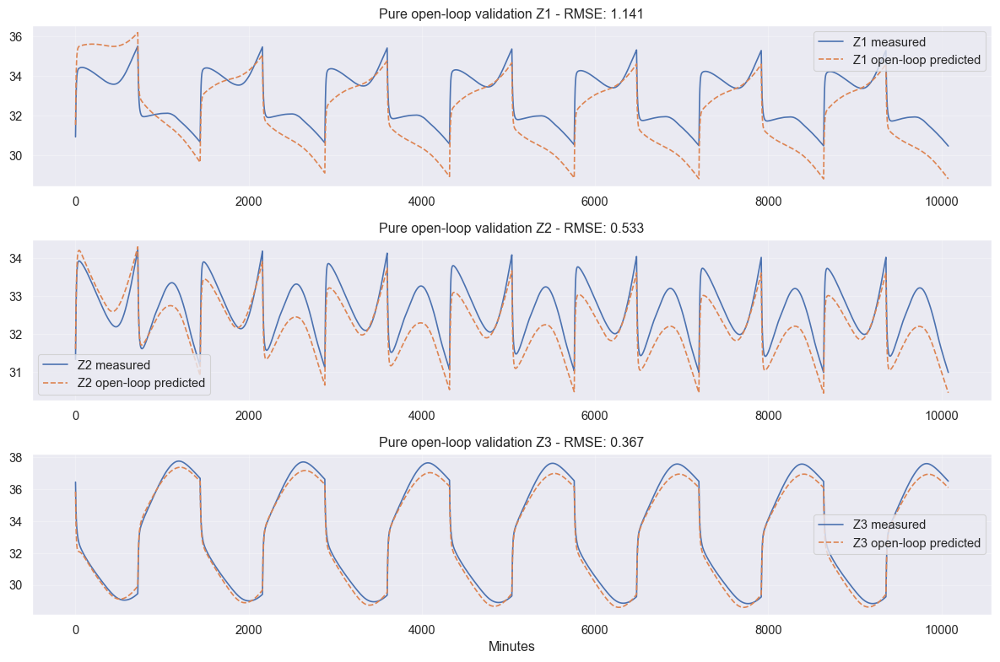


===== H-STEP-AHEAD VALIDATION RMSE =====

1-step ahead:
  Z1 = 0.246744
  Z2 = 0.053506
  Z3 = 0.134027
  Overall = 0.165034

2-step ahead:
  Z1 = 0.460391
  Z2 = 0.098129
  Z3 = 0.245681
  Overall = 0.306566

5-step ahead:
  Z1 = 0.944664
  Z2 = 0.193560
  Z3 = 0.481956
  Overall = 0.622398

10-step ahead:
  Z1 = 1.403314
  Z2 = 0.273764
  Z3 = 0.680068
  Overall = 0.914099

20-step ahead:
  Z1 = 1.724213
  Z2 = 0.316366
  Z3 = 0.820069
  Overall = 1.117365

30-step ahead:
  Z1 = 1.783569
  Z2 = 0.313555
  Z3 = 0.889728
  Overall = 1.164911

50-step ahead:
  Z1 = 1.764780
  Z2 = 0.283831
  Z3 = 0.979113
  Overall = 1.176672

RMSE summary by horizon:
   horizon_steps  horizon_minutes   rmse_z1   rmse_z2   rmse_z3  rmse_overall
0              1              1.0  0.246744  0.053506  0.134027      0.165034
1              2              2.0  0.460391  0.098129  0.245681      0.306566
2              5              5.0  0.944664  0.193560  0.481956      0.622398
3             10            

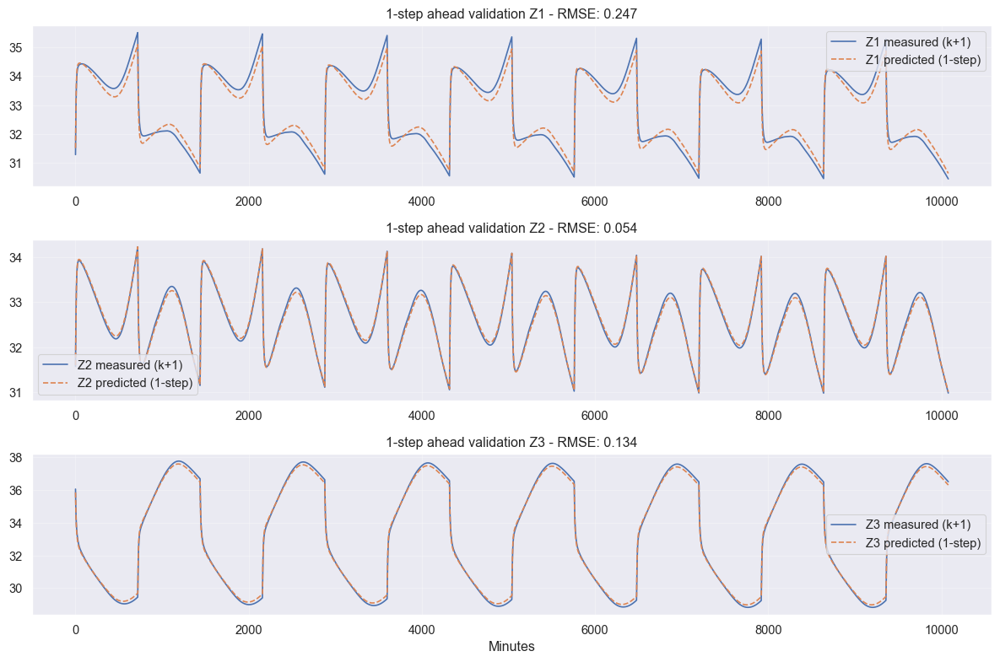

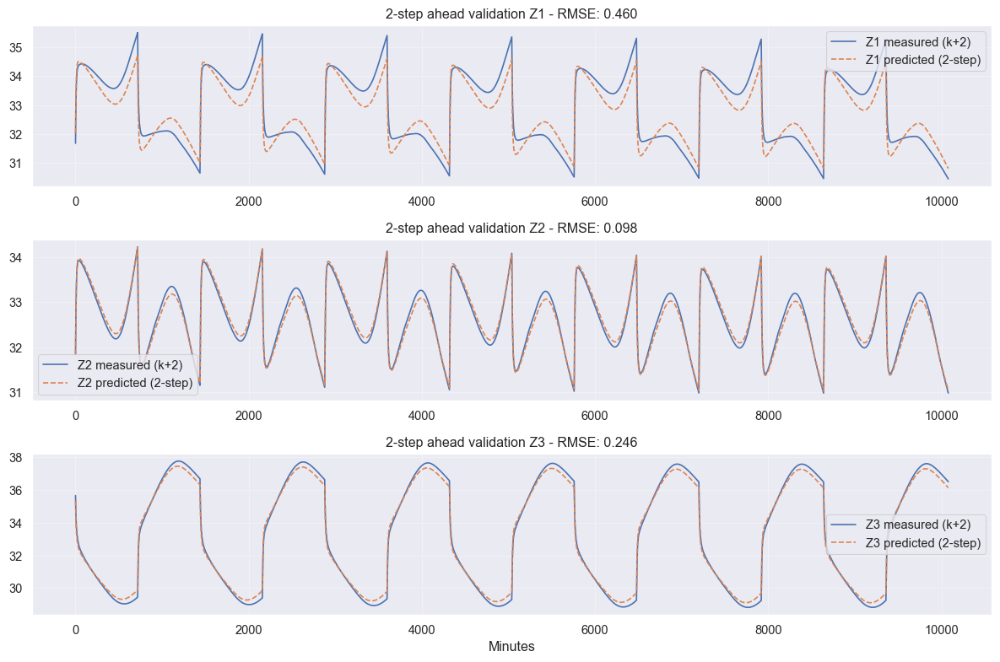

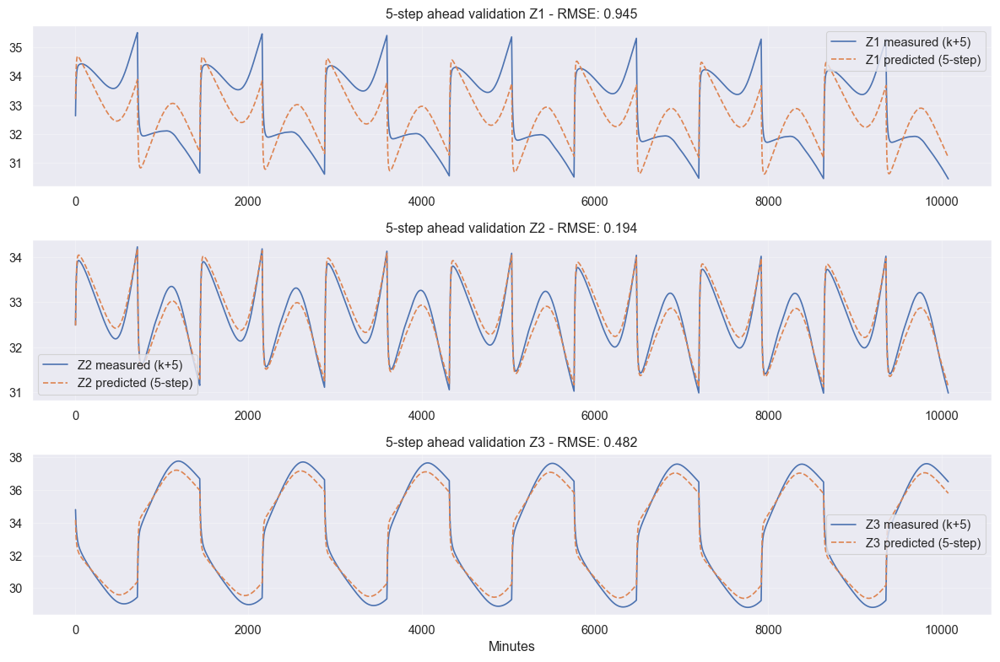

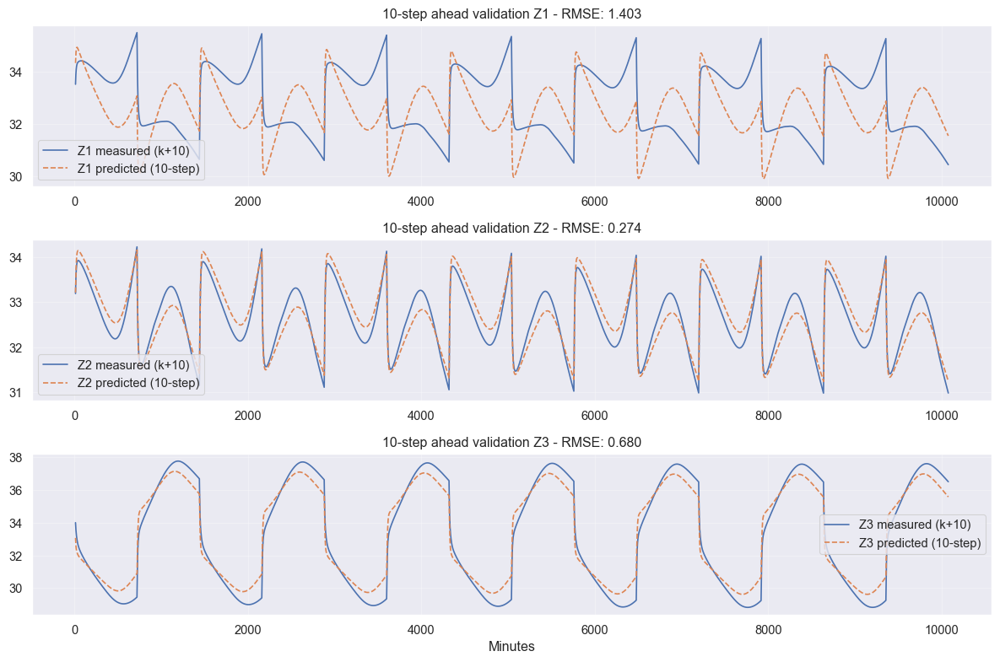

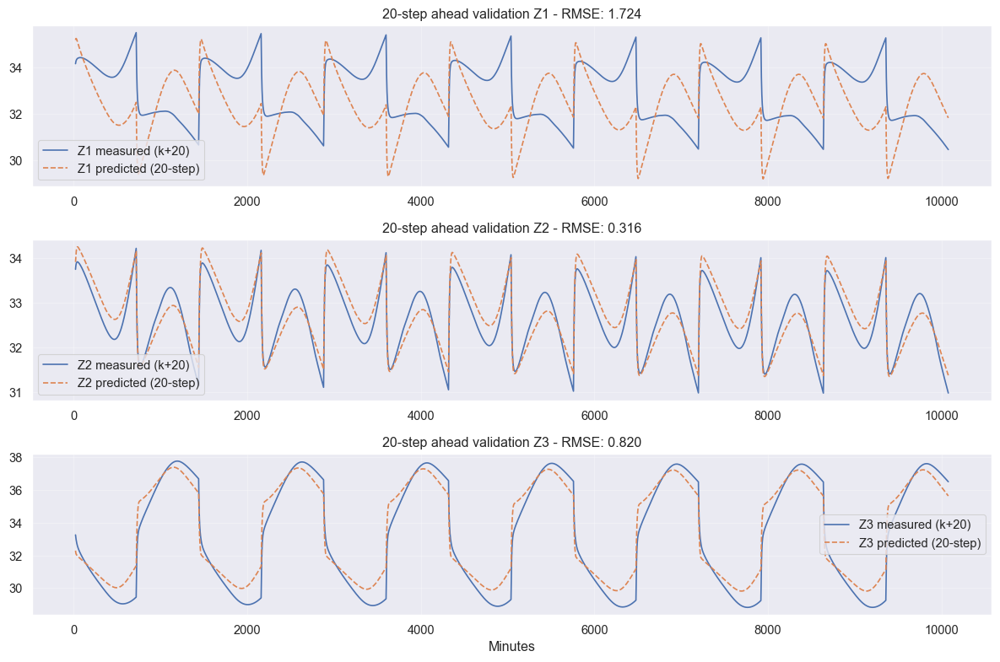

...

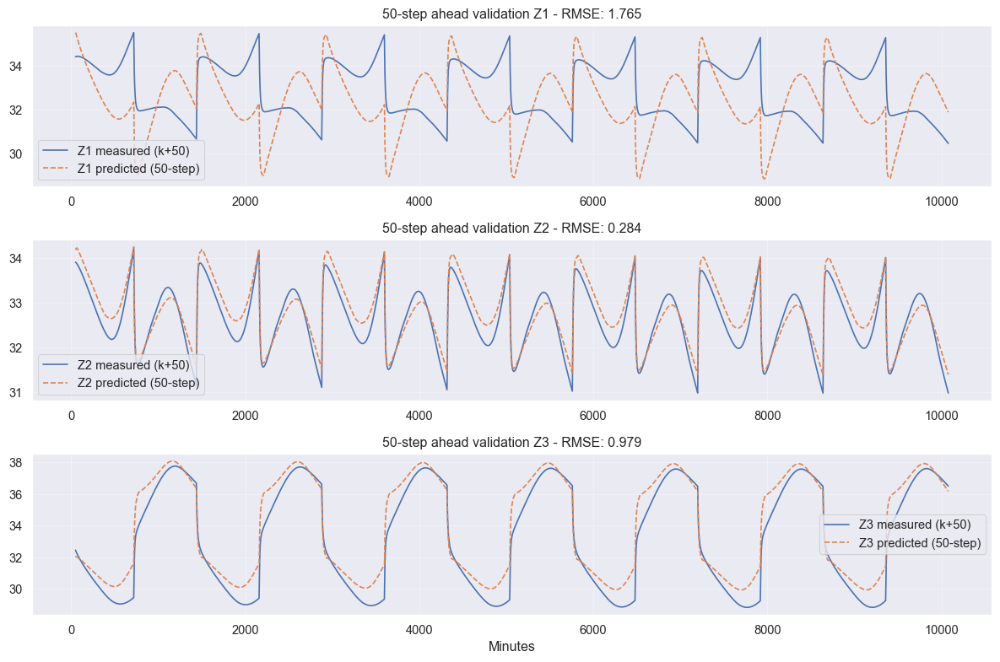

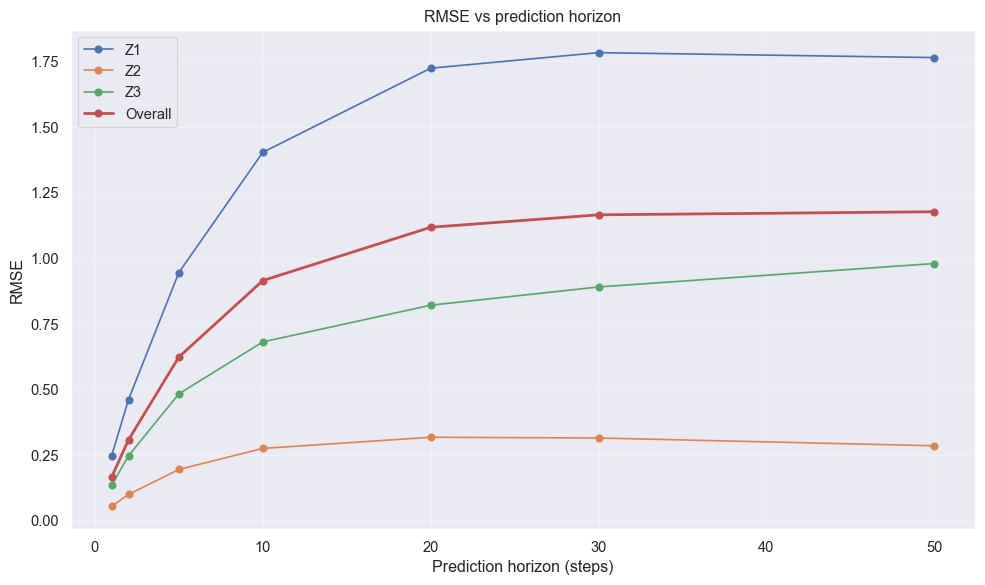

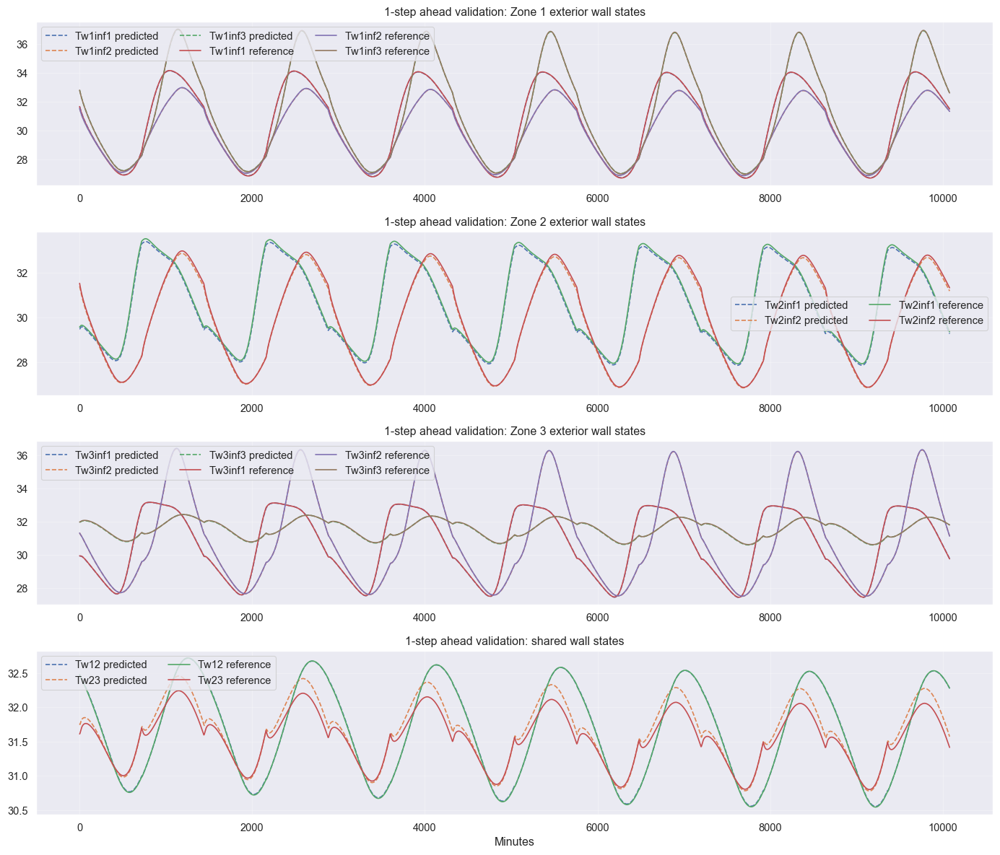

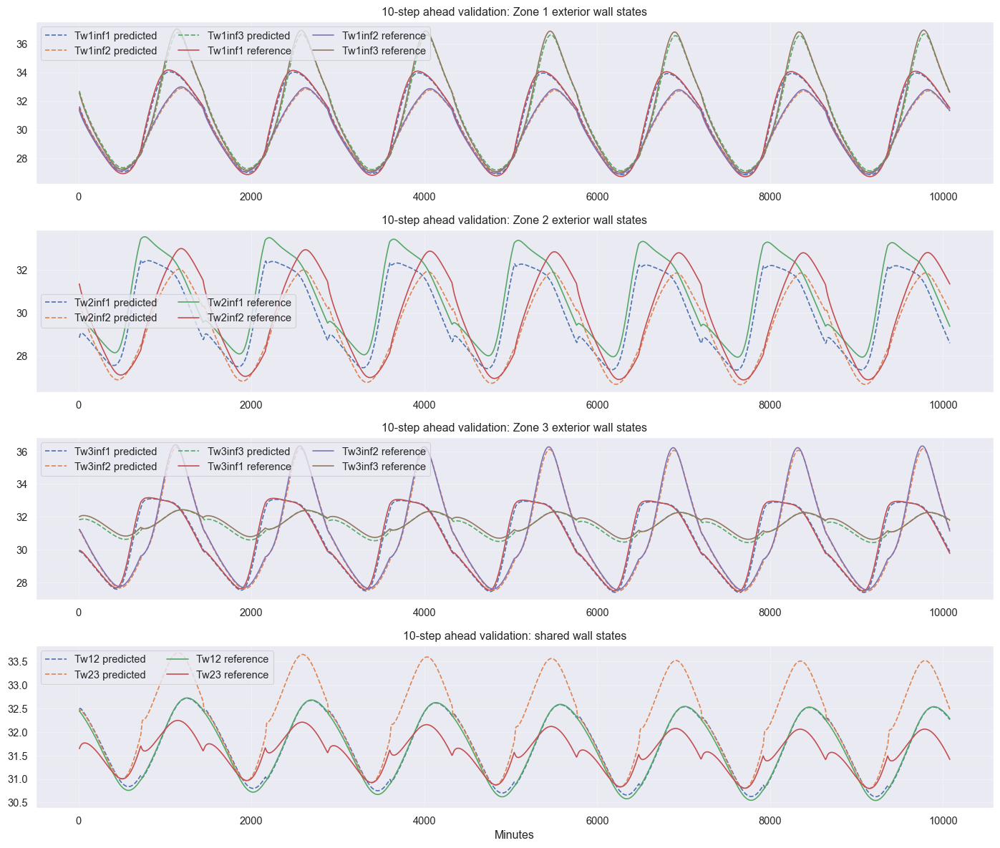

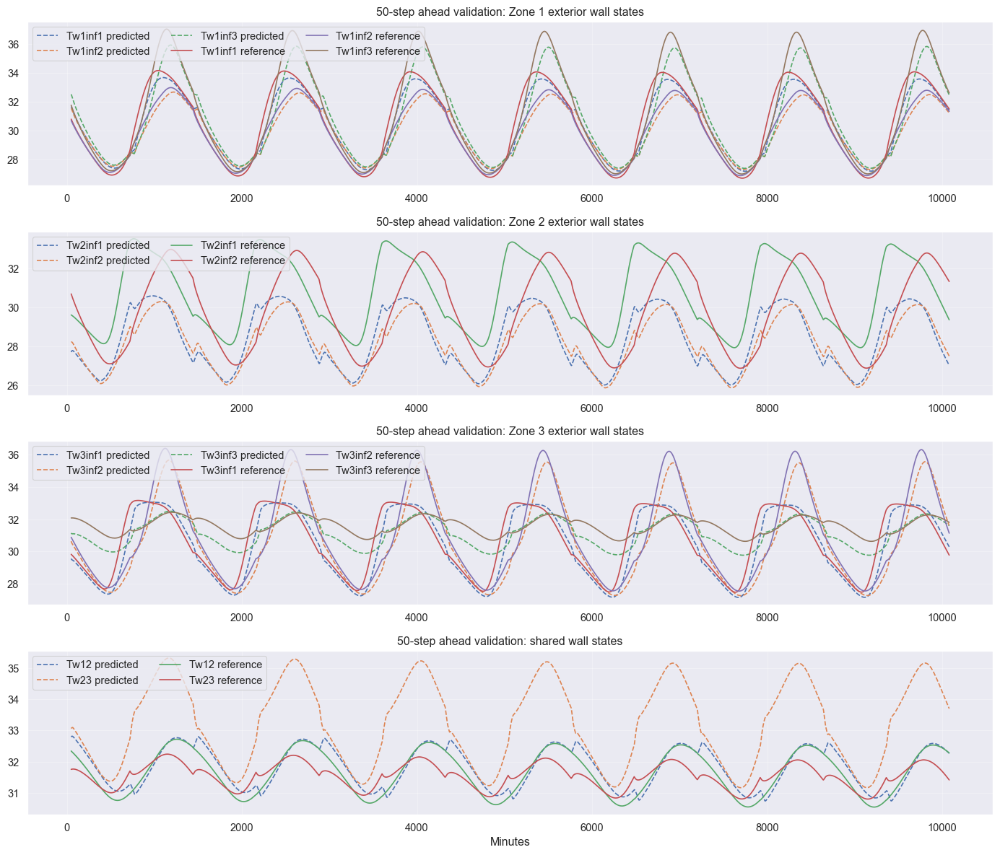

In [78]:
# ============================================================
# VALIDATION ONLY BLOCK
# - uses frozen theta_hat from UKF training above
# - propagates ONLY physical states (zones + walls)
# - parameters are FIXED constants during validation
# - provides:
#     1) pure open-loop validation
#     2) h-step-ahead validation for multiple horizons
#     3) RMSE tables/prints
#     4) zone plots for each horizon
#     5) RMSE-vs-horizon plot
# ============================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# ------------------------------------------------------------
# 0) Safety checks
# ------------------------------------------------------------
required_names = [
    "theta_hat", "idx_val", "t_val", "Ts",
    "Z1", "Z2", "Z3", "Tout", "U1", "U2", "U3", "S1", "S2", "S3",
    "Tw1inf1_ref", "Tw1inf2_ref", "Tw1inf3_ref",
    "Tw2inf1_ref", "Tw2inf2_ref",
    "Tw3inf1_ref", "Tw3inf2_ref", "Tw3inf3_ref",
    "Tw12_ref", "Tw23_ref"
]
for _nm in required_names:
    if _nm not in globals():
        raise NameError(f"Required variable '{_nm}' not found above this block.")

# ------------------------------------------------------------
# 1) Fixed parameter unpacking from theta_hat
# state order:
# [z1, z2, z3, tw1i1, tw1i2, tw1i3, tw2i1, tw2i2,
#  tw3i1, tw3i2, tw3i3, tw12, tw23]
# ------------------------------------------------------------
def unpack_theta_fixed(theta):
    theta = np.asarray(theta, dtype=float).copy()

    if len(theta) != 29:
        raise ValueError(f"theta_hat must have length 29, got {len(theta)}")

    (Cz1, Cz2, Cz3,
     Cw1i1, Cw1i2, Cw1i3,
     Cw2i1, Cw2i2,
     Cw3i1, Cw3i2, Cw3i3,
     Cw12, Cw23,
     Kz1w1, Kz1w2, Kz1w3,
     Kz2w1, Kz2w2,
     Kz3w1, Kz3w2, Kz3w3,
     Ka1, Ka2, Ka3,
     K12, K23,
     D1, D2, D3) = theta

    return {
        "Cz1": Cz1, "Cz2": Cz2, "Cz3": Cz3,
        "Cw1i1": Cw1i1, "Cw1i2": Cw1i2, "Cw1i3": Cw1i3,
        "Cw2i1": Cw2i1, "Cw2i2": Cw2i2,
        "Cw3i1": Cw3i1, "Cw3i2": Cw3i2, "Cw3i3": Cw3i3,
        "Cw12": Cw12, "Cw23": Cw23,
        "Kz1w1": Kz1w1, "Kz1w2": Kz1w2, "Kz1w3": Kz1w3,
        "Kz2w1": Kz2w1, "Kz2w2": Kz2w2,
        "Kz3w1": Kz3w1, "Kz3w2": Kz3w2, "Kz3w3": Kz3w3,
        "Ka1": Ka1, "Ka2": Ka2, "Ka3": Ka3,
        "K12": K12, "K23": K23,
        "D1": D1, "D2": D2, "D3": D3,
    }

theta_fixed = unpack_theta_fixed(theta_hat_augukf_zoneonly_trainfit)

print("\nFrozen parameters used in this validation block:")
for k, v in theta_fixed.items():
    print(f"{k} = {v:.6g}")

# ------------------------------------------------------------
# 2) Physical-state helpers only
# ------------------------------------------------------------
TEMP_MIN_LOCAL = globals().get("TEMP_MIN", -20.0)
TEMP_MAX_LOCAL = globals().get("TEMP_MAX", 80.0)

def project_phys_state(x):
    x = np.asarray(x, dtype=float).copy()
    x = np.nan_to_num(x, nan=0.0, posinf=TEMP_MAX_LOCAL, neginf=TEMP_MIN_LOCAL)
    x = np.clip(x, TEMP_MIN_LOCAL, TEMP_MAX_LOCAL)
    return x

def make_measured_phys_state(k):
    x_phys = np.array([
        Z1[k], Z2[k], Z3[k],
        Tw1inf1_ref[k], Tw1inf2_ref[k], Tw1inf3_ref[k],
        Tw2inf1_ref[k], Tw2inf2_ref[k],
        Tw3inf1_ref[k], Tw3inf2_ref[k], Tw3inf3_ref[k],
        Tw12_ref[k], Tw23_ref[k]
    ], dtype=float)
    return project_phys_state(x_phys)

def make_input_u(k):
    return np.array([Tout[k], U1[k], U2[k], U3[k], S1[k], S2[k], S3[k]], dtype=float)

def f_phys_cont(x_phys, u, theta):
    x_phys = project_phys_state(x_phys)

    z1, z2, z3 = x_phys[0], x_phys[1], x_phys[2]
    tw1i1, tw1i2, tw1i3 = x_phys[3], x_phys[4], x_phys[5]
    tw2i1, tw2i2 = x_phys[6], x_phys[7]
    tw3i1, tw3i2, tw3i3 = x_phys[8], x_phys[9], x_phys[10]
    tw12, tw23 = x_phys[11], x_phys[12]

    tout, u1, u2, u3, s1, s2, s3 = u

    B1 = 1.0
    B2 = 1.0
    B3 = 1.0

    dz1 = (
        theta["Kz1w1"] * (tw1i1 - z1) +
        theta["Kz1w2"] * (tw1i2 - z1) +
        theta["Kz1w3"] * (tw1i3 - z1) +
        theta["K12"]   * (tw12  - z1) +
        B1 * u1 +
        theta["D1"] * s1
    ) / theta["Cz1"]

    dz2 = (
        theta["Kz2w1"] * (tw2i1 - z2) +
        theta["Kz2w2"] * (tw2i2 - z2) +
        theta["K12"]   * (tw12  - z2) +
        theta["K23"]   * (tw23  - z2) +
        B2 * u2 +
        theta["D2"] * s2
    ) / theta["Cz2"]

    dz3 = (
        theta["Kz3w1"] * (tw3i1 - z3) +
        theta["Kz3w2"] * (tw3i2 - z3) +
        theta["Kz3w3"] * (tw3i3 - z3) +
        theta["K23"]   * (tw23  - z3) +
        B3 * u3 +
        theta["D3"] * s3
    ) / theta["Cz3"]

    dtw1i1 = (theta["Kz1w1"] * (z1 - tw1i1) + theta["Ka1"] * (tout - tw1i1)) / theta["Cw1i1"]
    dtw1i2 = (theta["Kz1w2"] * (z1 - tw1i2) + theta["Ka1"] * (tout - tw1i2)) / theta["Cw1i2"]
    dtw1i3 = (theta["Kz1w3"] * (z1 - tw1i3) + theta["Ka1"] * (tout - tw1i3)) / theta["Cw1i3"]

    dtw2i1 = (theta["Kz2w1"] * (z2 - tw2i1) + theta["Ka2"] * (tout - tw2i1)) / theta["Cw2i1"]
    dtw2i2 = (theta["Kz2w2"] * (z2 - tw2i2) + theta["Ka2"] * (tout - tw2i2)) / theta["Cw2i2"]

    dtw3i1 = (theta["Kz3w1"] * (z3 - tw3i1) + theta["Ka3"] * (tout - tw3i1)) / theta["Cw3i1"]
    dtw3i2 = (theta["Kz3w2"] * (z3 - tw3i2) + theta["Ka3"] * (tout - tw3i2)) / theta["Cw3i2"]
    dtw3i3 = (theta["Kz3w3"] * (z3 - tw3i3) + theta["Ka3"] * (tout - tw3i3)) / theta["Cw3i3"]

    dtw12 = (theta["K12"] * (z1 - tw12) + theta["K12"] * (z2 - tw12)) / theta["Cw12"]
    dtw23 = (theta["K23"] * (z2 - tw23) + theta["K23"] * (z3 - tw23)) / theta["Cw23"]

    dx = np.array([
        dz1, dz2, dz3,
        dtw1i1, dtw1i2, dtw1i3,
        dtw2i1, dtw2i2,
        dtw3i1, dtw3i2, dtw3i3,
        dtw12, dtw23
    ], dtype=float)

    dx = np.nan_to_num(dx, nan=0.0, posinf=1e3, neginf=-1e3)
    dx = np.clip(dx, -0.5, 0.5)
    return dx

def f_phys_disc(x_phys, u, Ts_local, theta, n_substeps=1):
    x = project_phys_state(x_phys)
    dt_sub = Ts_local / max(1, int(n_substeps))
    for _ in range(max(1, int(n_substeps))):
        dx = f_phys_cont(x, u, theta)
        x = x + dt_sub * dx
        x = project_phys_state(x)
    return x

def rmse_local(a, b):
    a = np.asarray(a, dtype=float)
    b = np.asarray(b, dtype=float)
    return np.sqrt(np.mean((a - b) ** 2))

# ------------------------------------------------------------
# 3) PURE OPEN-LOOP VALIDATION
# single initialization at first validation point,
# then free-run over whole validation horizon
# ------------------------------------------------------------
def simulate_open_loop_phys(idx, x0_phys, theta, n_substeps_pred=1):
    x = project_phys_state(x0_phys)
    X_hist = np.zeros((len(idx), 13))
    Yhat_hist = np.zeros((len(idx), 3))

    for j, k in enumerate(idx):
        u_k = make_input_u(k)
        x = f_phys_disc(x, u_k, Ts, theta, n_substeps=n_substeps_pred)
        X_hist[j] = x
        Yhat_hist[j] = x[:3]

    return X_hist, Yhat_hist

x0_val_phys = make_measured_phys_state(idx_val[0])

X_openloop_phys, Yhat_openloop_phys = simulate_open_loop_phys(
    idx=idx_val,
    x0_phys=x0_val_phys,
    theta=theta_fixed,
    n_substeps_pred=1
)

Ytrue_openloop = np.column_stack([Z1[idx_val], Z2[idx_val], Z3[idx_val]])

openloop_rmse_z1 = rmse_local(Ytrue_openloop[:, 0], Yhat_openloop_phys[:, 0])
openloop_rmse_z2 = rmse_local(Ytrue_openloop[:, 1], Yhat_openloop_phys[:, 1])
openloop_rmse_z3 = rmse_local(Ytrue_openloop[:, 2], Yhat_openloop_phys[:, 2])
openloop_rmse_overall = np.sqrt(np.mean((Ytrue_openloop - Yhat_openloop_phys) ** 2))

print("\n===== PURE OPEN-LOOP VALIDATION RMSE =====")
print(f"Z1 = {openloop_rmse_z1:.6f}")
print(f"Z2 = {openloop_rmse_z2:.6f}")
print(f"Z3 = {openloop_rmse_z3:.6f}")
print(f"Overall = {openloop_rmse_overall:.6f}")

plt.figure(figsize=(12, 8))

ax1 = plt.subplot(3, 1, 1)
ax1.plot(t_val, Z1[idx_val], label="Z1 measured")
ax1.plot(t_val, Yhat_openloop_phys[:, 0], "--", label="Z1 open-loop predicted")
ax1.set_title(f"Pure open-loop validation Z1 - RMSE: {openloop_rmse_z1:.3f}")
ax1.grid(True, alpha=0.3)
ax1.legend()

ax2 = plt.subplot(3, 1, 2, sharex=ax1)
ax2.plot(t_val, Z2[idx_val], label="Z2 measured")
ax2.plot(t_val, Yhat_openloop_phys[:, 1], "--", label="Z2 open-loop predicted")
ax2.set_title(f"Pure open-loop validation Z2 - RMSE: {openloop_rmse_z2:.3f}")
ax2.grid(True, alpha=0.3)
ax2.legend()

ax3 = plt.subplot(3, 1, 3, sharex=ax1)
ax3.plot(t_val, Z3[idx_val], label="Z3 measured")
ax3.plot(t_val, Yhat_openloop_phys[:, 2], "--", label="Z3 open-loop predicted")
ax3.set_title(f"Pure open-loop validation Z3 - RMSE: {openloop_rmse_z3:.3f}")
ax3.set_xlabel("Minutes")
ax3.grid(True, alpha=0.3)
ax3.legend()

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# 4) H-STEP-AHEAD VALIDATION
# measured physical state at k from dataframe,
# fixed theta thereafter, open-loop for h steps


# ------------------------------------------------------------
def simulate_h_step_ahead_phys(idx, horizon, theta, n_substeps_pred=1):
    n_steps = len(idx) - horizon
    if n_steps <= 0:
        raise ValueError(f"Horizon {horizon} is too large for idx_val length {len(idx)}")

    Xh = np.zeros((n_steps, 13))
    Yhat_h = np.zeros((n_steps, 3))
    Ytrue_h = np.zeros((n_steps, 3))
    t_h = t_val[horizon:]

    for j in range(n_steps):
        k0 = idx[j]
        x = make_measured_phys_state(k0)

        for m in range(horizon):
            kk = idx[j + m]
            u_kk = make_input_u(kk)
            x = f_phys_disc(x, u_kk, Ts, theta, n_substeps=n_substeps_pred)

        kt = idx[j + horizon]
        Xh[j] = x
        Yhat_h[j] = x[:3]
        Ytrue_h[j] = np.array([Z1[kt], Z2[kt], Z3[kt]], dtype=float)

    return Xh, Yhat_h, Ytrue_h, t_h

# horizons you want
horizons = [1, 2, 5, 10, 20, 30, 50]

horizon_results = {}

print("\n===== H-STEP-AHEAD VALIDATION RMSE =====")
for h in horizons:
    Xh, Yhat_h, Ytrue_h, t_h = simulate_h_step_ahead_phys(
        idx=idx_val,
        horizon=h,
        theta=theta_fixed,
        n_substeps_pred=1
    )

    rmse_z1 = rmse_local(Ytrue_h[:, 0], Yhat_h[:, 0])
    rmse_z2 = rmse_local(Ytrue_h[:, 1], Yhat_h[:, 1])
    rmse_z3 = rmse_local(Ytrue_h[:, 2], Yhat_h[:, 2])
    rmse_overall = np.sqrt(np.mean((Ytrue_h - Yhat_h) ** 2))

    horizon_results[h] = {
        "Xh": Xh,
        "Yhat": Yhat_h,
        "Ytrue": Ytrue_h,
        "t": t_h,
        "rmse_z1": rmse_z1,
        "rmse_z2": rmse_z2,
        "rmse_z3": rmse_z3,
        "rmse_overall": rmse_overall,
    }

    print(f"\n{h}-step ahead:")
    print(f"  Z1 = {rmse_z1:.6f}")
    print(f"  Z2 = {rmse_z2:.6f}")
    print(f"  Z3 = {rmse_z3:.6f}")
    print(f"  Overall = {rmse_overall:.6f}")

# ------------------------------------------------------------
# 5) RMSE summary table
# ------------------------------------------------------------
rmse_rows = []
for h in horizons:
    r = horizon_results[h]
    rmse_rows.append({
        "horizon_steps": h,
        "horizon_minutes": h * Ts / 60.0,
        "rmse_z1": r["rmse_z1"],
        "rmse_z2": r["rmse_z2"],
        "rmse_z3": r["rmse_z3"],
        "rmse_overall": r["rmse_overall"],
    })

rmse_horizon_df = pd.DataFrame(rmse_rows)
print("\nRMSE summary by horizon:")
print(rmse_horizon_df)

# ------------------------------------------------------------
# 6) zone plots for each horizon
# ------------------------------------------------------------
for h in horizons:
    r = horizon_results[h]
    Yhat_h = r["Yhat"]
    Ytrue_h = r["Ytrue"]
    t_h = r["t"]

    plt.figure(figsize=(12, 8))

    ax1 = plt.subplot(3, 1, 1)
    ax1.plot(t_h, Ytrue_h[:, 0], label=f"Z1 measured (k+{h})")
    ax1.plot(t_h, Yhat_h[:, 0], "--", label=f"Z1 predicted ({h}-step)")
    ax1.set_title(f"{h}-step ahead validation Z1 - RMSE: {r['rmse_z1']:.3f}")
    ax1.grid(True, alpha=0.3)
    ax1.legend()

    ax2 = plt.subplot(3, 1, 2, sharex=ax1)
    ax2.plot(t_h, Ytrue_h[:, 1], label=f"Z2 measured (k+{h})")
    ax2.plot(t_h, Yhat_h[:, 1], "--", label=f"Z2 predicted ({h}-step)")
    ax2.set_title(f"{h}-step ahead validation Z2 - RMSE: {r['rmse_z2']:.3f}")
    ax2.grid(True, alpha=0.3)
    ax2.legend()

    ax3 = plt.subplot(3, 1, 3, sharex=ax1)
    ax3.plot(t_h, Ytrue_h[:, 2], label=f"Z3 measured (k+{h})")
    ax3.plot(t_h, Yhat_h[:, 2], "--", label=f"Z3 predicted ({h}-step)")
    ax3.set_title(f"{h}-step ahead validation Z3 - RMSE: {r['rmse_z3']:.3f}")
    ax3.set_xlabel("Minutes")
    ax3.grid(True, alpha=0.3)
    ax3.legend()

    plt.tight_layout()
    plt.show()

# ------------------------------------------------------------
# 7) RMSE vs horizon plot
# ------------------------------------------------------------
plt.figure(figsize=(10, 6))
plt.plot(rmse_horizon_df["horizon_steps"], rmse_horizon_df["rmse_z1"], marker="o", label="Z1")
plt.plot(rmse_horizon_df["horizon_steps"], rmse_horizon_df["rmse_z2"], marker="o", label="Z2")
plt.plot(rmse_horizon_df["horizon_steps"], rmse_horizon_df["rmse_z3"], marker="o", label="Z3")
plt.plot(rmse_horizon_df["horizon_steps"], rmse_horizon_df["rmse_overall"], marker="o", linewidth=2, label="Overall")
plt.xlabel("Prediction horizon (steps)")
plt.ylabel("RMSE")
plt.title("RMSE vs prediction horizon")
plt.grid(True, alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# 8) Optional wall-state plots for selected horizons
# set to [] if you do not want wall plots
# ------------------------------------------------------------
wall_plot_horizons = [1, 10, 50]

for h in wall_plot_horizons:
    if h not in horizon_results:
        continue

    r = horizon_results[h]
    Xh = r["Xh"]
    t_h = r["t"]
    idx_target = idx_val[h:]

    plt.figure(figsize=(14, 12))

    ax1 = plt.subplot(4, 1, 1)
    ax1.plot(t_h, Xh[:, 3], "--", label="Tw1inf1 predicted")
    ax1.plot(t_h, Xh[:, 4], "--", label="Tw1inf2 predicted")
    ax1.plot(t_h, Xh[:, 5], "--", label="Tw1inf3 predicted")
    ax1.plot(t_h, Tw1inf1_ref[idx_target], label="Tw1inf1 reference")
    ax1.plot(t_h, Tw1inf2_ref[idx_target], label="Tw1inf2 reference")
    ax1.plot(t_h, Tw1inf3_ref[idx_target], label="Tw1inf3 reference")
    ax1.set_title(f"{h}-step ahead validation: Zone 1 exterior wall states")
    ax1.grid(True, alpha=0.3)
    ax1.legend(ncol=3)

    ax2 = plt.subplot(4, 1, 2, sharex=ax1)
    ax2.plot(t_h, Xh[:, 6], "--", label="Tw2inf1 predicted")
    ax2.plot(t_h, Xh[:, 7], "--", label="Tw2inf2 predicted")
    ax2.plot(t_h, Tw2inf1_ref[idx_target], label="Tw2inf1 reference")
    ax2.plot(t_h, Tw2inf2_ref[idx_target], label="Tw2inf2 reference")
    ax2.set_title(f"{h}-step ahead validation: Zone 2 exterior wall states")
    ax2.grid(True, alpha=0.3)
    ax2.legend(ncol=2)

    ax3 = plt.subplot(4, 1, 3, sharex=ax1)
    ax3.plot(t_h, Xh[:, 8], "--", label="Tw3inf1 predicted")
    ax3.plot(t_h, Xh[:, 9], "--", label="Tw3inf2 predicted")
    ax3.plot(t_h, Xh[:, 10], "--", label="Tw3inf3 predicted")
    ax3.plot(t_h, Tw3inf1_ref[idx_target], label="Tw3inf1 reference")
    ax3.plot(t_h, Tw3inf2_ref[idx_target], label="Tw3inf2 reference")
    ax3.plot(t_h, Tw3inf3_ref[idx_target], label="Tw3inf3 reference")
    ax3.set_title(f"{h}-step ahead validation: Zone 3 exterior wall states")
    ax3.grid(True, alpha=0.3)
    ax3.legend(ncol=3)

    ax4 = plt.subplot(4, 1, 4, sharex=ax1)
    ax4.plot(t_h, Xh[:, 11], "--", label="Tw12 predicted")
    ax4.plot(t_h, Xh[:, 12], "--", label="Tw23 predicted")
    ax4.plot(t_h, Tw12_ref[idx_target], label="Tw12 reference")
    ax4.plot(t_h, Tw23_ref[idx_target], label="Tw23 reference")
    ax4.set_title(f"{h}-step ahead validation: shared wall states")
    ax4.set_xlabel("Minutes")
    ax4.grid(True, alpha=0.3)
    ax4.legend(ncol=2)

    plt.tight_layout()
    plt.show()

# ------------------------------------------------------------
# 9) save outputs
# ------------------------------------------------------------
theta_fixed_validation_only_augukf_expanded_allstates_fast_recent = theta_fixed

X_openloop_phys_validation_only_augukf_expanded_allstates_fast_recent = X_openloop_phys
Yhat_openloop_phys_validation_only_augukf_expanded_allstates_fast_recent = Yhat_openloop_phys
Ytrue_openloop_validation_only_augukf_expanded_allstates_fast_recent = Ytrue_openloop

horizon_results_validation_only_augukf_expanded_allstates_fast_recent = horizon_results
rmse_horizon_df_validation_only_augukf_expanded_allstates_fast_recent = rmse_horizon_df

In [80]:
LSTM


NameError: name 'LSTM' is not defined

In [82]:
# ============================================================
# LSTM BASELINE TRAINING BLOCK
# - uses current variables already defined above
# - architecture copied from attached LSTM notebook:
#     2 x LSTM(128) -> Dense(32,relu) -> Dense(3)
# - trains on idx_train only
# - internal chronological 80/20 split for early stopping
# - reports one-step RMSE on full training block
# ============================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import tensorflow as tf
from tensorflow.keras import layers, models, callbacks

# ------------------------------------------------------------
# 0) reproducibility
# ------------------------------------------------------------
LSTM_SEED = 42
np.random.seed(LSTM_SEED)
tf.random.set_seed(LSTM_SEED)

# ------------------------------------------------------------
# 1) config
# ------------------------------------------------------------
SEQ_LEN = 60
LSTM_HIDDEN = 128
N_LSTM_LAYERS = 2
DENSE_HIDDEN = 32
LEARNING_RATE = 5e-4
BATCH_SIZE = 128
MAX_EPOCHS = 100
PATIENCE = 12

# ------------------------------------------------------------
# 2) feature matrix using SAME variables already in notebook
#    here we include wall measurements too
# ------------------------------------------------------------
FEATURE_NAMES_LSTM = [
    "Tout",
    "Z1", "Z2", "Z3",
    "U1", "U2", "U3",
    "S1", "S2", "S3",
    "Tw1inf1", "Tw1inf2", "Tw1inf3",
    "Tw2inf1", "Tw2inf2",
    "Tw3inf1", "Tw3inf2", "Tw3inf3",
    "Tw12", "Tw23",
]

TARGET_NAMES_LSTM = ["Z1", "Z2", "Z3"]

feature_matrix_lstm = np.column_stack([
    Tout,
    Z1, Z2, Z3,
    U1, U2, U3,
    S1, S2, S3,
    Tw1inf1_ref, Tw1inf2_ref, Tw1inf3_ref,
    Tw2inf1_ref, Tw2inf2_ref,
    Tw3inf1_ref, Tw3inf2_ref, Tw3inf3_ref,
    Tw12_ref, Tw23_ref
]).astype(np.float32)

target_matrix_lstm = np.column_stack([Z1, Z2, Z3]).astype(np.float32)

N_FEAT_LSTM = feature_matrix_lstm.shape[1]
TARGET_IDX_LSTM = np.array([FEATURE_NAMES_LSTM.index(c) for c in TARGET_NAMES_LSTM], dtype=int)

print("LSTM feature count =", N_FEAT_LSTM)
print("LSTM sequence length =", SEQ_LEN)

# ------------------------------------------------------------
# 3) helpers
# ------------------------------------------------------------
def make_contiguous_block(idx, X_full, Y_full):
    idx = np.asarray(idx, dtype=int)
    if len(idx) < 2:
        raise ValueError("idx must contain at least 2 time points")
    if not np.all(np.diff(idx) == 1):
        raise ValueError("idx_train must be contiguous for this LSTM block")
    return X_full[idx], Y_full[idx]

def standardize_fit(X_train_raw, Y_train_raw):
    x_mean = X_train_raw.mean(axis=0, keepdims=True)
    x_std = X_train_raw.std(axis=0, keepdims=True)
    x_std[x_std < 1e-8] = 1.0

    y_mean = Y_train_raw.mean(axis=0, keepdims=True)
    y_std = Y_train_raw.std(axis=0, keepdims=True)
    y_std[y_std < 1e-8] = 1.0

    return x_mean, x_std, y_mean, y_std

def standardize_apply(X_raw, Y_raw, x_mean, x_std, y_mean, y_std):
    Xs = (X_raw - x_mean) / x_std
    Ys = (Y_raw - y_mean) / y_std
    return Xs.astype(np.float32), Ys.astype(np.float32)

def inverse_targets(Ys, y_mean, y_std):
    return Ys * y_std + y_mean

def create_sequences(Xs, Ys, seq_len):
    X_seq, Y_seq = [], []
    for t in range(seq_len, len(Xs)):
        X_seq.append(Xs[t-seq_len:t])
        Y_seq.append(Ys[t])
    return np.asarray(X_seq, dtype=np.float32), np.asarray(Y_seq, dtype=np.float32)

def rmse_vec(y_true, y_pred):
    y_true = np.asarray(y_true, dtype=float)
    y_pred = np.asarray(y_pred, dtype=float)
    return np.sqrt(np.mean((y_true - y_pred) ** 2, axis=0))

def overall_rmse(y_true, y_pred):
    y_true = np.asarray(y_true, dtype=float)
    y_pred = np.asarray(y_pred, dtype=float)
    return float(np.sqrt(np.mean((y_true - y_pred) ** 2)))

def build_lstm_model(seq_len, n_feat):
    inp = layers.Input(shape=(seq_len, n_feat))
    x = inp
    for i in range(N_LSTM_LAYERS):
        x = layers.LSTM(
            LSTM_HIDDEN,
            return_sequences=(i < N_LSTM_LAYERS - 1)
        )(x)
    x = layers.Dense(DENSE_HIDDEN, activation="relu")(x)
    out = layers.Dense(3)(x)

    model = tf.keras.Model(inputs=inp, outputs=out)
    model.compile(
        optimizer=tf.keras.optimizers.Adam(learning_rate=LEARNING_RATE),
        loss="mse"
    )
    return model

# ------------------------------------------------------------
# 4) build training block from idx_train
# ------------------------------------------------------------
X_train_block_raw, Y_train_block_raw = make_contiguous_block(
    idx_train, feature_matrix_lstm, target_matrix_lstm
)

n_train_block = len(X_train_block_raw)
split_pt = int(0.8 * n_train_block)

if split_pt <= SEQ_LEN:
    raise ValueError("Training block too short for chosen SEQ_LEN")

# chronological split
X_subtrain_raw = X_train_block_raw[:split_pt]
Y_subtrain_raw = Y_train_block_raw[:split_pt]

# include history overlap for val sequences
X_subval_raw = X_train_block_raw[split_pt-SEQ_LEN:]
Y_subval_raw = Y_train_block_raw[split_pt-SEQ_LEN:]

# fit scaler on subtrain only
x_mean_lstm, x_std_lstm, y_mean_lstm, y_std_lstm = standardize_fit(
    X_subtrain_raw, Y_subtrain_raw
)

X_subtrain_s, Y_subtrain_s = standardize_apply(
    X_subtrain_raw, Y_subtrain_raw,
    x_mean_lstm, x_std_lstm, y_mean_lstm, y_std_lstm
)
X_subval_s, Y_subval_s = standardize_apply(
    X_subval_raw, Y_subval_raw,
    x_mean_lstm, x_std_lstm, y_mean_lstm, y_std_lstm
)

Xtr_seq, Ytr_seq = create_sequences(X_subtrain_s, Y_subtrain_s, SEQ_LEN)
Xva_seq, Yva_seq = create_sequences(X_subval_s, Y_subval_s, SEQ_LEN)

print("Xtr_seq shape =", Xtr_seq.shape)
print("Ytr_seq shape =", Ytr_seq.shape)
print("Xva_seq shape =", Xva_seq.shape)
print("Yva_seq shape =", Yva_seq.shape)

# ------------------------------------------------------------
# 5) train model
# ------------------------------------------------------------
lstm_model_compare = build_lstm_model(SEQ_LEN, N_FEAT_LSTM)
print(lstm_model_compare.summary())

cbs = [
    callbacks.EarlyStopping(
        monitor="val_loss",
        patience=PATIENCE,
        restore_best_weights=True,
        verbose=1
    )
]

history_lstm_compare = lstm_model_compare.fit(
    Xtr_seq, Ytr_seq,
    validation_data=(Xva_seq, Yva_seq),
    epochs=MAX_EPOCHS,
    batch_size=BATCH_SIZE,
    callbacks=cbs,
    verbose=1
)

# ------------------------------------------------------------
# 6) one-step prediction on FULL training block
#    uses measured sequences, no autoregressive rollout yet
# ------------------------------------------------------------
X_train_block_s, Y_train_block_s = standardize_apply(
    X_train_block_raw, Y_train_block_raw,
    x_mean_lstm, x_std_lstm, y_mean_lstm, y_std_lstm
)

Xtrain_full_seq, Ytrain_full_seq = create_sequences(X_train_block_s, Y_train_block_s, SEQ_LEN)

Ytrain_pred_s = lstm_model_compare.predict(Xtrain_full_seq, batch_size=BATCH_SIZE, verbose=0)

Ytrain_true = inverse_targets(Ytrain_full_seq, y_mean_lstm, y_std_lstm)
Ytrain_pred = inverse_targets(Ytrain_pred_s, y_mean_lstm, y_std_lstm)

train_rmse_lstm_by_zone = rmse_vec(Ytrain_true, Ytrain_pred)
train_rmse_lstm_overall = overall_rmse(Ytrain_true, Ytrain_pred)

print("\nLSTM training-period one-step RMSE:")
print(f"Z1 = {train_rmse_lstm_by_zone[0]:.6f}")
print(f"Z2 = {train_rmse_lstm_by_zone[1]:.6f}")
print(f"Z3 = {train_rmse_lstm_by_zone[2]:.6f}")
print(f"Overall = {train_rmse_lstm_overall:.6f}")

# align time axis to sequence outputs
t_train_lstm = t_train[SEQ_LEN:]

# ------------------------------------------------------------
# 7) loss curves
# ------------------------------------------------------------
plt.figure(figsize=(8, 5))
plt.plot(history_lstm_compare.history["loss"], label="Train loss")
plt.plot(history_lstm_compare.history["val_loss"], label="Val loss")
plt.xlabel("Epoch")
plt.ylabel("MSE loss")
plt.title("LSTM training history")
plt.grid(True, alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# 8) training-period one-step plots
# ------------------------------------------------------------
plt.figure(figsize=(12, 8))

ax1 = plt.subplot(3, 1, 1)
ax1.plot(t_train_lstm, Ytrain_true[:, 0], label="Z1 measured")
ax1.plot(t_train_lstm, Ytrain_pred[:, 0], "--", label="Z1 LSTM one-step")
ax1.set_title(f"LSTM training-period one-step fit Z1 - RMSE: {train_rmse_lstm_by_zone[0]:.3f}")
ax1.grid(True, alpha=0.3)
ax1.legend()

ax2 = plt.subplot(3, 1, 2, sharex=ax1)
ax2.plot(t_train_lstm, Ytrain_true[:, 1], label="Z2 measured")
ax2.plot(t_train_lstm, Ytrain_pred[:, 1], "--", label="Z2 LSTM one-step")
ax2.set_title(f"LSTM training-period one-step fit Z2 - RMSE: {train_rmse_lstm_by_zone[1]:.3f}")
ax2.grid(True, alpha=0.3)
ax2.legend()

ax3 = plt.subplot(3, 1, 3, sharex=ax1)
ax3.plot(t_train_lstm, Ytrain_true[:, 2], label="Z3 measured")
ax3.plot(t_train_lstm, Ytrain_pred[:, 2], "--", label="Z3 LSTM one-step")
ax3.set_title(f"LSTM training-period one-step fit Z3 - RMSE: {train_rmse_lstm_by_zone[2]:.3f}")
ax3.set_xlabel("Minutes")
ax3.grid(True, alpha=0.3)
ax3.legend()

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# 9) RMSE bar plot
# ------------------------------------------------------------
rmse_names_lstm = ["Z1", "Z2", "Z3", "Overall"]
rmse_vals_lstm = [
    float(train_rmse_lstm_by_zone[0]),
    float(train_rmse_lstm_by_zone[1]),
    float(train_rmse_lstm_by_zone[2]),
    float(train_rmse_lstm_overall),
]

plt.figure(figsize=(8, 5))
bars = plt.bar(rmse_names_lstm, rmse_vals_lstm)
plt.ylabel("RMSE")
plt.title("LSTM training-period one-step RMSE")
plt.grid(True, axis="y", alpha=0.3)

for bar, val in zip(bars, rmse_vals_lstm):
    plt.text(
        bar.get_x() + bar.get_width() / 2,
        bar.get_height(),
        f"{val:.3f}",
        ha="center",
        va="bottom"
    )

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# 10) save outputs
# ------------------------------------------------------------
lstm_model_compare_trainfit = lstm_model_compare
history_lstm_compare_trainfit = history_lstm_compare.history

x_mean_lstm_compare = x_mean_lstm
x_std_lstm_compare = x_std_lstm
y_mean_lstm_compare = y_mean_lstm
y_std_lstm_compare = y_std_lstm

Xtrain_full_seq_lstm_compare = Xtrain_full_seq
Ytrain_true_lstm_compare = Ytrain_true
Ytrain_pred_lstm_compare = Ytrain_pred
t_train_lstm_compare = t_train_lstm

train_rmse_lstm_by_zone_compare = train_rmse_lstm_by_zone
train_rmse_lstm_overall_compare = train_rmse_lstm_overall
feature_names_lstm_compare = FEATURE_NAMES_LSTM

LSTM feature count = 20
LSTM sequence length = 60
Xtr_seq shape = (16068, 60, 20)
Ytr_seq shape = (16068, 3)
Xva_seq shape = (4032, 60, 20)
Yva_seq shape = (4032, 3)


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 60, 20)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm (LSTM)                     │ (None, 60, 128)        │        76,288 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_1 (LSTM)                   │ (None, 128)            │       131,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 32)             │         4,128 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 3)              │            99 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 212,099 (828.51 KB)

 Trainable params: 212,099 (828.51 KB)

 Non-trainable params: 0 (0.00 B)

None
Epoch 1/100
126/126 ━━━━━━━━━━━━━━━━━━━━ 113s 751ms/step - loss: 0.1961 - val_loss: 0.0015
Epoch 2/100
126/126 ━━━━━━━━━━━━━━━━━━━━ 77s 605ms/step - loss: 0.0014 - val_loss: 0.0010
Epoch 3/100
126/126 ━━━━━━━━━━━━━━━━━━━━ 131s 1s/step - loss: 7.2469e-04 - val_loss: 7.1469e-04
Epoch 4/100
126/126 ━━━━━━━━━━━━━━━━━━━━ 50s 378ms/step - loss: 5.4059e-04 - val_loss: 5.3602e-04
Epoch 5/100
126/126 ━━━━━━━━━━━━━━━━━━━━ 49s 392ms/step - loss: 4.2722e-04 - val_loss: 5.4017e-04
Epoch 6/100
126/126 ━━━━━━━━━━━━━━━━━━━━ 95s 752ms/step - loss: 3.4981e-04 - val_loss: 4.8103e-04
Epoch 7/100
126/126 ━━━━━━━━━━━━━━━━━━━━ 76s 603ms/step - loss: 3.1352e-04 - val_loss: 5.1277e-04
Epoch 8/100
126/126 ━━━━━━━━━━━━━━━━━━━━ 40s 316ms/step - loss: 2.8667e-04 - val_loss: 4.9131e-04
Epoch 9/100
126/126 ━━━━━━━━━━━━━━━━━━━━ 0s 522ms/step - loss: 2.5492e-04

KeyboardInterrupt: 

LSTM Option A feature count = 7
LSTM Option A seq_len = 60
Xtr_seq_a shape = (16068, 60, 7)
Ytr_seq_a shape = (16068, 3)
Xva_seq_a shape = (4032, 60, 7)
Yva_seq_a shape = (4032, 3)


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 60, 7)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_2 (LSTM)                   │ (None, 60, 128)        │        69,632 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_3 (LSTM)                   │ (None, 128)            │       131,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 32)             │         4,128 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 3)              │            99 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 205,443 (802.51 KB)

 Trainable params: 205,443 (802.51 KB)

 Non-trainable params: 0 (0.00 B)

None
Epoch 1/100
126/126 ━━━━━━━━━━━━━━━━━━━━ 78s 535ms/step - loss: 0.2940 - val_loss: 0.0089
Epoch 2/100
126/126 ━━━━━━━━━━━━━━━━━━━━ 76s 486ms/step - loss: 0.0210 - val_loss: 0.0132
Epoch 3/100
126/126 ━━━━━━━━━━━━━━━━━━━━ 64s 345ms/step - loss: 0.0151 - val_loss: 0.0066
Epoch 4/100
126/126 ━━━━━━━━━━━━━━━━━━━━ 76s 299ms/step - loss: 0.0127 - val_loss: 0.0044
Epoch 5/100
126/126 ━━━━━━━━━━━━━━━━━━━━ 41s 300ms/step - loss: 0.0110 - val_loss: 0.0040
Epoch 6/100
126/126 ━━━━━━━━━━━━━━━━━━━━ 45s 360ms/step - loss: 0.0097 - val_loss: 0.0040
Epoch 7/100
126/126 ━━━━━━━━━━━━━━━━━━━━ 44s 353ms/step - loss: 0.0091 - val_loss: 0.0045
Epoch 8/100
126/126 ━━━━━━━━━━━━━━━━━━━━ 44s 348ms/step - loss: 0.0087 - val_loss: 0.0048
Epoch 9/100
126/126 ━━━━━━━━━━━━━━━━━━━━ 45s 360ms/step - loss: 0.0083 - val_loss: 0.0051
Epoch 10/100
126/126 ━━━━━━━━━━━━━━━━━━━━ 43s 337ms/step - loss: 0.0081 - val_loss: 0.0056
Epoch 11/100
126/126 ━━━━━━━━━━━━━━━━━━━━ 77s 300ms/step - loss: 0.0082 - val_loss: 0.0055
Epo

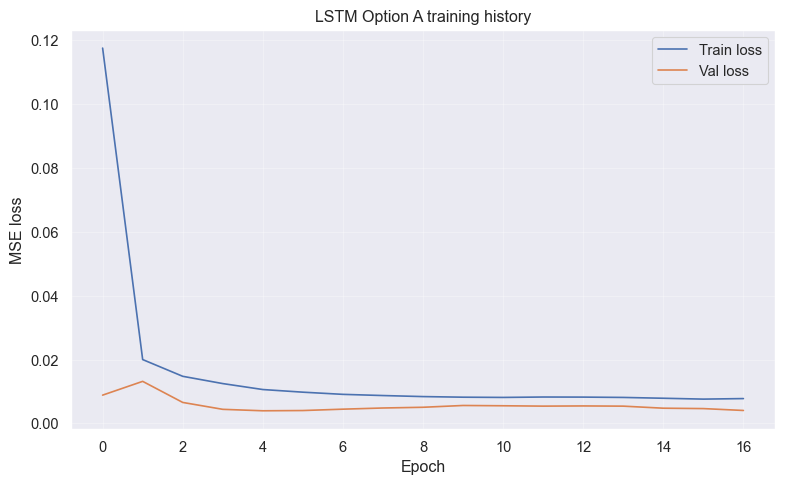

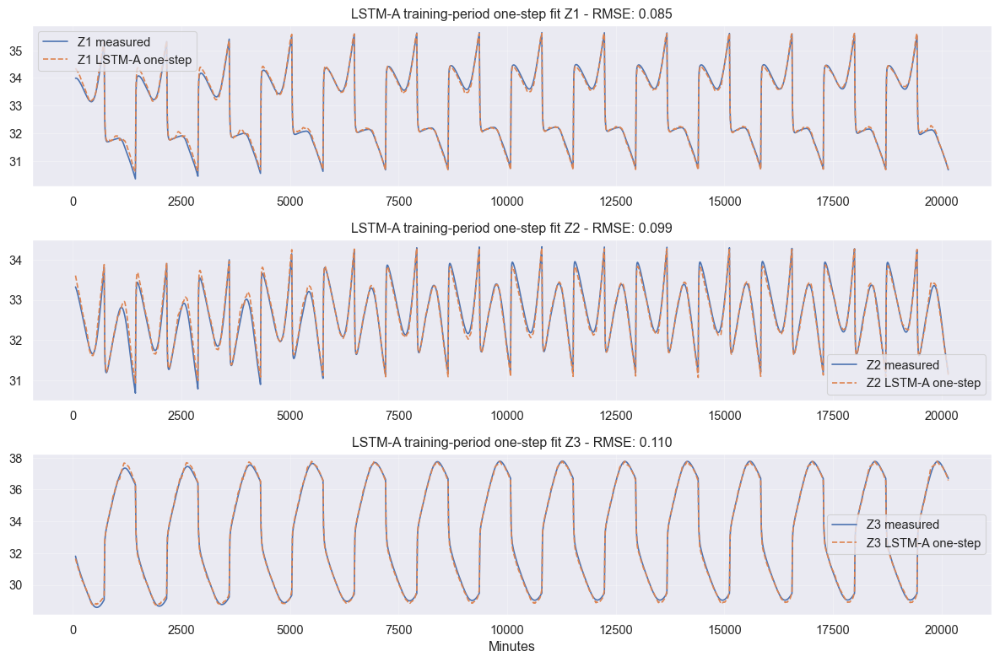

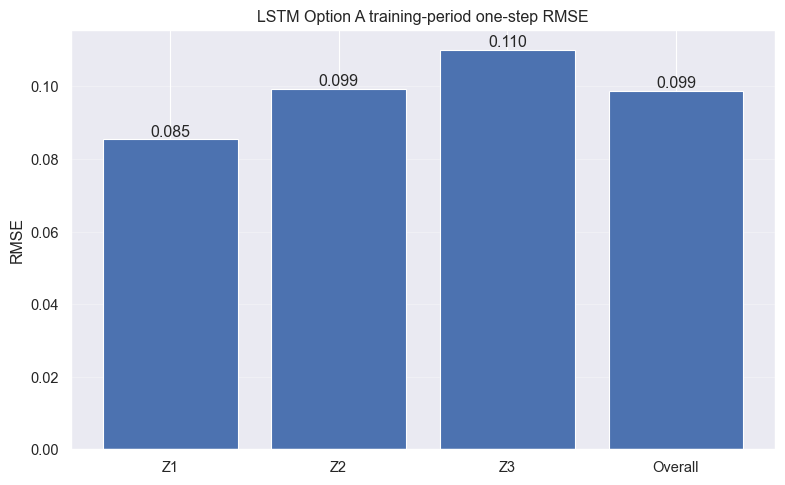

In [84]:
# ============================================================
# LSTM OPTION A: EXOGENOUS-ONLY TRAINING BLOCK
# fairer comparison to open-loop physics model
# inputs = [Tout, U1, U2, U3, S1, S2, S3]
# targets = [Z1, Z2, Z3]
# predicts one-step ahead on training period
# ============================================================

import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras import layers, models, callbacks

# ------------------------------------------------------------
# 0) reproducibility
# ------------------------------------------------------------
LSTM_SEED = 42
np.random.seed(LSTM_SEED)
tf.random.set_seed(LSTM_SEED)

# ------------------------------------------------------------
# 1) config
# ------------------------------------------------------------
SEQ_LEN = 60
LSTM_HIDDEN = 128
N_LSTM_LAYERS = 2
DENSE_HIDDEN = 32
LEARNING_RATE = 5e-4
BATCH_SIZE = 128
MAX_EPOCHS = 100
PATIENCE = 12

# ------------------------------------------------------------
# 2) use SAME variables already defined above
# only exogenous inputs for Option A
# ------------------------------------------------------------
FEATURE_NAMES_LSTM_A = [
    "Tout",
    "U1", "U2", "U3",
    "S1", "S2", "S3",
]

TARGET_NAMES_LSTM_A = ["Z1", "Z2", "Z3"]

X_full_lstm_a = np.column_stack([
    Tout,
    U1, U2, U3,
    S1, S2, S3,
]).astype(np.float32)

Y_full_lstm_a = np.column_stack([
    Z1, Z2, Z3
]).astype(np.float32)

N_FEAT_LSTM_A = X_full_lstm_a.shape[1]

print("LSTM Option A feature count =", N_FEAT_LSTM_A)
print("LSTM Option A seq_len =", SEQ_LEN)

# ------------------------------------------------------------
# 3) helpers
# ------------------------------------------------------------
def make_contiguous_block(idx, X_full, Y_full):
    idx = np.asarray(idx, dtype=int)
    if len(idx) < 2:
        raise ValueError("idx must contain at least 2 time points")
    if not np.all(np.diff(idx) == 1):
        raise ValueError("idx_train must be contiguous for this LSTM block")
    return X_full[idx], Y_full[idx]

def standardize_fit(X_train_raw, Y_train_raw):
    x_mean = X_train_raw.mean(axis=0, keepdims=True)
    x_std = X_train_raw.std(axis=0, keepdims=True)
    x_std[x_std < 1e-8] = 1.0

    y_mean = Y_train_raw.mean(axis=0, keepdims=True)
    y_std = Y_train_raw.std(axis=0, keepdims=True)
    y_std[y_std < 1e-8] = 1.0

    return x_mean, x_std, y_mean, y_std

def standardize_apply(X_raw, Y_raw, x_mean, x_std, y_mean, y_std):
    Xs = (X_raw - x_mean) / x_std
    Ys = (Y_raw - y_mean) / y_std
    return Xs.astype(np.float32), Ys.astype(np.float32)

def inverse_targets(Ys, y_mean, y_std):
    return Ys * y_std + y_mean

def create_sequences(Xs, Ys, seq_len):
    X_seq, Y_seq = [], []
    for t in range(seq_len, len(Xs)):
        X_seq.append(Xs[t-seq_len:t])
        Y_seq.append(Ys[t])
    return np.asarray(X_seq, dtype=np.float32), np.asarray(Y_seq, dtype=np.float32)

def rmse_vec(y_true, y_pred):
    y_true = np.asarray(y_true, dtype=float)
    y_pred = np.asarray(y_pred, dtype=float)
    return np.sqrt(np.mean((y_true - y_pred) ** 2, axis=0))

def overall_rmse(y_true, y_pred):
    y_true = np.asarray(y_true, dtype=float)
    y_pred = np.asarray(y_pred, dtype=float)
    return float(np.sqrt(np.mean((y_true - y_pred) ** 2)))

def build_lstm_model_option_a(seq_len, n_feat):
    inp = layers.Input(shape=(seq_len, n_feat))
    x = inp

    for i in range(N_LSTM_LAYERS):
        x = layers.LSTM(
            LSTM_HIDDEN,
            return_sequences=(i < N_LSTM_LAYERS - 1)
        )(x)

    x = layers.Dense(DENSE_HIDDEN, activation="relu")(x)
    out = layers.Dense(3)(x)

    model = tf.keras.Model(inputs=inp, outputs=out)
    model.compile(
        optimizer=tf.keras.optimizers.Adam(learning_rate=LEARNING_RATE),
        loss="mse"
    )
    return model

# ------------------------------------------------------------
# 4) build training block from idx_train
# chronological split inside idx_train
# ------------------------------------------------------------
X_train_block_raw, Y_train_block_raw = make_contiguous_block(
    idx_train, X_full_lstm_a, Y_full_lstm_a
)

n_train_block = len(X_train_block_raw)
split_pt = int(0.8 * n_train_block)

if split_pt <= SEQ_LEN:
    raise ValueError("Training block too short for chosen SEQ_LEN")

X_subtrain_raw = X_train_block_raw[:split_pt]
Y_subtrain_raw = Y_train_block_raw[:split_pt]

# keep overlap for val sequences
X_subval_raw = X_train_block_raw[split_pt-SEQ_LEN:]
Y_subval_raw = Y_train_block_raw[split_pt-SEQ_LEN:]

x_mean_lstm_a, x_std_lstm_a, y_mean_lstm_a, y_std_lstm_a = standardize_fit(
    X_subtrain_raw, Y_subtrain_raw
)

X_subtrain_s, Y_subtrain_s = standardize_apply(
    X_subtrain_raw, Y_subtrain_raw,
    x_mean_lstm_a, x_std_lstm_a, y_mean_lstm_a, y_std_lstm_a
)

X_subval_s, Y_subval_s = standardize_apply(
    X_subval_raw, Y_subval_raw,
    x_mean_lstm_a, x_std_lstm_a, y_mean_lstm_a, y_std_lstm_a
)

Xtr_seq_a, Ytr_seq_a = create_sequences(X_subtrain_s, Y_subtrain_s, SEQ_LEN)
Xva_seq_a, Yva_seq_a = create_sequences(X_subval_s, Y_subval_s, SEQ_LEN)

print("Xtr_seq_a shape =", Xtr_seq_a.shape)
print("Ytr_seq_a shape =", Ytr_seq_a.shape)
print("Xva_seq_a shape =", Xva_seq_a.shape)
print("Yva_seq_a shape =", Yva_seq_a.shape)

# ------------------------------------------------------------
# 5) build + train model
# ------------------------------------------------------------
lstm_model_option_a = build_lstm_model_option_a(SEQ_LEN, N_FEAT_LSTM_A)
print(lstm_model_option_a.summary())

cbs_a = [
    callbacks.EarlyStopping(
        monitor="val_loss",
        patience=PATIENCE,
        restore_best_weights=True,
        verbose=1
    )
]

history_lstm_option_a = lstm_model_option_a.fit(
    Xtr_seq_a, Ytr_seq_a,
    validation_data=(Xva_seq_a, Yva_seq_a),
    epochs=MAX_EPOCHS,
    batch_size=BATCH_SIZE,
    callbacks=cbs_a,
    verbose=1
)

# ------------------------------------------------------------
# 6) one-step prediction on FULL training block
# uses measured exogenous history only
# ------------------------------------------------------------
X_train_block_s_a, Y_train_block_s_a = standardize_apply(
    X_train_block_raw, Y_train_block_raw,
    x_mean_lstm_a, x_std_lstm_a, y_mean_lstm_a, y_std_lstm_a
)

Xtrain_full_seq_a, Ytrain_full_seq_a = create_sequences(
    X_train_block_s_a, Y_train_block_s_a, SEQ_LEN
)

Ytrain_pred_s_a = lstm_model_option_a.predict(
    Xtrain_full_seq_a,
    batch_size=BATCH_SIZE,
    verbose=0
)

Ytrain_true_a = inverse_targets(Ytrain_full_seq_a, y_mean_lstm_a, y_std_lstm_a)
Ytrain_pred_a = inverse_targets(Ytrain_pred_s_a, y_mean_lstm_a, y_std_lstm_a)

train_rmse_lstm_a_by_zone = rmse_vec(Ytrain_true_a, Ytrain_pred_a)
train_rmse_lstm_a_overall = overall_rmse(Ytrain_true_a, Ytrain_pred_a)

print("\nLSTM Option A training-period one-step RMSE:")
print(f"Z1 = {train_rmse_lstm_a_by_zone[0]:.6f}")
print(f"Z2 = {train_rmse_lstm_a_by_zone[1]:.6f}")
print(f"Z3 = {train_rmse_lstm_a_by_zone[2]:.6f}")
print(f"Overall = {train_rmse_lstm_a_overall:.6f}")

t_train_lstm_a = t_train[SEQ_LEN:]

# ------------------------------------------------------------
# 7) training history plot
# ------------------------------------------------------------
plt.figure(figsize=(8, 5))
plt.plot(history_lstm_option_a.history["loss"], label="Train loss")
plt.plot(history_lstm_option_a.history["val_loss"], label="Val loss")
plt.xlabel("Epoch")
plt.ylabel("MSE loss")
plt.title("LSTM Option A training history")
plt.grid(True, alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# 8) training-period one-step plots
# ------------------------------------------------------------
plt.figure(figsize=(12, 8))

ax1 = plt.subplot(3, 1, 1)
ax1.plot(t_train_lstm_a, Ytrain_true_a[:, 0], label="Z1 measured")
ax1.plot(t_train_lstm_a, Ytrain_pred_a[:, 0], "--", label="Z1 LSTM-A one-step")
ax1.set_title(f"LSTM-A training-period one-step fit Z1 - RMSE: {train_rmse_lstm_a_by_zone[0]:.3f}")
ax1.grid(True, alpha=0.3)
ax1.legend()

ax2 = plt.subplot(3, 1, 2, sharex=ax1)
ax2.plot(t_train_lstm_a, Ytrain_true_a[:, 1], label="Z2 measured")
ax2.plot(t_train_lstm_a, Ytrain_pred_a[:, 1], "--", label="Z2 LSTM-A one-step")
ax2.set_title(f"LSTM-A training-period one-step fit Z2 - RMSE: {train_rmse_lstm_a_by_zone[1]:.3f}")
ax2.grid(True, alpha=0.3)
ax2.legend()

ax3 = plt.subplot(3, 1, 3, sharex=ax1)
ax3.plot(t_train_lstm_a, Ytrain_true_a[:, 2], label="Z3 measured")
ax3.plot(t_train_lstm_a, Ytrain_pred_a[:, 2], "--", label="Z3 LSTM-A one-step")
ax3.set_title(f"LSTM-A training-period one-step fit Z3 - RMSE: {train_rmse_lstm_a_by_zone[2]:.3f}")
ax3.set_xlabel("Minutes")
ax3.grid(True, alpha=0.3)
ax3.legend()

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# 9) RMSE bar plot
# ------------------------------------------------------------
rmse_names_lstm_a = ["Z1", "Z2", "Z3", "Overall"]
rmse_vals_lstm_a = [
    float(train_rmse_lstm_a_by_zone[0]),
    float(train_rmse_lstm_a_by_zone[1]),
    float(train_rmse_lstm_a_by_zone[2]),
    float(train_rmse_lstm_a_overall),
]

plt.figure(figsize=(8, 5))
bars = plt.bar(rmse_names_lstm_a, rmse_vals_lstm_a)
plt.ylabel("RMSE")
plt.title("LSTM Option A training-period one-step RMSE")
plt.grid(True, axis="y", alpha=0.3)

for bar, val in zip(bars, rmse_vals_lstm_a):
    plt.text(
        bar.get_x() + bar.get_width() / 2,
        bar.get_height(),
        f"{val:.3f}",
        ha="center",
        va="bottom"
    )

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# 10) save outputs
# ------------------------------------------------------------
lstm_model_option_a_compare = lstm_model_option_a
history_lstm_option_a_compare = history_lstm_option_a.history

x_mean_lstm_option_a_compare = x_mean_lstm_a
x_std_lstm_option_a_compare = x_std_lstm_a
y_mean_lstm_option_a_compare = y_mean_lstm_a
y_std_lstm_option_a_compare = y_std_lstm_a

Xtrain_full_seq_lstm_option_a_compare = Xtrain_full_seq_a
Ytrain_true_lstm_option_a_compare = Ytrain_true_a
Ytrain_pred_lstm_option_a_compare = Ytrain_pred_a
t_train_lstm_option_a_compare = t_train_lstm_a

train_rmse_lstm_option_a_by_zone_compare = train_rmse_lstm_a_by_zone
train_rmse_lstm_option_a_overall_compare = train_rmse_lstm_a_overall
feature_names_lstm_option_a_compare = FEATURE_NAMES_LSTM_A

Xval_full_seq_a shape = (10020, 60, 7)
Yval_full_seq_a shape = (10020, 3)

LSTM Option A validation RMSE:
Z1 = 0.141278
Z2 = 0.097461
Z3 = 0.115746
Overall = 0.119520


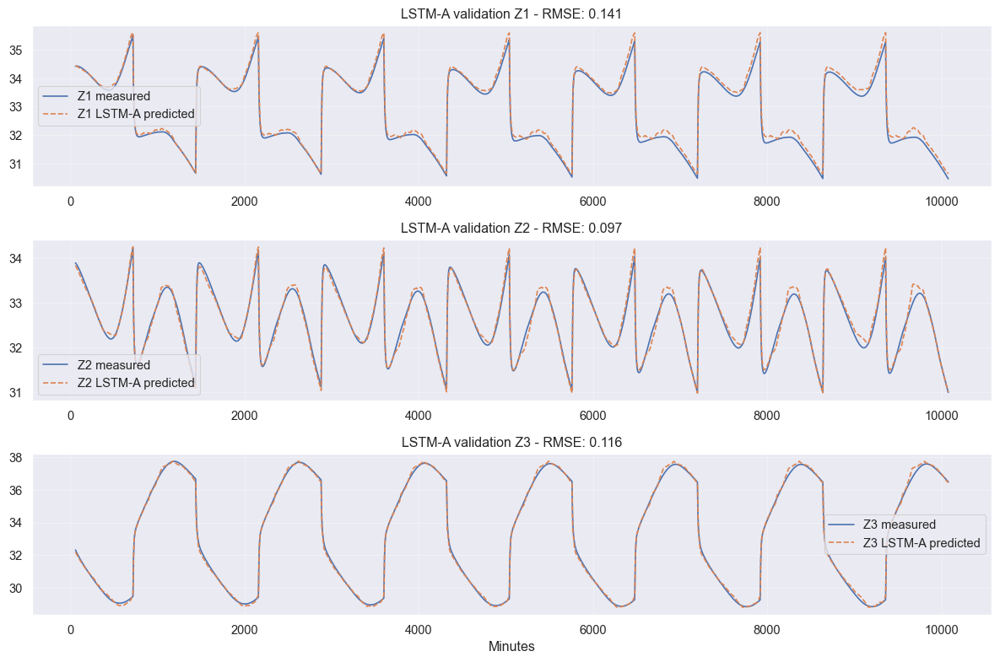

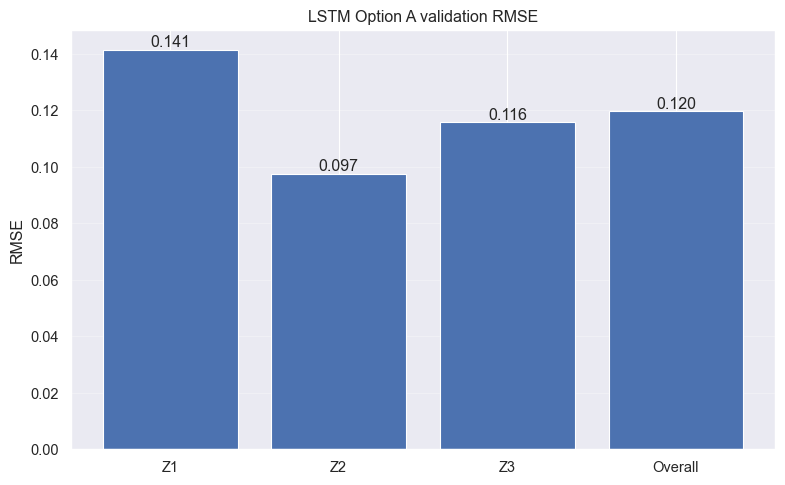


LSTM Option A train vs validation RMSE:
Train overall = 0.098791
Val   overall = 0.119520


In [86]:
# ============================================================
# LSTM OPTION A VALIDATION BLOCK
# uses trained exogenous-only LSTM from above
# predicts on idx_val and plots/prints RMSE
# ============================================================

# ------------------------------------------------------------
# 11) build validation block from idx_val
# ------------------------------------------------------------
X_val_block_raw, Y_val_block_raw = make_contiguous_block(
    idx_val, X_full_lstm_a, Y_full_lstm_a
)

# standardize using TRAIN scalers from above
X_val_block_s_a, Y_val_block_s_a = standardize_apply(
    X_val_block_raw, Y_val_block_raw,
    x_mean_lstm_a, x_std_lstm_a, y_mean_lstm_a, y_std_lstm_a
)

Xval_full_seq_a, Yval_full_seq_a = create_sequences(
    X_val_block_s_a, Y_val_block_s_a, SEQ_LEN
)

print("Xval_full_seq_a shape =", Xval_full_seq_a.shape)
print("Yval_full_seq_a shape =", Yval_full_seq_a.shape)

# ------------------------------------------------------------
# 12) validation prediction
# ------------------------------------------------------------
Yval_pred_s_a = lstm_model_option_a.predict(
    Xval_full_seq_a,
    batch_size=BATCH_SIZE,
    verbose=0
)

Yval_true_a = inverse_targets(Yval_full_seq_a, y_mean_lstm_a, y_std_lstm_a)
Yval_pred_a = inverse_targets(Yval_pred_s_a, y_mean_lstm_a, y_std_lstm_a)

# ------------------------------------------------------------
# 13) validation RMSE
# ------------------------------------------------------------
val_rmse_lstm_a_by_zone = rmse_vec(Yval_true_a, Yval_pred_a)
val_rmse_lstm_a_overall = overall_rmse(Yval_true_a, Yval_pred_a)

print("\nLSTM Option A validation RMSE:")
print(f"Z1 = {val_rmse_lstm_a_by_zone[0]:.6f}")
print(f"Z2 = {val_rmse_lstm_a_by_zone[1]:.6f}")
print(f"Z3 = {val_rmse_lstm_a_by_zone[2]:.6f}")
print(f"Overall = {val_rmse_lstm_a_overall:.6f}")

t_val_lstm_a = t_val[SEQ_LEN:]

# ------------------------------------------------------------
# 14) validation plots
# ------------------------------------------------------------
plt.figure(figsize=(12, 8))

ax1 = plt.subplot(3, 1, 1)
ax1.plot(t_val_lstm_a, Yval_true_a[:, 0], label="Z1 measured")
ax1.plot(t_val_lstm_a, Yval_pred_a[:, 0], "--", label="Z1 LSTM-A predicted")
ax1.set_title(f"LSTM-A validation Z1 - RMSE: {val_rmse_lstm_a_by_zone[0]:.3f}")
ax1.grid(True, alpha=0.3)
ax1.legend()

ax2 = plt.subplot(3, 1, 2, sharex=ax1)
ax2.plot(t_val_lstm_a, Yval_true_a[:, 1], label="Z2 measured")
ax2.plot(t_val_lstm_a, Yval_pred_a[:, 1], "--", label="Z2 LSTM-A predicted")
ax2.set_title(f"LSTM-A validation Z2 - RMSE: {val_rmse_lstm_a_by_zone[1]:.3f}")
ax2.grid(True, alpha=0.3)
ax2.legend()

ax3 = plt.subplot(3, 1, 3, sharex=ax1)
ax3.plot(t_val_lstm_a, Yval_true_a[:, 2], label="Z3 measured")
ax3.plot(t_val_lstm_a, Yval_pred_a[:, 2], "--", label="Z3 LSTM-A predicted")
ax3.set_title(f"LSTM-A validation Z3 - RMSE: {val_rmse_lstm_a_by_zone[2]:.3f}")
ax3.set_xlabel("Minutes")
ax3.grid(True, alpha=0.3)
ax3.legend()

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# 15) validation RMSE bar plot
# ------------------------------------------------------------
rmse_names_lstm_a_val = ["Z1", "Z2", "Z3", "Overall"]
rmse_vals_lstm_a_val = [
    float(val_rmse_lstm_a_by_zone[0]),
    float(val_rmse_lstm_a_by_zone[1]),
    float(val_rmse_lstm_a_by_zone[2]),
    float(val_rmse_lstm_a_overall),
]

plt.figure(figsize=(8, 5))
bars = plt.bar(rmse_names_lstm_a_val, rmse_vals_lstm_a_val)
plt.ylabel("RMSE")
plt.title("LSTM Option A validation RMSE")
plt.grid(True, axis="y", alpha=0.3)

for bar, val in zip(bars, rmse_vals_lstm_a_val):
    plt.text(
        bar.get_x() + bar.get_width() / 2,
        bar.get_height(),
        f"{val:.3f}",
        ha="center",
        va="bottom"
    )

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# 16) compact train vs validation comparison
# ------------------------------------------------------------
print("\nLSTM Option A train vs validation RMSE:")
print(f"Train overall = {train_rmse_lstm_a_overall:.6f}")
print(f"Val   overall = {val_rmse_lstm_a_overall:.6f}")

# ------------------------------------------------------------
# 17) save outputs
# ------------------------------------------------------------
Xval_full_seq_lstm_option_a_compare = Xval_full_seq_a
Yval_true_lstm_option_a_compare = Yval_true_a
Yval_pred_lstm_option_a_compare = Yval_pred_a
t_val_lstm_option_a_compare = t_val_lstm_a

val_rmse_lstm_option_a_by_zone_compare = val_rmse_lstm_a_by_zone
val_rmse_lstm_option_a_overall_compare = val_rmse_lstm_a_overall

In [88]:
import os
import pickle
import json

save_dir = "lstm_option_a_saved"
os.makedirs(save_dir, exist_ok=True)

# 1) save keras model
lstm_model_option_a.save(os.path.join(save_dir, "lstm_option_a.keras"))

# 2) save normalization stats
with open(os.path.join(save_dir, "lstm_option_a_scalers.pkl"), "wb") as f:
    pickle.dump({
        "x_mean": x_mean_lstm_a,
        "x_std": x_std_lstm_a,
        "y_mean": y_mean_lstm_a,
        "y_std": y_std_lstm_a,
    }, f)

# 3) save config
config_lstm_a = {
    "SEQ_LEN": SEQ_LEN,
    "LSTM_HIDDEN": LSTM_HIDDEN,
    "N_LSTM_LAYERS": N_LSTM_LAYERS,
    "DENSE_HIDDEN": DENSE_HIDDEN,
    "LEARNING_RATE": LEARNING_RATE,
    "BATCH_SIZE": BATCH_SIZE,
    "MAX_EPOCHS": MAX_EPOCHS,
    "PATIENCE": PATIENCE,
    "FEATURE_NAMES_LSTM_A": FEATURE_NAMES_LSTM_A,
    "TARGET_NAMES_LSTM_A": TARGET_NAMES_LSTM_A,
}

with open(os.path.join(save_dir, "lstm_option_a_config.json"), "w") as f:
    json.dump(config_lstm_a, f, indent=2)

print(f"Saved LSTM Option A model to: {save_dir}")

Saved LSTM Option A model to: lstm_option_a_saved
